In [2]:
import xarray
#from dask_jobqueue import SLURMCluster
#from dask.distributed import Client
import os
import matplotlib.pyplot as plt
import numpy as np

from scipy import signal as scipy_signal
from scipy import linalg as scipy_linalg
import scipy.stats as scipy_stats

from scipy.integrate import trapz
from scipy.fft import fftfreq,fftshift
import pandas
import cartopy.crs as ccrs
import xeof

import event_analysis
import RAMA_reader
import time
import astropy
#import meteo

In [3]:
def correlation_lags(in1_len, in2_len, mode='full'):
    r"""
    Calculates the lag / displacement indices array for 1D cross-correlation.

    Parameters
    ----------
    in1_len : int
        First input size.
    in2_len : int
        Second input size.
    mode : str {'full', 'valid', 'same'}, optional
        A string indicating the size of the output.
        See the documentation `correlate` for more information.

    Returns
    -------
    lags : array
        Returns an array containing cross-correlation lag/displacement indices.
        Indices can be indexed with the np.argmax of the correlation to return
        the lag/displacement.

    See Also
    --------
    correlate : Compute the N-dimensional cross-correlation.

    Notes
    -----
    Cross-correlation for continuous functions :math:`f` and :math:`g` is
    defined as:

    .. math::

        \left ( f\star g \right )\left ( \tau \right )
        \triangleq \int_{t_0}^{t_0 +T}
        \overline{f\left ( t \right )}g\left ( t+\tau \right )dt

    Where :math:`\tau` is defined as the displacement, also known as the lag.

    Cross correlation for discrete functions :math:`f` and :math:`g` is
    defined as:

    .. math::
        \left ( f\star g \right )\left [ n \right ]
        \triangleq \sum_{-\infty}^{\infty}
        \overline{f\left [ m \right ]}g\left [ m+n \right ]

    Where :math:`n` is the lag.

    Examples
    --------
    Cross-correlation of a signal with its time-delayed self.

    >>> import numpy as np
    >>> from scipy import signal
    >>> rng = np.random.default_rng()
    >>> x = rng.standard_normal(1000)
    >>> y = np.concatenate([rng.standard_normal(100), x])
    >>> correlation = signal.correlate(x, y, mode="full")
    >>> lags = signal.correlation_lags(x.size, y.size, mode="full")
    >>> lag = lags[np.argmax(correlation)]
    """

    # calculate lag ranges in different modes of operation
    if mode == "full":
        # the output is the full discrete linear convolution
        # of the inputs. (Default)
        lags = np.arange(-in2_len + 1, in1_len)
    elif mode == "same":
        # the output is the same size as `in1`, centered
        # with respect to the 'full' output.
        # calculate the full output
        lags = np.arange(-in2_len + 1, in1_len)
        # determine the midpoint in the full output
        mid = lags.size // 2
        # determine lag_bound to be used with respect
        # to the midpoint
        lag_bound = in1_len // 2
        # calculate lag ranges for even and odd scenarios
        if in1_len % 2 == 0:
            lags = lags[(mid-lag_bound):(mid+lag_bound)]
        else:
            lags = lags[(mid-lag_bound):(mid+lag_bound)+1]
    elif mode == "valid":
        # the output consists only of those elements that do not
        # rely on the zero-padding. In 'valid' mode, either `in1` or `in2`
        # must be at least as large as the other in every dimension.

        # the lag_bound will be either negative or positive
        # this let's us infer how to present the lag range
        lag_bound = in1_len - in2_len
        if lag_bound >= 0:
            lags = np.arange(lag_bound + 1)
        else:
            lags = np.arange(lag_bound, 1)
    else:
        raise ValueError(f"Mode {mode} is invalid")
    return lags


In [4]:
def bin_events_over_phase(event_catalogue_by_station, variable_to_get,difference_from_start_days=False):
    import scipy.stats as scipy_stats
    def percentile10(y):
        return(np.nanpercentile(y,10))
    def percentile90(y):
        return(np.nanpercentile(y,90))

    
    unique_stations = event_catalogue_by_station.keys()
    
    phase_bins = np.arange(-180,181,15)

    binned_events_by_phase      = {k: [] for k in unique_stations}
    binned_events_by_phase['phase_bin_edges'] = phase_bins

    
    
    for i_station in unique_stations:
        #print(i_station)
        binned_events_by_phase[i_station] = {'mean':[],'90_percentile':[],'10_percentile':[], 'N_points': []}
        variable_for_all_events = []
        phase_for_all_events    = []
        
        if event_catalogue_by_station[i_station]['n_events']==0:
            continue
        for i_event in range(event_catalogue_by_station[i_station]['n_events']):
            #print(i_event)
            n_dim = len(event_catalogue_by_station[i_station][variable_to_get][i_event].shape)
            if n_dim > 1:
                n_time,n_levels = event_catalogue_by_station[i_station][variable_to_get][i_event].shape
            else:
                n_time = event_catalogue_by_station[i_station][variable_to_get][i_event].shape[0]
                n_levels = 1
            #END if n_dim>1

            if difference_from_start_days:
                n_days = 2
                variable_for_event  = event_catalogue_by_station[i_station][variable_to_get][i_event]
                time_for_event      = event_catalogue_by_station[i_station]['time'][i_event]
                
                delta_time = time_for_event[1]-time_for_event[0]
                n_timesteps_to_grab = int(np.timedelta64(n_days,'D')/(delta_time))
                
                if n_dim >1:
                    variable_for_event = variable_for_event-np.nanmean(variable_for_event[0:n_timesteps_to_grab,:],axis=0)
                else:
                    variable_for_event = variable_for_event-np.nanmean(variable_for_event[0:n_timesteps_to_grab],axis=0)

                
                
            else:
                
                variable_for_event  = event_catalogue_by_station[i_station][variable_to_get][i_event]
                
            phase_for_all_events.append(event_catalogue_by_station[i_station]['PC_phase'][i_event])
            variable_for_all_events.append(variable_for_event)    
        
        phase_for_all_events    = np.concatenate( phase_for_all_events, axis=0 )
        variable_for_all_events = np.concatenate( variable_for_all_events, axis=0 )

        bin_means = np.zeros([phase_bins.size-1,n_levels],dtype=np.float32)
        bin_percentile_10 = np.zeros([phase_bins.size-1,n_levels],dtype=np.float32)
        bin_percentile_90 = np.zeros([phase_bins.size-1,n_levels],dtype=np.float32)
        bin_stddev        = np.zeros([phase_bins.size-1,n_levels],dtype=np.float32)

        n_points          = np.zeros([phase_bins.size-1,n_levels],dtype=np.float32)

        
        for i_level in range(0,n_levels):
            
            if n_dim>1:
                
                nan_mask = np.isnan(variable_for_all_events[:,i_level])
                var_to_process = variable_for_all_events[:,i_level]
                var_to_process = var_to_process[np.logical_not(nan_mask)]
                phase_to_process = phase_for_all_events[np.logical_not(nan_mask)]
            else:
                nan_mask = np.isnan(variable_for_all_events)
                var_to_process = variable_for_all_events[np.logical_not(nan_mask)]
                phase_to_process = phase_for_all_events[np.logical_not(nan_mask)]
            
            
                
                
                
            
            if len(var_to_process) != 0:
            
                current_bin_means, bin_edges, binnumber         = scipy_stats.binned_statistic(phase_to_process, 
                                                                                           var_to_process, 
                                                                                           np.nanmean, bins=phase_bins)
            
                current_bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_to_process, 
                                                                                           var_to_process, 
                                                                                           percentile10, bins=phase_bins)
        
                current_bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_to_process, 
                                                                                           var_to_process, 
                                                                                           percentile90, bins=phase_bins)
                current_bin_stddev, bin_edges, binnumber = scipy_stats.binned_statistic(phase_to_process, 
                                                                                           var_to_process, 
                                                                                           np.nanstd, bins=phase_bins)

                current_n_points, bin_edges, binnumber = scipy_stats.binned_statistic(phase_to_process, 
                                                                                  var_to_process, 
                                                                                  'count', bins=phase_bins) 
            
                bin_means[:,i_level] = current_bin_means
                bin_percentile_10[:,i_level] = current_bin_percentile_10
                bin_percentile_90[:,i_level] = current_bin_percentile_90
                bin_stddev[:,i_level]        = current_bin_stddev

                n_points[:,i_level]          = current_n_points
            else:
                bin_means[:,i_level] = np.nan
                bin_percentile_10[:,i_level] = np.nan
                bin_percentile_90[:,i_level] = np.nan
                bin_stddev[:,i_level]        = np.nan
                n_points[:,i_level]          = 0
        
        binned_events_by_phase[i_station]['mean'] = np.squeeze(bin_means)
        binned_events_by_phase[i_station]['10_percentile'] = np.squeeze(bin_percentile_10)

        binned_events_by_phase[i_station]['90_percentile'] = np.squeeze(bin_percentile_90)
        binned_events_by_phase[i_station]['stddev']        = np.squeeze(bin_stddev)

        binned_events_by_phase[i_station]['N_points']      = n_points
    return binned_events_by_phase

In [5]:
def bin_events_over_phase_and_hour(event_catalogue_by_station, variable_to_get,
                                   phase_bins=np.arange(-180,181,15)):
    import scipy.stats as scipy_stats
    def percentile10(y):
        return(np.nanpercentile(y,10))
    def percentile90(y):
        return(np.nanpercentile(y,90))

    
    unique_stations = event_catalogue_by_station.keys()
    
    #phase_bins = np.arange(-180,181,15)
    hour_bins  = np.arange(0,24.1,1)
    
    binned_events_by_phase      = {k: [] for k in unique_stations}
    binned_events_by_phase['phase_bin_edges'] = phase_bins
    binned_events_by_phase['hour_bin_edges'] = hour_bins

    
    
    for i_station in unique_stations:
        #print(i_station)
        binned_events_by_phase[i_station] = {'mean':[],'90_percentile':[],'10_percentile':[], 'N_points': []}
        variable_for_all_events = []
        hour_for_all_events     = []
        phase_for_all_events    = []
        
        if event_catalogue_by_station[i_station]['n_events']==0:
            continue
        for i_event in range(event_catalogue_by_station[i_station]['n_events']):
            #print(i_event)
            n_dim = len(event_catalogue_by_station[i_station][variable_to_get][i_event].shape)
            if n_dim > 1:
                n_time,n_levels = event_catalogue_by_station[i_station][variable_to_get][i_event].shape
            else:
                n_time = event_catalogue_by_station[i_station][variable_to_get][i_event].shape[0]
                n_levels = 1
            #END if n_dim>1

            
            phase_for_all_events.append(event_catalogue_by_station[i_station]['PC_phase'][i_event])
            hour_for_all_events.append(event_catalogue_by_station[i_station]['time'][i_event].hour.values+0.5)

            variable_for_all_events.append(event_catalogue_by_station[i_station][variable_to_get][i_event])    
            
        phase_for_all_events    = np.concatenate( phase_for_all_events, axis=0 )
        hour_for_all_events     = np.concatenate(hour_for_all_events,axis=0)
        variable_for_all_events = np.concatenate( variable_for_all_events, axis=0 )

        #print(hour_for_all_events)
        #das
        bin_means = np.zeros([phase_bins.size-1,hour_bins.size-1,n_levels],dtype=np.float32)
        bin_percentile_10 = np.zeros([phase_bins.size-1,hour_bins.size-1,n_levels],dtype=np.float32)
        bin_percentile_90 = np.zeros([phase_bins.size-1,hour_bins.size-1,n_levels],dtype=np.float32)
        bin_stddev        = np.zeros([phase_bins.size-1,hour_bins.size-1,n_levels],dtype=np.float32)

        n_points          = np.zeros([phase_bins.size-1,hour_bins.size-1,n_levels],dtype=np.float32)

        
        for i_level in range(0,n_levels):
            
            if n_dim>1:
                
                nan_mask = np.isnan(variable_for_all_events[:,i_level])
                var_to_process = variable_for_all_events[:,i_level]
                var_to_process = var_to_process[np.logical_not(nan_mask)]
                phase_to_process = phase_for_all_events[np.logical_not(nan_mask)]
                hour_to_process  = hour_for_all_events[np.logical_not(nan_mask)]
            else:
                nan_mask = np.isnan(variable_for_all_events)
                var_to_process = variable_for_all_events[np.logical_not(nan_mask)]
                phase_to_process = phase_for_all_events[np.logical_not(nan_mask)]
                hour_to_process  = hour_for_all_events[np.logical_not(nan_mask)]

            #END if n_dim>1
            if len(var_to_process) != 0:

                current_bin_means, bin_edges_phase,bin_edges_hour, binnumber         = scipy_stats.binned_statistic_2d(phase_to_process,hour_to_process,
                                                                                           var_to_process, 
                                                                                           np.nanmean, bins=[phase_bins,hour_bins])
                current_bin_std, bin_edges_phase,bin_edges_hour, binnumber         = scipy_stats.binned_statistic_2d(phase_to_process,hour_to_process,
                                                                                           var_to_process, 
                                                                                           np.nanstd, bins=[phase_bins,hour_bins])

                current_bin_percentile_10, bin_edges_phase,bin_edges_hour, binnumber = scipy_stats.binned_statistic_2d(phase_to_process, hour_to_process,
                                                                                           var_to_process, 
                                                                                           percentile10, bins=[phase_bins,hour_bins])
        
                current_bin_percentile_90, bin_edges_phase,bin_edges_hour, binnumber = scipy_stats.binned_statistic_2d(phase_to_process,hour_to_process, 
                                                                                           var_to_process, 
                                                                                           percentile90, bins=[phase_bins,hour_bins])
                current_n_points, bin_edges_phase,bin_edges_hour, binnumber = scipy_stats.binned_statistic_2d(phase_to_process, hour_to_process,
                                                                                  var_to_process, 
                                                                                  'count', bins=[phase_bins,hour_bins]) 
            
                bin_means[:,:,i_level] = current_bin_means
                bin_percentile_10[:,:,i_level] = current_bin_percentile_10
                bin_percentile_90[:,:,i_level] = current_bin_percentile_90
                bin_stddev[:,:,i_level]        = current_bin_std
                n_points[:,:,i_level]          = current_n_points
            else:
                bin_means[:,i_level] = np.nan
                bin_percentile_10[:,i_level] = np.nan
                bin_percentile_90[:,i_level] = np.nan
                bin_stddev[:,:,i_level]      = np.nan
                n_points[:,i_level]          = 0
        
        binned_events_by_phase[i_station]['mean'] = np.squeeze(bin_means)
        binned_events_by_phase[i_station]['stddev'] = np.squeeze(bin_stddev)

        binned_events_by_phase[i_station]['10_percentile'] = np.squeeze(bin_percentile_10)

        binned_events_by_phase[i_station]['90_percentile'] = np.squeeze(bin_percentile_90)
        binned_events_by_phase[i_station]['N_points']      = n_points
    return binned_events_by_phase

In [6]:
def bin_events_over_timelag(event_catalogue_by_station, variable_to_get,n_days=60,days_before=10,days_after=10,time_interval='hour'):
    def percentile10(y):
        return(np.nanpercentile(y,10))
    def percentile90(y):
        return(np.nanpercentile(y,90))
    
    HOURS_PER_DAY = 24
    
    unique_stations = event_catalogue_by_station.keys()
    print(unique_stations)
    
    binned_events_by_lag      = {k: [] for k in unique_stations}
    if time_interval=='hour':
        lag_bins  = np.arange(-days_before*HOURS_PER_DAY,(n_days+days_after)*HOURS_PER_DAY+1,1)
        time_before = days_before*HOURS_PER_DAY
    elif time_interval=='day':
        lag_bins  = np.arange(-days_before,(n_days+days_after)+1,1)
        time_before = days_before
    
    binned_events_by_lag['lag'] = lag_bins
    
    #print (lag_bins)
    
    for i_station in unique_stations:
        print(i_station)
        
        binned_events_by_lag[i_station] = {'mean':[],'90_percentile':[],'10_percentile':[], 'N_points': []}
        variable_for_all_events = []
        time_for_all_events    = []
        if event_catalogue_by_station[i_station]['n_events']==0:
            continue
        for i_event in range(event_catalogue_by_station[i_station]['n_events']):
            #print(i_event)
            n_dim = len(event_catalogue_by_station[i_station][variable_to_get][i_event].shape)
            if n_dim > 1:
                n_time,n_levels = event_catalogue_by_station[i_station][variable_to_get][i_event].shape
            else:
                n_time = event_catalogue_by_station[i_station][variable_to_get][i_event].shape[0]
                n_levels = 1
            #END if n_dim
            start_day_for_event = event_catalogue_by_station[i_station]['time'][i_event][0]
            end_day_for_event   = event_catalogue_by_station[i_station]['time'][i_event][-1]
            n_time_steps        = event_catalogue_by_station[i_station]['time'][i_event].size
            if time_interval=='hour':
                time_norm = np.timedelta64(1,'h')
            elif time_interval=='day':
                time_norm = np.timedelta64(1,'D')

            
            total_time_since_start = (end_day_for_event-start_day_for_event) / time_norm 
            time_for_event = np.linspace(0,total_time_since_start,n_time_steps) - time_before
        
            time_for_all_events.append(   time_for_event)
            variable_for_all_events.append(event_catalogue_by_station[i_station][variable_to_get][i_event])    
        #END for i_event
        
        time_for_all_events     = np.concatenate( time_for_all_events, axis=0 )
        variable_for_all_events = np.concatenate( variable_for_all_events, axis=0 )
        
        bin_means = np.zeros([lag_bins.size-1,n_levels],dtype=np.float32)
        bin_percentile_10 = np.zeros([lag_bins.size-1,n_levels],dtype=np.float32)
        bin_percentile_90 = np.zeros([lag_bins.size-1,n_levels],dtype=np.float32)
        n_points          = np.zeros([lag_bins.size-1,n_levels],dtype=np.float32)
        
        for i_level in range(0,n_levels):
            
            if n_dim>1:
                
                nan_mask = np.isnan(variable_for_all_events[:,i_level])
                var_to_process = variable_for_all_events[:,i_level]
                var_to_process = var_to_process[np.logical_not(nan_mask)]
                time_to_process = time_for_all_events[np.logical_not(nan_mask)]
            else:
                nan_mask = np.isnan(variable_for_all_events)
                var_to_process = variable_for_all_events[np.logical_not(nan_mask)]
                time_to_process = time_for_all_events[np.logical_not(nan_mask)]
            #END if n_dim>1
            
            current_bin_means, bin_edges, binnumber         = scipy_stats.binned_statistic(time_to_process, 
                                                                                        var_to_process, 
                                                                                        np.nanmean, bins=lag_bins)
            current_bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(time_to_process, 
                                                                                       var_to_process, 
                                                                                       percentile10, bins=lag_bins)
        
            current_bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(time_to_process, 
                                                                                           var_to_process, 
                                                                                           percentile90, bins=lag_bins)
            current_n_points, bin_edges, binnumber = scipy_stats.binned_statistic(time_to_process, 
                                                                              var_to_process, 
                                                                                'count', bins=lag_bins) 

            bin_means[:,i_level] = current_bin_means
            bin_percentile_10[:,i_level] = current_bin_percentile_10
            bin_percentile_90[:,i_level] = current_bin_percentile_90
            n_points[:,i_level]          = current_n_points
        
        #END for i_level
        binned_events_by_lag[i_station]['mean'] = np.squeeze(bin_means)
        binned_events_by_lag[i_station]['10_percentile'] = np.squeeze(bin_percentile_10)

        binned_events_by_lag[i_station]['90_percentile'] = np.squeeze(bin_percentile_90)
        binned_events_by_lag[i_station]['N_points']      = n_points
    #END for i_station
    return binned_events_by_lag

In [6]:
event_catalogue_by_station, variable_to_getSST_binned_events_by_lag = bin_events_over_timelag(SST_RAMA_event_catalogue, 'T_25',n_days=60,days_before=10,days_after=10)
#T_air_RAMA_binned_by_lag = bin_events_over_timelag(T_air_RAMA_event_catalogue, 'AT_21',n_days=60,days_before=10,days_after=10)
#RH_RAMA_binned_by_lag    = bin_events_over_timelag(RH_RAMA_event_catalogue, 'RH_910',n_days=60,days_before=10,days_after=10)

NameError: name 'SST_RAMA_event_catalogue' is not defined

In [7]:
OLR_binned_by_lag = bin_events_over_timelag(OLR_event_catalogue_at_station, 'olr',n_days=60,days_before=10,days_after=10,time_interval='day')


NameError: name 'OLR_event_catalogue_at_station' is not defined

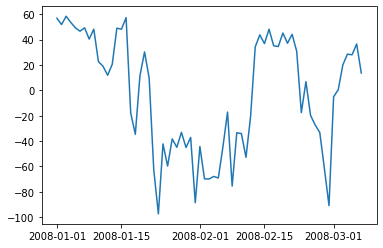

In [27]:
plt.plot(OLR_event_catalogue_at_station['8s67e']['time'][0],OLR_event_catalogue_at_station['8s67e']['olr'][0])

In [23]:
OLR_event_catalogue_at_station['8s67e']['time'][0][0:5]

DatetimeIndex(['2007-10-29 00:00:00', '2007-10-29 01:00:00',
               '2007-10-29 02:00:00', '2007-10-29 03:00:00',
               '2007-10-29 04:00:00'],
              dtype='datetime64[ns]', freq='H')

In [105]:
event_catalogue_by_station_var_1 = SST_RAMA_event_catalogue
event_catalogue_by_station_var_2 = T_air_RAMA_event_catalogue
phase_bins=np.arange(-180,181,45)


def percentile10(y):
    return(np.nanpercentile(y,10))
def percentile90(y):
    return(np.nanpercentile(y,90))
    

var_1_name = 'T_25'
var_2_name = 'AT_21'

unique_stations_var_1 = event_catalogue_by_station_var_1.keys()
unique_stations_var_2 = event_catalogue_by_station_var_2.keys()

#binned_events_by_phase['phase_bin_edges'] = phase_bins

unique_stations = list(set(unique_stations_var_1).intersection(unique_stations_var_2))
binned_lag_correlation      = {k: [] for k in unique_stations}


for i_station in unique_stations:
    #print(i_station)
    binned_lag_correlation[i_station] = {i_phase: [] for i_phase in phase_bins}
    for i_phase in phase_bins:
        binned_lag_correlation[i_station][i_phase] = {'mean':[],'90_percentile':[],'10_percentile':[], 'N_points': []}




phase_bins=np.concatenate([phase_bins,np.asarray([phase_bins[0]])])

for i_station in unique_stations:
    print(i_station)
    #binned_lag_correlation[i_station] = {'mean':[],'90_percentile':[],'10_percentile':[], 'N_points': []}
    event_correlations = []
    event_lags     = []
    
    
    correlation_for_phase = {}
    lags_for_phase        = {}
            
    for i_phase in range(0,len(phase_bins)-1):
        correlation_for_phase[i_phase] = []
        lags_for_phase[i_phase]        = [] 
    #dsa
            
    for i_event_var_1 in range(event_catalogue_by_station_var_1[i_station]['n_events']):
        start_time_var_1 = event_catalogue_by_station_var_1[i_station]['initiation_time'][i_event_var_1]
        end_time_var_1   = event_catalogue_by_station_var_1[i_station]['termination_time'][i_event_var_1]
        
        
        for i_event_var_2 in range(event_catalogue_by_station_var_2[i_station]['n_events']):
            
            start_time_var_2 = event_catalogue_by_station_var_2[i_station]['initiation_time'][i_event_var_2]
            end_time_var_2   = event_catalogue_by_station_var_2[i_station]['termination_time'][i_event_var_2]
            
            
        
            
            if (start_time_var_1 == start_time_var_2) and (end_time_var_1==end_time_var_2):
                #print(i_event_var_1)
                current_event_var_1 = event_catalogue_by_station_var_1[i_station][var_1_name][i_event_var_1]
                current_event_var_2 = event_catalogue_by_station_var_2[i_station][var_2_name][i_event_var_2]
                
                current_event_phase = event_catalogue_by_station_var_1[i_station]['PC_phase'][i_event_var_1]
                
                for i_phase in range(0,len(phase_bins)-1):
                
                
                    idx_for_phase = np.nonzero(np.logical_and(current_event_phase> phase_bins[i_phase],
                                                              current_event_phase<=phase_bins[i_phase+1] )) [0]
                
                
                    if len(idx_for_phase) !=0:                  
                        current_event_var_1_for_phase = current_event_var_1[idx_for_phase]
                        current_event_var_2_for_phase = current_event_var_2[idx_for_phase]
                
                        nan_mask_var_1 = np.isnan(current_event_var_1_for_phase)
                        nan_mask_var_2 = np.isnan(current_event_var_2_for_phase)
                        nan_mask = np.logical_or(nan_mask_var_1,nan_mask_var_2)
                
                        current_event_var_1_for_phase = current_event_var_1_for_phase[np.logical_not(nan_mask)]
                        current_event_var_2_for_phase = current_event_var_2_for_phase[np.logical_not(nan_mask)]
                        
                        
                        
                        
                        if (len(current_event_var_1_for_phase) != 0) or (len(current_event_var_2_for_phase) != 0): 
                            
                            norm_event_var_1 = (current_event_var_1_for_phase - np.nanmean(current_event_var_1_for_phase)) / (np.nanstd(current_event_var_1_for_phase) * len(current_event_var_1_for_phase))
                            norm_event_var_2 = (current_event_var_2_for_phase - np.nanmean(current_event_var_2_for_phase)) / (np.nanstd(current_event_var_2_for_phase))

                            corr = scipy_signal.correlate(norm_event_var_1, norm_event_var_2,
                                              mode='full')

                            lags = correlation_lags(len(current_event_var_1_for_phase), 
                                            len(current_event_var_2_for_phase))
                            correlation_for_phase[i_phase].append(corr)
                            lags_for_phase[i_phase].append(lags)
                    
                        else:
                            correlation_for_phase[i_phase].append([np.nan])
                            lags_for_phase[i_phase].append([np.nan])
                        #END if len
                    #END for i_phase
                #END if start_time_var_1
            # END for i_phase 
        #END for i_event_var2
    #END for i_event_var1
    
    for i_phase in range(0,len(phase_bins)-1):
        if len(lags_for_phase[i_phase]) !=0:
        
            current_bin_means, bin_edges, binnumber  = scipy_stats.binned_statistic(np.concatenate(lags_for_phase[i_phase]), 
                                                                                np.concatenate(correlation_for_phase[i_phase]), 
                                                                                np.nanmean, bins=24*np.arange(-20,21,1))
        
            binned_lag_correlation[i_station][phase_bins[i_phase]]['mean'] = current_bin_means
            
            current_bin_90th_percentile, bin_edges, binnumber  = scipy_stats.binned_statistic(np.concatenate(lags_for_phase[i_phase]), 
                                                                                np.concatenate(correlation_for_phase[i_phase]), 
                                                                                percentile90, bins=24*np.arange(-20,21,1))
            
            binned_lag_correlation[i_station][phase_bins[i_phase]]['90_percentile'] = current_bin_90th_percentile


        else:
            binned_lag_correlation[i_station][phase_bins[i_phase]] = np.nan

        
    #END for i_phase    
#END for i_station

15n90e
8s95e


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice


1.5s80.5e
15n65e
0n67e
4s67e
8s55e
12n90e


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice


0n90e
5s95e
8s67e
12s80.5e


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:93: RuntimeWarning: invalid value encountered in true_divide
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:94: RuntimeWarning: invalid value encountered in true_divide
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs

1.5n67e
4s57e
8n90e
8s80.5e
4n90e
4s80.5e


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice


1.5s67e
12s55e
8n67e
12s67e
12s93e
0n80.5e


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/scipy/stats/_binned_statistic.py:631: RuntimeWarning: Mean of empty slice


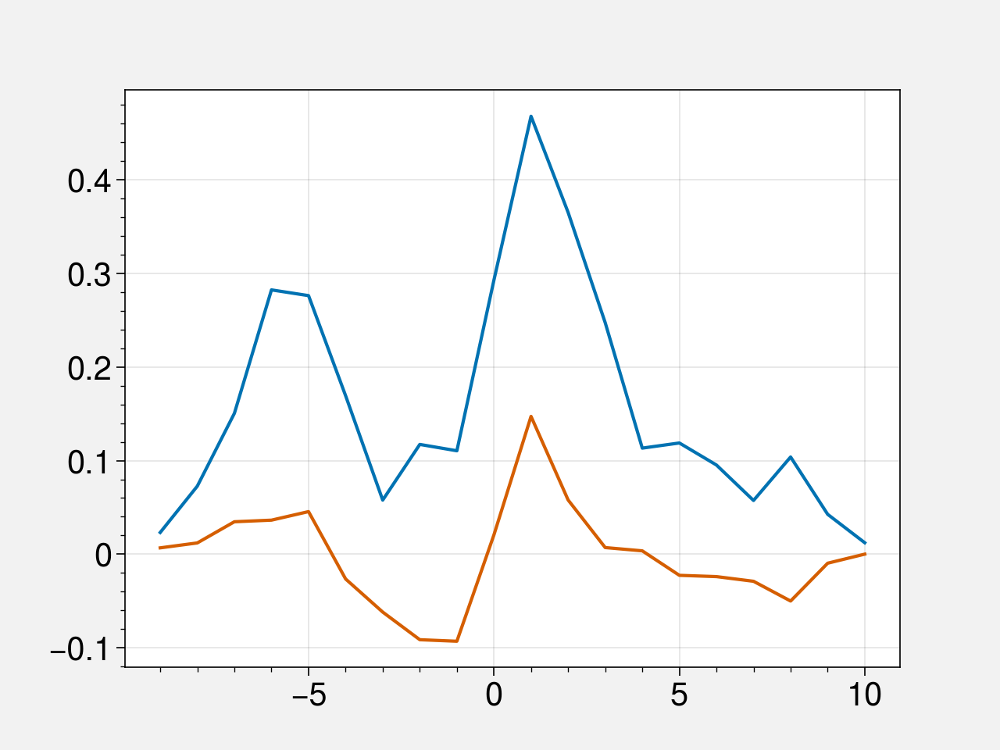

In [110]:
plt.plot(lag_bins[1::]/24,binned_lag_correlation['1.5s67e'][-180]['90_percentile'])
plt.plot(lag_bins[1::]/24,binned_lag_correlation['1.5s67e'][-180]['mean'])

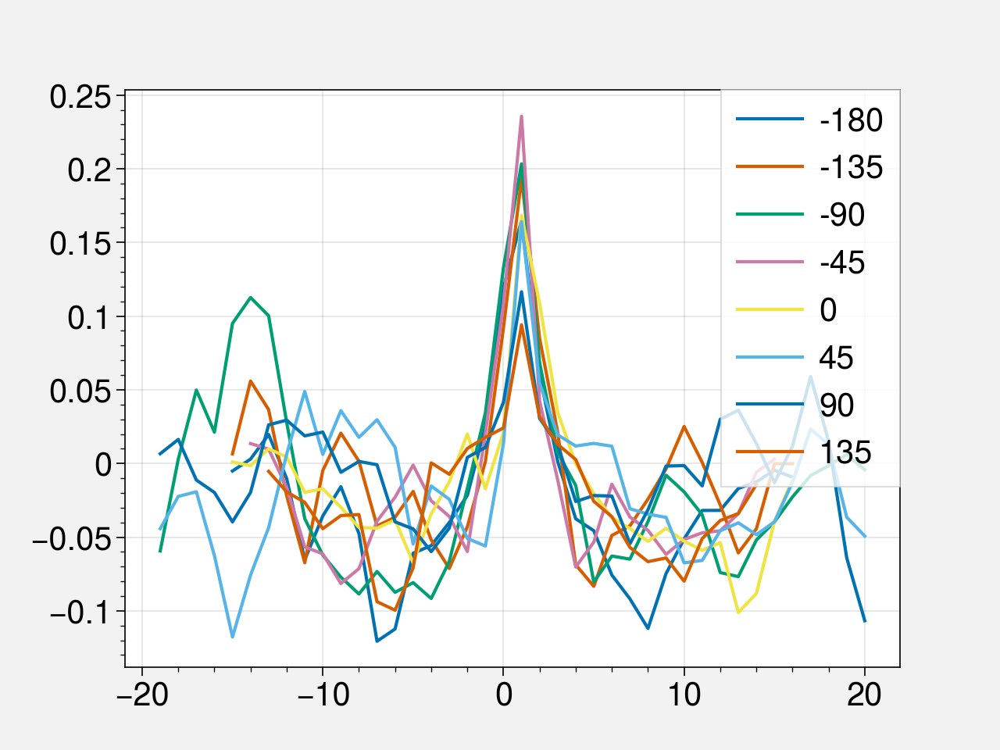

In [103]:
i_station='5s95e'

lag_bins = 24*np.arange(-20,21,1)

for i_bin in phase_bins[0:-2]:
    if not np.all(np.isnan(binned_lag_correlation[i_station][i_bin])):
        plt.plot(lag_bins[1::]/24,binned_lag_correlation[i_station][i_bin],label=i_bin)
plt.legend()


In [82]:
phases

dict_keys([-180, -135, -90, -45, 0, 45, 90, 135, 180])

In [49]:
i_phase = 7
current_bin_means, bin_edges, binnumber         = scipy_stats.binned_statistic(np.concatenate(lags_for_phase[i_phase]), 
                                                                               np.concatenate(correlation_for_phase[i_phase]), 
                                                                               np.nanmean, bins=24*np.arange(-20,21,1))

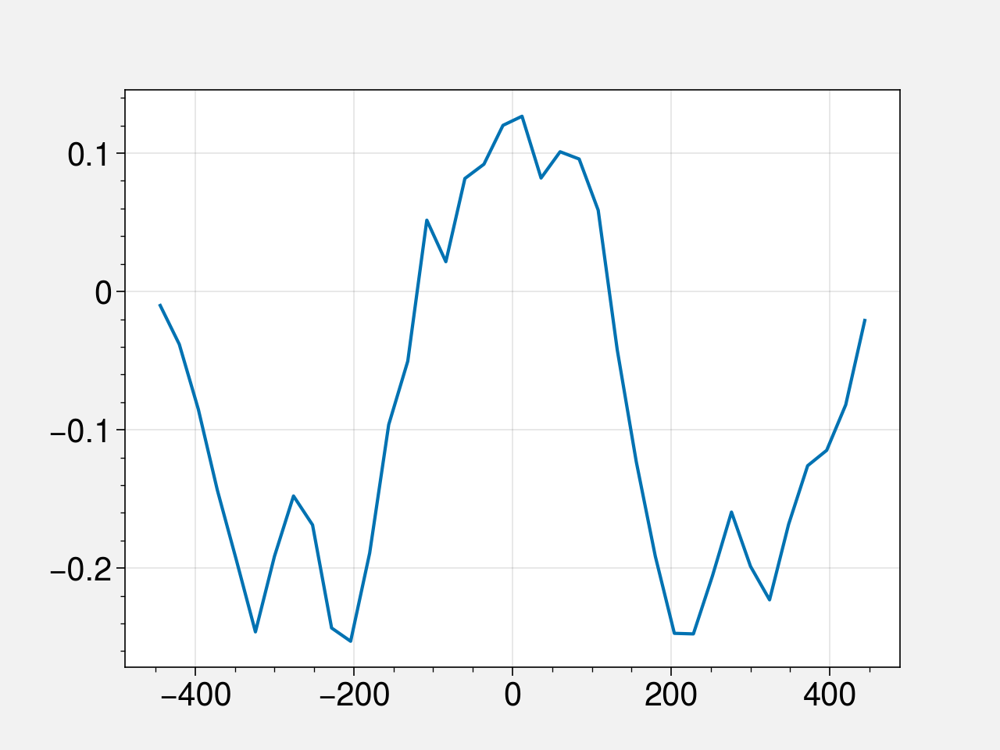

In [50]:
plt.plot(0.5*(bin_edges[1::]+bin_edges[0:-1]),current_bin_means)

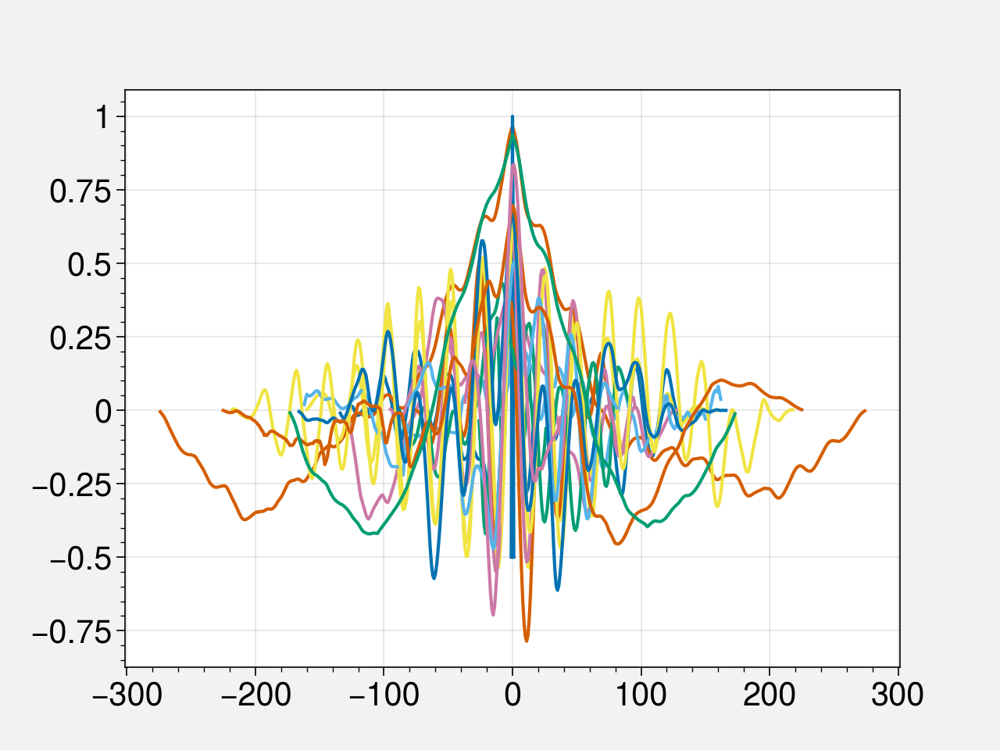

In [38]:
i_phase = 0

for i_event in range(0,len(lags_for_phase[i_phase])):

    plt.plot(lags_for_phase[i_phase][i_event],correlation_for_phase[i_phase][i_event])

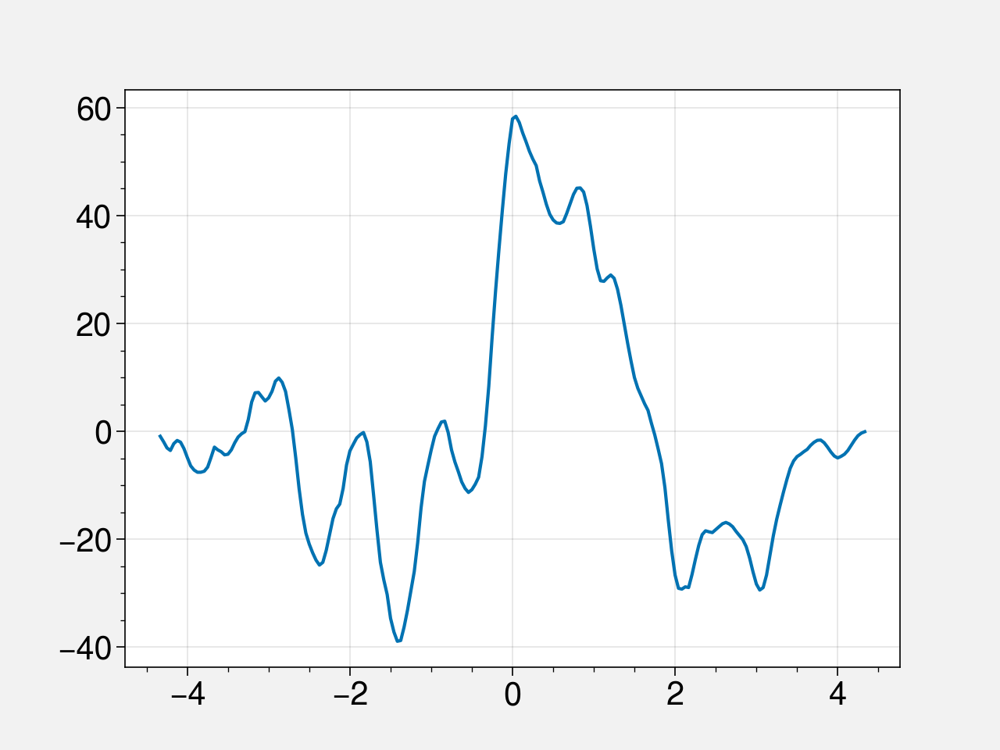

In [162]:
#for i_phase in range(0,len(phase_bins)-1):
    
#plt.plot(lags_for_phase[0],correlation_for_phase[0])
#plt.plot(lags_for_phase[2],correlation_for_phase[2])
#plt.plot(lags_for_phase[4],correlation_for_phase[4])
plt.plot(lags_for_phase[7]/24,correlation_for_phase[7])

In [157]:
correlation_for_phase[6]

array([ 1.35383952e+00,  2.76516914e+00,  3.47479701e+00,  1.66902375e+00,
       -1.70638651e-01, -2.16292691e+00, -2.72162652e+00, -3.31623721e+00,
       -4.37066412e+00, -5.20537090e+00, -7.96680975e+00, -9.26583862e+00,
       -8.06276321e+00, -5.85810852e+00, -3.47758436e+00, -2.67697144e+00,
       -2.85181427e+00, -3.36268306e+00, -2.49156094e+00, -7.58050457e-02,
        4.16904068e+00,  7.46670532e+00,  1.10112247e+01,  1.21427116e+01,
        1.25880070e+01,  1.11542864e+01,  9.80068016e+00,  7.87856865e+00,
        6.33503389e+00,  8.22571278e+00,  1.02785950e+01,  1.29847422e+01,
        1.47285509e+01,  1.40517063e+01,  1.25983057e+01,  9.38419437e+00,
        6.02803612e+00,  2.63367105e+00,  3.79262137e+00,  9.37914276e+00,
        1.75525131e+01,  2.60451794e+01,  3.31239319e+01,  3.87902031e+01,
        4.20572243e+01,  4.26363716e+01,  4.33929176e+01,  4.33674355e+01,
        4.32462158e+01,  4.33261642e+01,  4.29680710e+01,  4.01873741e+01,
        3.60602379e+01,  

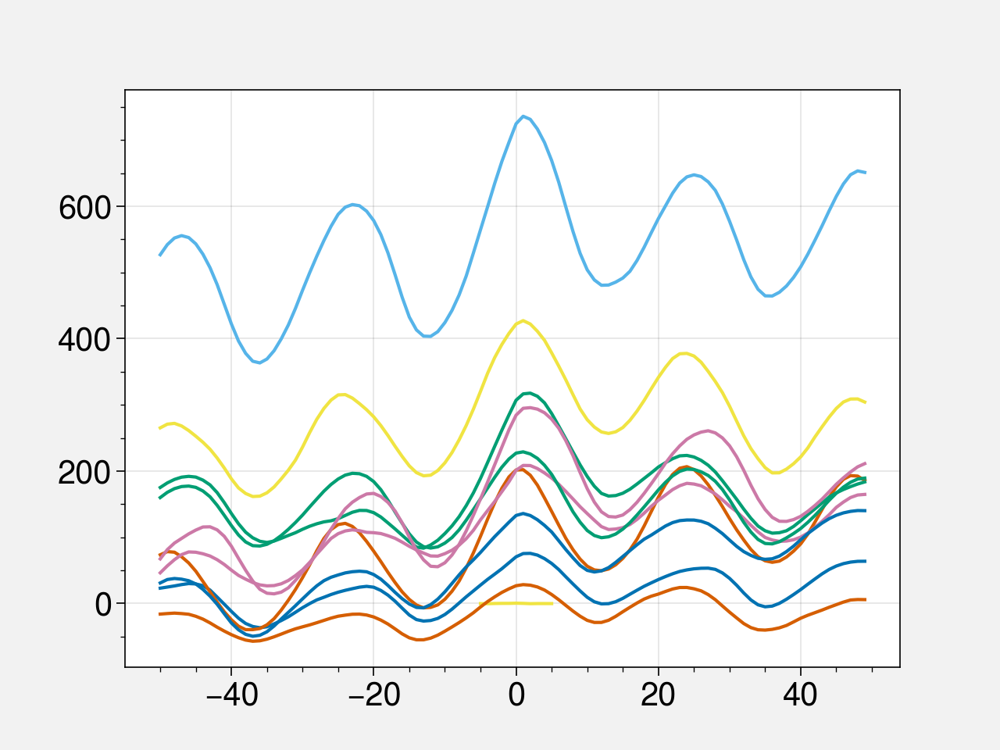

In [97]:
for i_event in range(0,len(event_correlations)):
    lags_for_plot =event_lags[i_event]
    idx_zero = np.nonzero(lags_for_plot==0)[0][0]
    
    n_lags = int(len(lags_for_plot)/2)
    plt.plot(lags_for_plot[idx_zero-50:idx_zero+50],event_correlations[i_event][idx_zero-50:idx_zero+50])

In [93]:
n_lags/2

1440.5

In [83]:
for i_event in range(event_catalogue_by_station_var_1[i_station]['n_events']):
    blah = (event_catalogue_by_station_var_1[i_station]['termination_time'][i_event] - \
    event_catalogue_by_station_var_1[i_station]['initiation_time'][i_event])/np.timedelta64(1,'D')
    print(blah)

60.0
65.0
86.0
45.0
62.0
94.0
56.0
119.0
45.0
53.0
81.0
63.0
41.0
41.0
57.0
80.0
64.0


In [62]:
event_catalogue_by_station_var_2[i_station]['initiation_time']

[numpy.datetime64('1993-12-09T00:00:00.000000000'),
 numpy.datetime64('2008-12-24T00:00:00.000000000'),
 numpy.datetime64('2009-03-13T00:00:00.000000000'),
 numpy.datetime64('2009-12-10T00:00:00.000000000'),
 numpy.datetime64('2011-03-07T00:00:00.000000000'),
 numpy.datetime64('2011-10-27T00:00:00.000000000'),
 numpy.datetime64('2011-11-24T00:00:00.000000000'),
 numpy.datetime64('2012-01-22T00:00:00.000000000'),
 numpy.datetime64('2014-01-01T00:00:00.000000000'),
 numpy.datetime64('2015-11-27T00:00:00.000000000'),
 numpy.datetime64('2016-02-05T00:00:00.000000000'),
 numpy.datetime64('2017-01-18T00:00:00.000000000'),
 numpy.datetime64('2017-12-19T00:00:00.000000000'),
 numpy.datetime64('2018-11-03T00:00:00.000000000'),
 numpy.datetime64('2019-01-23T00:00:00.000000000')]

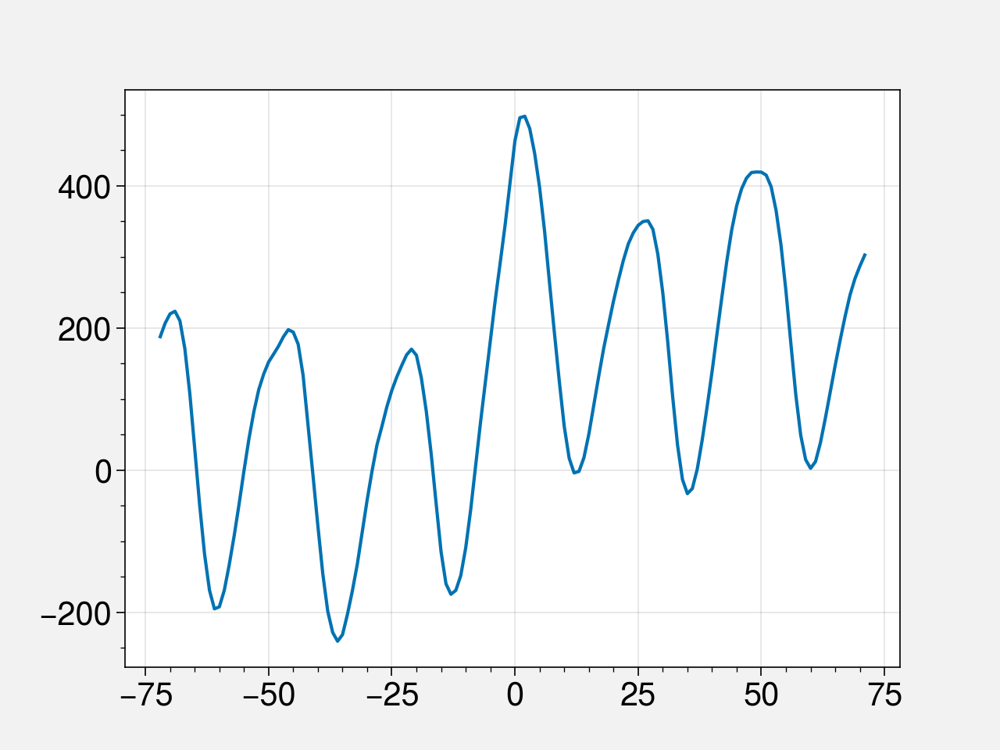

In [44]:
n_lags = lags.size
plt.plot(lags[int(n_lags/2)-72:
              int(n_lags/2)+72],corr[int(n_lags/2)-72:
              int(n_lags/2)+72])

In [7]:
def event_catalogue(input_data_array,event_object,event_magnitude,event_phase,days_before=5,days_after=5):
    
    
    event_catalogue = {input_data_array.name:[],'PC_magnitude':[],'PC_phase':[],'time':[],'days':[],
                       'initiation_time':[],'termination_time':[]}
    event_counter = 0
    
    for i_event in range(0,event_object['n_events']):
        if event_object['event_duration'][i_event]<180:
            found_overlapping_data = False

            event_start_time       = event_object['initiation_time'][i_event] -np.timedelta64(days_before,'D')
            event_termination_time = event_object['termination_time'][i_event]+np.timedelta64(days_after,'D')
           
            phase_for_event     = event_phase.sel(time=slice(event_start_time,
                                                                     event_termination_time) )
            magnitude_for_event = event_magnitude.sel(time=slice(event_start_time,
                                                                         event_termination_time))                                  
            time_to_interp = pandas.date_range(start=event_start_time,end=event_termination_time,freq='1D')

            current_data = input_data_array.squeeze().sortby(input_data_array['time'])
            test_slice = current_data.sel(time=slice(event_start_time,event_termination_time) )
            
            if test_slice.size != 0 and not np.all(np.isnan(test_slice.values)):
                         
                data_var_for_event = current_data.squeeze().interp(
                                     time=time_to_interp,method='nearest',
                                     kwargs={'fill_value':np.nan})
                
                event_catalogue[input_data_array.name].append(data_var_for_event.values)
                found_overlapping_data = True
            #END if   test_slice.size != 0  
            if found_overlapping_data:
                #print('Yay!')
                event_counter=event_counter+1
                event_catalogue['initiation_time'].append(event_start_time) 
                event_catalogue['termination_time'].append(event_termination_time) 

                
                    #event_catalogue['Sat_OLR'].append(sat_OLR_for_event.interp(time=time_to_interp,kwargs={'fill_value':np.nan}).values)
                event_catalogue['PC_magnitude'].append(magnitude_for_event.interp(time=time_to_interp,
                                                                                                     kwargs={'fill_value':np.nan}).values)
                event_catalogue['PC_phase'].append(phase_for_event.interp(time=time_to_interp,
                                                                                             kwargs={'fill_value':np.nan}).values)
                event_catalogue['time'].append(time_to_interp)
                found_overlapping_data = False
            #END if found_overlapping_data
    event_catalogue['n_events'] = event_counter
    return event_catalogue

In [8]:
RAMA_file_path = '/tube1/cha674/Tropical_Indian_Ocean/RAMA_Moorings/Update/RAMA_Array/'
atmosphere_mooring_object = RAMA_reader.construct_object_for_variables(RAMA_file_path,['SW_rad','LW_rad','Wind','T_air','RH','Rain','SLP'],sampling_frequency='hourly')
ocean_mooring_object      = RAMA_reader.construct_object_for_variables(RAMA_file_path,['T_profiles','SST','S_profiles','current_vel','ADCP','SSS'],sampling_frequency='hourly')

Looking for variable:  SW_rad
Looking for variable:  LW_rad
Looking for variable:  Wind
Looking for variable:  T_air
Looking for variable:  RH
Looking for variable:  Rain
Looking for variable:  SLP
Looking for variable:  T_profiles
Looking for variable:  SST
Looking for variable:  S_profiles
Looking for variable:  current_vel
Looking for variable:  ADCP
Looking for variable:  SSS


In [9]:
SW_rad_RAMA  = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'SW_rad')
LW_rad_RAMA  = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'LW_rad')
wind_RAMA    = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'Wind')
T_air_RAMA   = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'T_air')
RH_RAMA      = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'RH')
Rain_RAMA    = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'Rain')
SLP_RAMA     = RAMA_reader.read_data_for_variable(atmosphere_mooring_object,'SLP')

In [10]:
T_profiles_RAMA     = RAMA_reader.read_data_for_variable(ocean_mooring_object,'T_profiles')
SST_RAMA            = RAMA_reader.read_data_for_variable(ocean_mooring_object,'SST')
SSS_RAMA            = RAMA_reader.read_data_for_variable(ocean_mooring_object,'SSS')

ADCP_RAMA           = RAMA_reader.read_data_for_variable(ocean_mooring_object,'ADCP')
current_vel_RAMA    = RAMA_reader.read_data_for_variable(ocean_mooring_object,'current_vel')
S_profiles_RAMA     = RAMA_reader.read_data_for_variable(ocean_mooring_object,'S_profiles')

In [11]:
argo_climatology_file_path = '/tube1/cha674/RG_Climatology'
argo_climatology_file_name = 'RG_temperature_salinity_clim_updated_2020.dayofyear.nc'

argo_climatology = xarray.open_dataset(os.path.join(argo_climatology_file_path,argo_climatology_file_name))

argo_climatology_file_path = '/tube1/cha674/RG_Climatology'
argo_climatology_file_name = 'RG_temperature_salinity_clim_updated_2020.CT_SA.dayofyear.nc'

TEOS_10_argo_climatology = xarray.open_dataset(os.path.join(argo_climatology_file_path,argo_climatology_file_name))

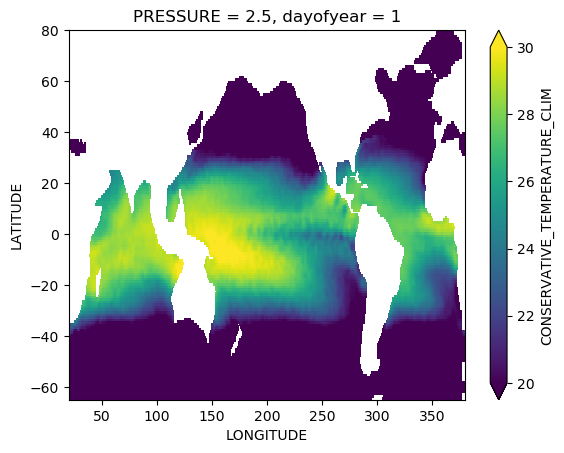

In [12]:
TEOS_10_argo_climatology['CONSERVATIVE_TEMPERATURE_CLIM'][0,0,:,:].plot(vmin=20,vmax=30)

In [13]:
#Interpolate Argo climatology SA to mooring locations and time
import xesmf

unique_moorings = T_profiles_RAMA.keys()

for i_mooring in unique_moorings:
    mooring_latitude = T_profiles_RAMA[i_mooring]['latitude'] #.values
    mooring_longitude = T_profiles_RAMA[i_mooring]['longitude'] #.values
    #print(mooring_latitude)
    #print(mooring_longitude)
    
    ds_locs = xarray.Dataset()
    ds_locs['lon'] = xarray.DataArray(data=mooring_longitude[np.newaxis], dims=('moorings'))
    ds_locs['lat'] = xarray.DataArray(data=mooring_latitude[np.newaxis], dims=('moorings'))
    
    regridder = xesmf.Regridder(TEOS_10_argo_climatology.rename({'LONGITUDE': 'lon', 'LATITUDE': 'lat'}), 
                                ds_locs, 'bilinear', locstream_out=True,reuse_weights=False)

    absolute_salt_climatology_mooring = regridder(TEOS_10_argo_climatology['ABSOLUTE_SALINITY_CLIM'])
    conservative_temperature_climatology_mooring = regridder(TEOS_10_argo_climatology['CONSERVATIVE_TEMPERATURE_CLIM'])
 
    #plt.plot(conservative_temperature_climatology_mooring.mean(dim='dayofyear').squeeze(),-TEOS_10_argo_climatology['PRESSURE'])   
    
    
    T_profiles_RAMA[i_mooring]['absolute_salinity_climatology']        = absolute_salt_climatology_mooring
    T_profiles_RAMA[i_mooring]['conservative_temperature_climatology'] = conservative_temperature_climatology_mooring
    T_profiles_RAMA[i_mooring]['climatology_pressure']                 = TEOS_10_argo_climatology['PRESSURE']
#END for i_mooring


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


Overwrite existing file: bilinear_145x360_1x1.nc 
 You can set reuse_weights=True to save computing time.


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xesmf/frontend.py:421: FutureWarning: ``output_sizes`` should be given in the ``dask_gufunc_kwargs`` parameter. It will be removed as direct parameter in a future version.
  keep_attrs=keep_attrs


In [14]:
#Using Argo SA at mooring sites/times, convert mooring in-situ temp to CT
from scipy import interpolate as scipy_interp
import gsw as TEOS_10
unique_moorings = T_profiles_RAMA.keys()

temperature_variable_name = 'T_20'
salinity_variable_name    = 'S_41'

for i_mooring in unique_moorings:
    
    print('working on mooring: ',i_mooring )
    
    #===================== Get the data for the current mooring ========================#
    
    mooring_longitude = T_profiles_RAMA[i_mooring]['longitude']
    mooring_latitude  = T_profiles_RAMA[i_mooring]['latitude']

    mooring_SA_clim = T_profiles_RAMA[i_mooring]['absolute_salinity_climatology'].squeeze()
    mooring_CT_clim = T_profiles_RAMA[i_mooring]['conservative_temperature_climatology'].squeeze()

    salinity_measured = True

    mooring_T_profile          = T_profiles_RAMA[i_mooring][temperature_variable_name]
    
    if i_mooring in S_profiles_RAMA:
        mooring_SP_profile         = S_profiles_RAMA[i_mooring][salinity_variable_name]
    else: 
        salinity_measured = False
    
    #===================== Get the pressure from depth for mooring temperature and practical salinity ========================#

    mooring_T_profile_pressure = TEOS_10.z_from_p(-mooring_T_profile['depth'],mooring_latitude)
    if salinity_measured:
        mooring_SP_profile_pressure = TEOS_10.z_from_p(-mooring_SP_profile['depth'],mooring_latitude)

    
    #======= Interpolate the Argo climatology to the depths of the current mooring temperature profiles ======================#

    climatology_pressure = mooring_SA_clim['PRESSURE']
    climatology_depth    = TEOS_10.z_from_p(climatology_pressure,mooring_latitude)
    
    interpolate_function_SA = scipy_interp.interp1d(climatology_depth, mooring_SA_clim,bounds_error=False,fill_value='extrapolate')
    interpolate_function_CT = scipy_interp.interp1d(climatology_depth, mooring_CT_clim,bounds_error=False,fill_value='extrapolate')
    
    
    mooring_SA_clim_interp = interpolate_function_SA(-mooring_T_profile['depth'])
    mooring_CT_clim_interp = interpolate_function_CT(-mooring_T_profile['depth'])

    #======= Convert to xarray data arrays for ease in temporal broadcasting  ======================#

    mooring_SA_clim_interp = xarray.DataArray(mooring_SA_clim_interp,dims=['dayofyear','depth'],
                                              coords={'dayofyear':mooring_SA_clim['dayofyear'],'depth':mooring_T_profile['depth']})
    mooring_CT_clim_interp = xarray.DataArray(mooring_CT_clim_interp,dims=['dayofyear','depth'],
                                              coords={'dayofyear':mooring_SA_clim['dayofyear'],'depth':mooring_T_profile['depth']})
    
    #======= Broadcast the climatology along the temperature time steps in get an seasonally varying reference salinity  ======================#

    mooring_SA_clim_expanded = xarray.zeros_like(mooring_T_profile) #.rename({'depth':'PRESSURE'})

    mooring_SA_clim_expanded = mooring_SA_clim_expanded.groupby('time.dayofyear')  + mooring_SA_clim_interp
    
    #======= Use the reference salinity and the measured in-situ temperature in order to calculate the 
    #Conservative temperature for the complete temperature time-series                           ======================#
    #Convert to xarray data arrays for ease in temporal broadcasting to compute anomalies

    mooring_CT_profile = TEOS_10.CT_from_t(mooring_SA_clim_expanded,mooring_T_profile,mooring_T_profile_pressure)
    mooring_CT_profile = xarray.DataArray(mooring_CT_profile,dims=['time','depth'],
                                          coords={'time':mooring_T_profile['time'],'depth':mooring_T_profile['depth']})

    #Calculate the absolute salinity from the practical salinity
    if salinity_measured:
        mooring_SA_profile = TEOS_10.SA_from_SP(mooring_SP_profile,mooring_SP_profile_pressure,mooring_longitude,mooring_latitude)
        mooring_SA_profile = xarray.DataArray(mooring_SA_profile,dims=['time','depth'],
                                          coords={'time':mooring_SP_profile['time'],'depth':mooring_SP_profile['depth']})

    #Compute the conservative temperature and absolute salinity anomalies and save them in the mooring 
    # temperature and salinity objects

    mooring_CT_profile_anom = mooring_CT_profile.groupby('time.dayofyear') - mooring_CT_clim_interp
    mooring_CT_profile_anom.compute()
    if salinity_measured:

        mooring_SA_profile_anom = mooring_SA_profile.groupby('time.dayofyear') - mooring_SA_clim_interp
        mooring_SA_profile_anom.compute()
    
    T_profiles_RAMA[i_mooring][temperature_variable_name + '_CT'] = mooring_CT_profile
    T_profiles_RAMA[i_mooring][temperature_variable_name + '_CT_anom'] = mooring_CT_profile_anom
    if salinity_measured:

        S_profiles_RAMA[i_mooring][salinity_variable_name + '_SA'] = mooring_SA_profile
        S_profiles_RAMA[i_mooring][salinity_variable_name + '_SA_anom'] = mooring_SA_profile_anom
        
    

working on mooring:  15n90e
working on mooring:  8s95e
working on mooring:  15n65e
working on mooring:  1.5s80.5e
working on mooring:  4s67e
working on mooring:  0n67e
working on mooring:  8s55e
working on mooring:  12n90e
working on mooring:  0n90e
working on mooring:  5s95e
working on mooring:  8s67e
working on mooring:  12s80.5e
working on mooring:  1.5n67e
working on mooring:  4s57e
working on mooring:  8n90e
working on mooring:  8s80.5e
working on mooring:  4n67e
working on mooring:  4n90e
working on mooring:  4s80.5e
working on mooring:  1.5s67e
working on mooring:  12s55e
working on mooring:  8n67e
working on mooring:  12s67e
working on mooring:  12s93e
working on mooring:  0n80.5e


In [15]:
RAMA_file_path = '/tube1/cha674/Tropical_Indian_Ocean/RAMA_Moorings/Update/COARE35_Fluxes' 
mooring_fluxes = RAMA_reader.read_RAMA_surface_fluxes(RAMA_file_path)

surface_flux_0n67e_hr.nc
surface_flux_0n80.5e_hr.nc
surface_flux_0n90e_hr.nc
surface_flux_1.5n67e_hr.nc
surface_flux_1.5s67e_hr.nc
surface_flux_1.5s80.5e_hr.nc
surface_flux_12n90e_hr.nc
surface_flux_12s55e_hr.nc
surface_flux_12s67e_hr.nc
surface_flux_12s80.5e_hr.nc
surface_flux_12s93e_hr.nc
surface_flux_15n65e_hr.nc
surface_flux_15n90e_hr.nc
surface_flux_4n90e_hr.nc
surface_flux_4s57e_hr.nc
surface_flux_4s67e_hr.nc
surface_flux_4s80.5e_hr.nc
surface_flux_5s95e_hr.nc
surface_flux_8n67e_hr.nc
surface_flux_8n90e_hr.nc
surface_flux_8s55e_hr.nc
surface_flux_8s67e_hr.nc
surface_flux_8s80.5e_hr.nc
surface_flux_8s95e_hr.nc


In [16]:
u_vel = ADCP_RAMA['0n80.5e']['u_1205']
u_vel = u_vel.values
mask = np.abs(u_vel)>1e5
u_vel[mask] = np.nan

v_vel = ADCP_RAMA['0n80.5e']['v_1206']
v_vel = v_vel.values
mask = np.abs(v_vel)>1e5
v_vel[mask] = np.nan

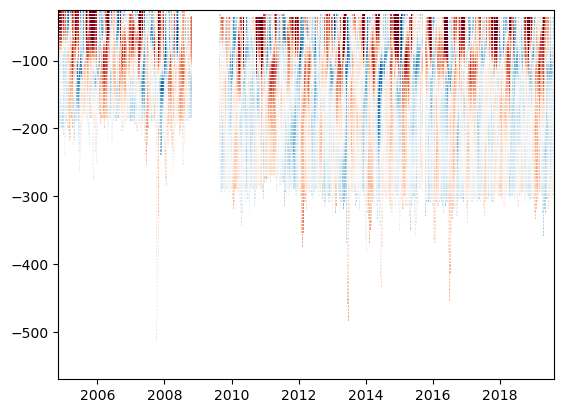

In [18]:
plt.pcolormesh(pandas.to_datetime(ADCP_RAMA['0n80.5e']['time']),-ADCP_RAMA['0n80.5e']['u_1205']['depth'],u_vel.T,vmin=-100,vmax=100,cmap=plt.cm.RdBu_r)

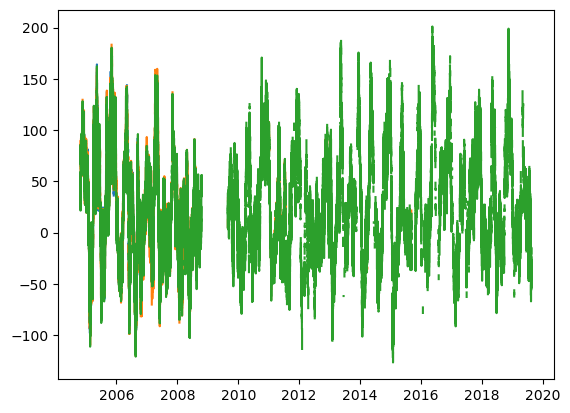

In [18]:
plt.plot(pandas.to_datetime(ADCP_RAMA['0n80.5e']['time']),u_vel[:,0])
plt.plot(pandas.to_datetime(ADCP_RAMA['0n80.5e']['time']),u_vel[:,1])
plt.plot(pandas.to_datetime(ADCP_RAMA['0n80.5e']['time']),u_vel[:,2])

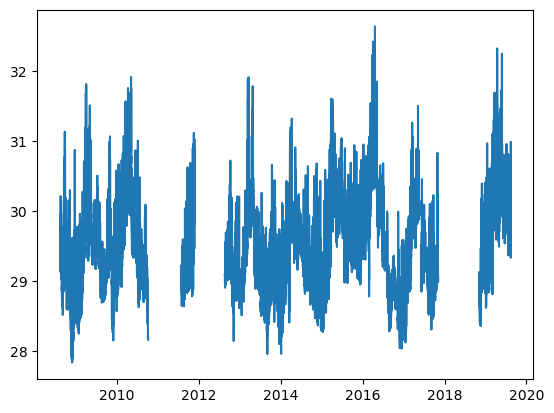

In [20]:
plt.plot(pandas.to_datetime(SST_RAMA['0n80.5e']['time']),SST_RAMA['0n80.5e']['T_25'])


In [19]:
start_date = pandas.Timestamp(1982, 1, 1)
end_date   = pandas.Timestamp(2020, 1, 1)

south_lat_lim = -40
north_lat_lim = 40

OLR_file_path ='/tube1/cha674/Tropical_Indian_Ocean/OLR_data'
OLR_file_name = 'olr.day.anom.nc'
OLR_dataset = xarray.open_dataset(os.path.join(OLR_file_path,OLR_file_name),decode_times=True,use_cftime=False)
OLR_dataset['time'] = OLR_dataset["time"].dt.floor("D")

OLR_anom = OLR_dataset['olr'].sel(time=slice(start_date,end_date),lat = slice(north_lat_lim,south_lat_lim))

In [20]:
low_pass_cut_off_period   = 20
high_pass_cut_off_period  = 200

filter_window_size = 151

low_pass_cut_off_freq = 1.0/low_pass_cut_off_period
high_pass_cut_off_freq = 1.0/high_pass_cut_off_period
   
low_pass_filter_coeffs  = scipy_signal.firwin(filter_window_size, low_pass_cut_off_freq,window='hamming',fs=1.0)
high_pass_filter_coeffs  = scipy_signal.firwin(filter_window_size, high_pass_cut_off_freq,window='hamming',fs=1.0)
    
low_pass_OLR = scipy_signal.filtfilt(low_pass_filter_coeffs, 1.0,OLR_anom.values, axis=0, padtype='odd')
temp =     low_pass_OLR-scipy_signal.filtfilt(high_pass_filter_coeffs, 1.0,low_pass_OLR, axis=0, padtype='odd')

band_pass_OLR = xarray.full_like(OLR_anom,1)
band_pass_OLR[:,:,:] = temp

In [21]:
OLR_EOF = xeof.eof(band_pass_OLR,
                    sensor_dims = ['lat', 'lon'],
                    sample_dim = 'time',
                    n_modes=20,
                    lat_name='lat')

/tube1/cha674/Tropical_Indian_Ocean/xeof.py:100: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  weight = xr.ufuncs.cos(da[lat_name] * degtorad) ** 0.5
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/xarray/core/dataarray.py:3061: FutureWarning: xarray.ufuncs is deprecated. Instead, use numpy ufuncs directly.
  da = self.__array_wrap__(f(self.variable.data, *args, **kwargs))


In [22]:
norm_OLR_PCs = OLR_EOF['pc__olr'] / OLR_EOF['pc__olr'].std(dim='time')

OLR_PC_magnitude = np.sqrt(norm_OLR_PCs[:,0]*norm_OLR_PCs[:,0] + norm_OLR_PCs[:,1]*norm_OLR_PCs[:,1])
OLR_PC_phase     = np.rad2deg(np.arctan2(-norm_OLR_PCs[:,1],norm_OLR_PCs[:,0]))

In [23]:
magnitude_threshold = 1.0
phase_partitions = np.arange(-180,180+0.1,45)


OLR_phase_composite = event_analysis.phase_composite(OLR_anom,OLR_PC_magnitude.values,OLR_PC_phase.values,phase_partitions,OLR_EOF['time'].values,
                                      sensor_dims=['lat', 'lon'],sample_dim='time',magnitude_threshold=magnitude_threshold)

In [24]:
initiation_threshold = 1.0
phase_turning_angle_threshold = 90

MJO_event = event_analysis.phase_space_event_indentification(norm_OLR_PCs.isel(mode=0).values,norm_OLR_PCs.isel(mode=1).values,norm_OLR_PCs['time'].values,
                                                             initiation_threshold,phase_turning_angle_threshold,clockwise=True)

In [25]:
unique_stations = T_air_RAMA.keys()

start_date = pandas.Timestamp(2008, 1, 1)
end_date   = pandas.Timestamp(2020, 1, 1)
OLR_event_catalogue_at_station = {k: [] for k in unique_stations}
OLR_anom_slice = OLR_anom.sel(time=slice(start_date,end_date))

for i_station in unique_stations:
    #print(i_station)
    station_lat = SST_RAMA[i_station]['latitude']
    station_lon = SST_RAMA[i_station]['longitude']

    OLR_anom_at_station = OLR_anom_slice.interp(lat=station_lat,lon=station_lon)
    OLR_event_catalogue = event_catalogue(OLR_anom_at_station,MJO_event,OLR_PC_magnitude,OLR_PC_phase,
                                          days_before=10,days_after=10)
    
    OLR_event_catalogue_at_station[i_station] = OLR_event_catalogue

/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The examples.directory rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2. In the future, examples will be found relative to the 'datapath' directory.
  self[key] = other[key]


67.0
80.5
95.0
4s67e
4s80.5e
5s95e
4s67e
4s80.5e
5s95e


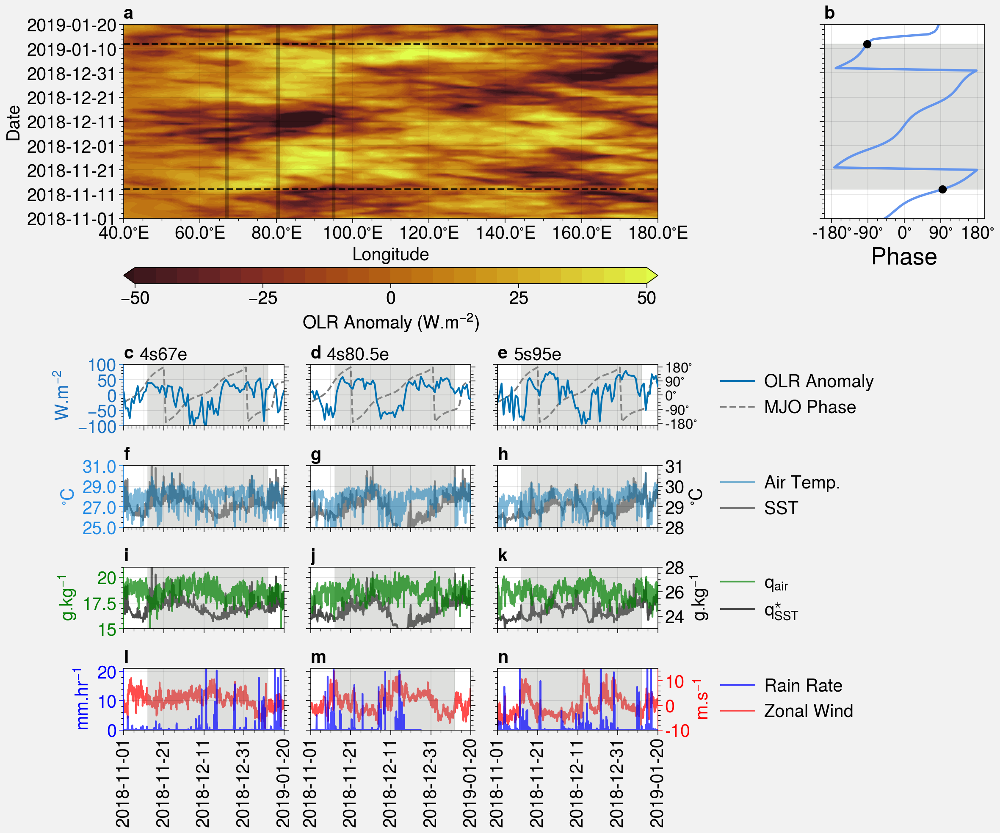

In [26]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 1,2],
    [1, 1, 1,2],
    [3, 4, 5,0],
    [6, 7, 8,0],
    [9, 10, 11,0],
    [12, 13, 14,0]
    ]


#moorings_to_plot = ['0n67e','0n80.5e','5s95e']
moorings_to_plot = ['4s67e','4s80.5e','5s95e']
fig, axs = proplot.subplots(image_drawing,proj=None,width='30cm',height='25cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

OLR_to_plot = OLR_anom.sel(time=slice(start_date_to_plot,end_date_to_plot),lat=slice(10,-10),lon=slice(40,180)).mean(dim='lat')
#OLR_to_plot = band_pass_OLR.sel(time=slice(start_date_to_plot,end_date_to_plot),lat=slice(10,-10),lon=slice(40,180)).mean(dim='lat')
axis_counter = 0

cs_olr=axs[axis_counter].contourf(OLR_to_plot['lon'].values,pandas.to_datetime(OLR_to_plot['time'].values),OLR_to_plot,
                                  levels=np.linspace(-50,50,25),cmap='Solar',extend='both')
for i_mooring in moorings_to_plot:
    station_lon = SST_RAMA[i_mooring]['longitude']
    print(station_lon)
    axs[axis_counter].axvline(x=station_lon,alpha=0.3, color='black',linewidth=3)   
    axs[axis_counter].annotate(' ', xy=(station_lon,end_date_to_plot+pandas.Timedelta(1,unit='d')),
                               xytext=(station_lon, end_date_to_plot+pandas.Timedelta(5,unit='d')), xycoords="data",fontsize=15,arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='top',)




for i_event in range(0,MJO_event['n_events']):
    if MJO_event['event_duration'][i_event]<180:
        axs[axis_counter].plot([OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()],[MJO_event['initiation_time'][i_event],MJO_event['initiation_time'][i_event]], alpha=0.8, color='black',linestyle='--')
        axs[axis_counter].plot([OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()],[MJO_event['termination_time'][i_event],MJO_event['termination_time'][i_event]], alpha=0.8, color='black',linestyle='--')


axs[axis_counter].set_xlim([OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()])
axs[axis_counter].set_ylim([start_date_to_plot,end_date_to_plot])
axs[axis_counter].set_yticks(date_ticks)
x_ticks  = np.arange(OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()+1,20)
x_tick_labels = []
for i_tick in x_ticks:
    x_tick_labels.append(str(i_tick) + '$^{\circ}$E')
axs[axis_counter].set_xticks(x_ticks)
axs[axis_counter].set_xticklabels(x_tick_labels)
axs[axis_counter].set_xlabel('Longitude')
axs[axis_counter].set_ylabel('Date')




axs[axis_counter].colorbar(cs_olr,ticks=np.arange(-50,51,25),loc='b',label='OLR Anomaly (W.m$^{-2}$)')

    
                
axis_counter = axis_counter+1
axs[axis_counter].plot(OLR_PC_phase.values,pandas.to_datetime(norm_OLR_PCs['time'].values),color='cornflowerblue',linewidth=2.0)

ln1 = axs[axis_counter].plot(OLR_PC_phase[MJO_event['initiation_index']].values,pandas.to_datetime(MJO_event['initiation_time']),'ko',label='Initiation')   
ln2 = axs[axis_counter].plot(OLR_PC_phase[MJO_event['termination_index']].values,pandas.to_datetime(MJO_event['termination_time']), 'ko',label='Termination')    
for i_event in range(0,MJO_event['n_events']):
    if MJO_event['event_duration'][i_event]<180:
        axs[axis_counter].axhspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')        

#legend_lines = ln1 + ln2
#axs[0,1].legend(legend_lines, [l.get_label() for l in legend_lines], loc='upper right')
axs[axis_counter].set_ylim([start_date_to_plot,end_date_to_plot])
axs[axis_counter].set_yticklabels([])



axs[axis_counter].set_yticks(date_ticks)
axs[axis_counter].set_xticks(np.arange(-180,181,90)) #,fontsize=15)
x_tick_labels = []
for i_phase in np.arange(-180,181,90):
    x_tick_labels.append(str(i_phase) + r'$^{\circ}$')

#axs[0,0].set_yticks(np.arange(0,3.1,1))
axs[axis_counter].set_yticklabels([])
axs[axis_counter].set_xticklabels(x_tick_labels)


axs[axis_counter].invert_xaxis()
axs[axis_counter].set_xlabel('Phase',fontsize=20)

axis_counter = axis_counter+1

#ax2 = axs[0,1].RH_RAMAx()  # instantiate a second axes that shares the same x-axis

time_to_plot = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='1H')
for i_mooring in moorings_to_plot:
    print(i_mooring)
    station_lat = SST_RAMA[i_mooring]['latitude']
    station_lon = SST_RAMA[i_mooring]['longitude']

    OLR_anom_at_station = OLR_anom.sel(time=slice(start_date_to_plot,end_date_to_plot)).interp(lat=station_lat,lon=station_lon)
    if i_mooring == moorings_to_plot[-1]:
        cline_left = axs[axis_counter].plot(OLR_anom_at_station['time'].values,OLR_anom_at_station.values,alpha=1.0,label=r'OLR Anomaly')
    else:
        axs[axis_counter].plot(OLR_anom_at_station['time'].values,OLR_anom_at_station.values,alpha=1.0)

    axs[axis_counter].set_ylim([-100,100])
    axs[axis_counter].set_yticks(np.arange(-100,101,50))
    
    if i_mooring == moorings_to_plot[0]:
        axs[axis_counter].set_ylabel('W.m$^{-2}$')
        axs[axis_counter].spines['left'].set_color('blue8')
        axs[axis_counter].yaxis.label.set_color('blue8')
        axs[axis_counter].tick_params(axis='y', colors='blue8')
    else:
        axs[axis_counter].set_yticklabels([])


    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    
    ax_right = axs[axis_counter].twinx()
    
    #ax_right.plot(pandas.to_datetime(norm_OLR_PCs['time'].values),OLR_PC_phase.values,linestyle='--',color='grey') 
    if i_mooring == moorings_to_plot[-1]:
        cline_right = ax_right.plot(pandas.to_datetime(norm_OLR_PCs['time'].values),OLR_PC_phase.values,linestyle='--',color='grey',label='MJO Phase') 
        phase_labels = [-180,-90,0,90,180]
        ax_right.set_yticks(phase_labels)
        phase_labels_ticks = []
        for i_phase in phase_labels:
            phase_labels_ticks.append(str(i_phase) + '$^{\circ}$' )
        ax_right.set_yticklabels(phase_labels_ticks,fontsize=12)
        
        
    else:
        ax_right.plot(pandas.to_datetime(norm_OLR_PCs['time'].values),OLR_PC_phase.values,linestyle='--',color='grey') 
        phase_labels = [-180,-90,0,90,180]
        ax_right.set_yticks(phase_labels)
        
        ax_right.set_yticklabels([])
    #ax_right.set_yticks(np.arange(-180,181,90))
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])

    axs[axis_counter].set_ylim([-100,100])
    axs[axis_counter].annotate(i_mooring, xy=(0.1,1.075),
                               xycoords="axes fraction",fontsize=15,)
    
    
    axis_counter = axis_counter+1
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels
#axs[axis_counter-1].legend(cline_right, loc='r', ncols=1, frame=False)

for i_mooring in moorings_to_plot:
    print(i_mooring)
    station_lat = SST_RAMA[i_mooring]['latitude']
    station_lon = SST_RAMA[i_mooring]['longitude']



    mooring_T_air_to_plot = T_air_RAMA[i_mooring]['AT_21'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    mooring_SST_to_plot = SST_RAMA[i_mooring]['T_25'].sel(time=slice(start_date_to_plot,end_date_to_plot))


    
    #axs[axis_counter].plot(mooring_T_air_to_plot['time'].values,mooring_T_air_to_plot.values,alpha=0.5,label='Air Temp.')
    cline_left = axs[axis_counter].plot(mooring_T_air_to_plot['time'].values,mooring_T_air_to_plot.values,alpha=0.5,label='Air Temp.')
 
    if i_mooring == moorings_to_plot[0]:
        #axs[axis_counter].plot(mooring_T_air_to_plot_day_ave['time'].values,mooring_T_air_to_plot_day_ave.values,alpha=1.0,label='Air Temp.')
        axs[axis_counter].set_yticks(np.arange(25,31.1,2))
        axs[axis_counter].set_yticklabels(np.arange(25,31.1,2))
        axs[axis_counter].set_ylim([25,31])
        
        axs[axis_counter].set_ylabel('$^{\circ}C$')
        axs[axis_counter].spines['left'].set_color('blue6')
        axs[axis_counter].yaxis.label.set_color('blue6')
        axs[axis_counter].tick_params(axis='y', colors='blue6')
        

    else:
        #axs[axis_counter].plot(mooring_T_air_to_plot_day_ave['time'].values,mooring_T_air_to_plot_day_ave.values,alpha=1.0,label='Air Temp.')
        axs[axis_counter].set_yticks(np.arange(25,31.1,2))
        axs[axis_counter].set_ylim([25,31])

        axs[axis_counter].set_yticklabels([])

    
    ax_right = axs[axis_counter].twinx()
    cline_right = ax_right.plot(mooring_SST_to_plot['time'].values,mooring_SST_to_plot.values,alpha=0.5,color='black',label='SST')

    if i_mooring == moorings_to_plot[-1]:
        
        
        ax_right.set_ylabel('$^{\circ}C$')
        ax_right.set_yticks([28,29,30,31])
        ax_right.set_yticklabels([28,29,30,31])
        ax_right.set_ylim([28,31])

        

    else:

        ax_right.set_yticks([28,29,30,31])
        ax_right.set_yticklabels([])
        ax_right.set_ylim([28,31])



    #ax_right.set_ylim([50,100])
    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    ax_right.set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])

    
    
    axis_counter = axis_counter+1
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels
date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='20D')

for i_mooring in moorings_to_plot:

    
    
    mooring_q_air_to_plot = mooring_fluxes[i_mooring]['specific_humidity_air'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    mooring_q_water_to_plot = 1000*mooring_fluxes[i_mooring]['specific_humidity_water'].sel(time=slice(start_date_to_plot,end_date_to_plot)) #convert to g/kg

    cline_left  = axs[axis_counter].plot(pandas.to_datetime(mooring_q_air_to_plot['time'].values),
                                             mooring_q_air_to_plot.values,color='green',alpha=0.7,label=r'$q_{air}$') 

    if i_mooring == moorings_to_plot[0]:
       
        #axs[axis_counter].set_yticks([])

        
        axs[axis_counter].spines['left'].set_color('green')
        axs[axis_counter].yaxis.label.set_color('green')
        axs[axis_counter].tick_params(axis='y', colors='green')
        axs[axis_counter].set_ylabel(r'g.kg$^{-1}$')
        
        axs[axis_counter].set_yticks([15,17.5,20])
        axs[axis_counter].set_yticklabels([15,17.5,20])
        axs[axis_counter].set_ylim([15,21])
     

        
    else:
        axs[axis_counter].set_yticklabels([])
        axs[axis_counter].set_yticks([15,17.5,20])
        axs[axis_counter].set_yticklabels([])
        axs[axis_counter].set_ylim([15,21])

        
        
    ax_right = axs[axis_counter].twinx()

    cline_right = ax_right.plot(pandas.to_datetime(mooring_q_water_to_plot['time'].values),
                               mooring_q_water_to_plot.values,color='black',alpha=0.7,label=r'$q^{\star}_{SST}$') 
 
    if i_mooring == moorings_to_plot[-1]:
       
        ax_right.spines['right'].set_color('black')
        ax_right.yaxis.label.set_color('black')
        ax_right.tick_params(axis='y', colors='black')
        ax_right.set_ylabel(r'g.kg$^{-1}$')

        ax_right.set_yticks([22,24,26,28])
        ax_right.set_yticklabels([22,24,26,28])
        ax_right.set_ylim([23,28])
        
    else:
        ax_right.set_yticklabels([])
        ax_right.set_yticks([22,24,26,28])
        ax_right.set_yticklabels([])
        ax_right.set_ylim([23,28])
    
    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])
    ax_right.set_xlim([start_date_to_plot,end_date_to_plot])

    axis_counter = axis_counter+1
    
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels


for i_mooring in moorings_to_plot:

    
    
    mooring_rain_to_plot = Rain_RAMA[i_mooring]['RN_485'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    #mooring_q_water_to_plot = 1000*mooring_fluxes[i_mooring]['specific_humidity_water'].sel(time=slice(start_date_to_plot,end_date_to_plot)) #convert to g/kg

    mooring_u_wind_to_plot = wind_RAMA[i_mooring]['WU_422'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    cline_left  = axs[axis_counter].plot(pandas.to_datetime(mooring_rain_to_plot['time'].values),
                                             mooring_rain_to_plot.values,color='blue',alpha=0.7,label=r'Rain Rate') 

    if i_mooring == moorings_to_plot[0]:
       
        axs[axis_counter].spines['left'].set_color('blue')
        axs[axis_counter].yaxis.label.set_color('blue')
        axs[axis_counter].tick_params(axis='y', colors='blue')
        axs[axis_counter].set_ylabel(r'mm.hr$^{-1}$')
        
        axs[axis_counter].set_yticks([0,10,20])
        axs[axis_counter].set_yticklabels([0,10,20])
        axs[axis_counter].set_ylim([0,21])

        
    else:
        axs[axis_counter].set_yticklabels([])
        axs[axis_counter].set_yticks([0,10,20])
        axs[axis_counter].set_yticklabels([])
        axs[axis_counter].set_ylim([0,21])
    
    ax_right = axs[axis_counter].twinx()

    cline_right = ax_right.plot(pandas.to_datetime(mooring_u_wind_to_plot['time'].values),
                               mooring_u_wind_to_plot.values,color='red',alpha=0.7,label=r'Zonal Wind') 
 
    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    
    if i_mooring == moorings_to_plot[-1]:
       
        ax_right.spines['right'].set_color('red')
        ax_right.yaxis.label.set_color('red')
        ax_right.tick_params(axis='y', colors='red')
        ax_right.set_ylabel(r'm.s$^{-1}$')
        
        ax_right.set_yticks([-10,0,10])
        ax_right.set_yticklabels([-10,0,10])
        ax_right.set_ylim([-10,15])

        
    else:
        ax_right.set_yticklabels([])
        ax_right.set_yticks([-10,0,10])
        ax_right.set_yticklabels([])
        ax_right.set_ylim([-10,15])

    
    
    axs[axis_counter].set_xticklabels(date_ticks.strftime('%Y-%m-%d'))
    axs[axis_counter].tick_params(axis='x', rotation=45)

    axis_counter = axis_counter+1
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels

    
figure_output_path = './Figures'
#figure_file_name = 'Hovmoller_Example_2018_2019_OLR_RAMA_SST_RH_SWrad_Wind_3_equator_moorings'
figure_file_name = 'Hovmoller_Example_2018_2019_OLR_RAMA_SST_specific_hum_rain_wind_3_off_equatorial_moorings'

fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')

In [22]:
mooring_fluxes['0n67e'].keys()

dict_keys(['latitude', 'longitude', 'time', 'file_path', 'data_variables', 'wind_stress', 'sensible_heat_flux', 'latent_heat_flux', 'buoyancy_flux', 'specific_humidity_air_at_location', 'specific_humidity_water_at_location', 'net_LW_at_location', 'net_SW_at_location'])

67.0
80.5
95.0
0n67e
0n80.5e
5s95e
0n67e
0n80.5e
5s95e


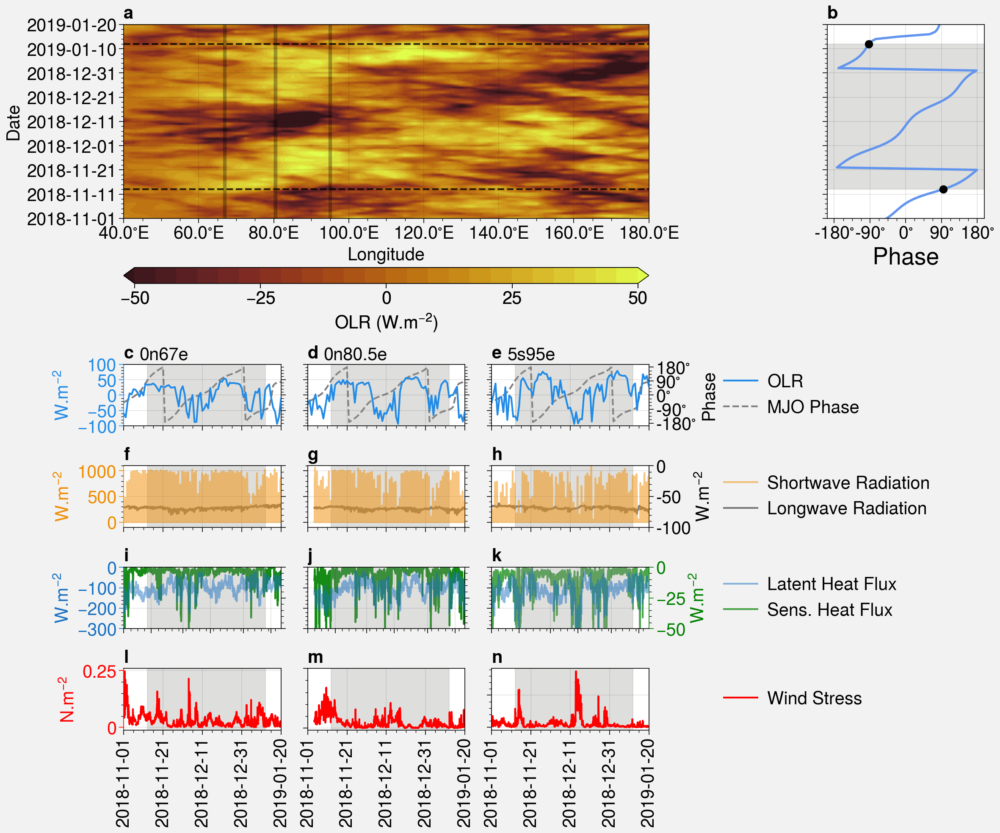

In [27]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 1,2],
    [1, 1, 1,2],
    [3, 4, 5,0],
    [6, 7, 8,0],
    [9, 10, 11,0],
    [12, 13, 14,0]
    ]


moorings_to_plot = ['0n67e','0n80.5e','5s95e']
#moorings_to_plot = ['4s57e','4s80.5e','5s95e']
fig, axs = proplot.subplots(image_drawing,proj=None,width='30cm',height='25cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

OLR_to_plot = OLR_anom.sel(time=slice(start_date_to_plot,end_date_to_plot),lat=slice(10,-10),lon=slice(40,180)).mean(dim='lat')
#OLR_to_plot = band_pass_OLR.sel(time=slice(start_date_to_plot,end_date_to_plot),lat=slice(10,-10),lon=slice(40,180)).mean(dim='lat')
axis_counter = 0

cs_olr=axs[axis_counter].contourf(OLR_to_plot['lon'].values,pandas.to_datetime(OLR_to_plot['time'].values),OLR_to_plot,
                                  levels=np.linspace(-50,50,25),cmap='Solar',extend='both')
for i_mooring in moorings_to_plot:
    station_lon = SST_RAMA[i_mooring]['longitude']
    print(station_lon)
    axs[axis_counter].axvline(x=station_lon,alpha=0.3, color='black',linewidth=3)   
    axs[axis_counter].annotate(' ', xy=(station_lon,end_date_to_plot+pandas.Timedelta(1,unit='d')),
                               xytext=(station_lon, end_date_to_plot+pandas.Timedelta(5,unit='d')), xycoords="data",fontsize=15,arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='top',)




for i_event in range(0,MJO_event['n_events']):
    if MJO_event['event_duration'][i_event]<180:
        axs[axis_counter].plot([OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()],[MJO_event['initiation_time'][i_event],MJO_event['initiation_time'][i_event]], alpha=0.8, color='black',linestyle='--')
        axs[axis_counter].plot([OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()],[MJO_event['termination_time'][i_event],MJO_event['termination_time'][i_event]], alpha=0.8, color='black',linestyle='--')


axs[axis_counter].set_xlim([OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()])
axs[axis_counter].set_ylim([start_date_to_plot,end_date_to_plot])
axs[axis_counter].set_yticks(date_ticks)
x_ticks  = np.arange(OLR_to_plot['lon'].min(),OLR_to_plot['lon'].max()+1,20)
x_tick_labels = []
for i_tick in x_ticks:
    x_tick_labels.append(str(i_tick) + '$^{\circ}$E')
axs[axis_counter].set_xticks(x_ticks)
axs[axis_counter].set_xticklabels(x_tick_labels)
axs[axis_counter].set_xlabel('Longitude')
axs[axis_counter].set_ylabel('Date')




axs[axis_counter].colorbar(cs_olr,ticks=np.arange(-50,51,25),loc='b',label='OLR (W.m$^{-2}$)')

    
                
axis_counter = axis_counter+1
axs[axis_counter].plot(OLR_PC_phase.values,pandas.to_datetime(norm_OLR_PCs['time'].values),color='cornflowerblue',linewidth=2.0)

ln1 = axs[axis_counter].plot(OLR_PC_phase[MJO_event['initiation_index']].values,pandas.to_datetime(MJO_event['initiation_time']),'ko',label='Initiation')   
ln2 = axs[axis_counter].plot(OLR_PC_phase[MJO_event['termination_index']].values,pandas.to_datetime(MJO_event['termination_time']), 'ko',label='Termination')    
for i_event in range(0,MJO_event['n_events']):
    if MJO_event['event_duration'][i_event]<180:
        axs[axis_counter].axhspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')        

#legend_lines = ln1 + ln2
#axs[0,1].legend(legend_lines, [l.get_label() for l in legend_lines], loc='upper right')
axs[axis_counter].set_ylim([start_date_to_plot,end_date_to_plot])
axs[axis_counter].set_yticklabels([])



axs[axis_counter].set_yticks(date_ticks)
axs[axis_counter].set_xticks(np.arange(-180,181,90)) #,fontsize=15)
x_tick_labels = []
for i_phase in np.arange(-180,181,90):
    x_tick_labels.append(str(i_phase) + r'$^{\circ}$')

#axs[0,0].set_yticks(np.arange(0,3.1,1))
axs[axis_counter].set_yticklabels([])
axs[axis_counter].set_xticklabels(x_tick_labels)


axs[axis_counter].invert_xaxis()
axs[axis_counter].set_xlabel('Phase',fontsize=20)

axis_counter = axis_counter+1

#ax2 = axs[0,1].RH_RAMAx()  # instantiate a second axes that shares the same x-axis
date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='20D')

time_to_plot = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='1H')
for i_mooring in moorings_to_plot:
    print(i_mooring)
    station_lat = SST_RAMA[i_mooring]['latitude']
    station_lon = SST_RAMA[i_mooring]['longitude']

    OLR_anom_at_station = OLR_anom.sel(time=slice(start_date_to_plot,end_date_to_plot)).interp(lat=station_lat,lon=station_lon)
    if i_mooring == moorings_to_plot[-1]:
        cline_left = axs[axis_counter].plot(OLR_anom_at_station['time'].values,OLR_anom_at_station.values,alpha=1.0,label='OLR',color='blue6')
    else:
        axs[axis_counter].plot(OLR_anom_at_station['time'].values,OLR_anom_at_station.values,alpha=1.0,color='blue6')

    axs[axis_counter].set_ylim([-100,100])
    axs[axis_counter].set_yticks(np.arange(-100,101,50))
    
    if i_mooring == moorings_to_plot[0]:
        axs[axis_counter].set_ylabel('W.m$^{-2}$')
        axs[axis_counter].spines['left'].set_color('blue6')
        axs[axis_counter].yaxis.label.set_color('blue6')
        axs[axis_counter].tick_params(axis='y', colors='blue6')
    else:
        axs[axis_counter].set_yticklabels([])


    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    
    ax_right = axs[axis_counter].twinx()
    
    #ax_right.plot(pandas.to_datetime(norm_OLR_PCs['time'].values),OLR_PC_phase.values,linestyle='--',color='grey') 
    if i_mooring == moorings_to_plot[-1]:
        cline_right = ax_right.plot(pandas.to_datetime(norm_OLR_PCs['time'].values),OLR_PC_phase.values,linestyle='--',color='grey',label='MJO Phase')
        ax_right.set_ylabel('Phase')
        
        phase_labels = [-180,-90,0,90,180]
        ax_right.set_yticks(phase_labels)
        phase_labels_ticks = []
        for i_phase in phase_labels:
            phase_labels_ticks.append(str(i_phase) + '$^{\circ}$' )
        ax_right.set_yticklabels(phase_labels_ticks)
                                      
        
    else:
        ax_right.plot(pandas.to_datetime(norm_OLR_PCs['time'].values),OLR_PC_phase.values,linestyle='--',color='grey') 
        ax_right.set_yticklabels([])
        #ax_right.set_ylabel('Phase ($^{\circ}$)')
        
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])

    axs[axis_counter].set_ylim([-100,100])
    axs[axis_counter].annotate(i_mooring, xy=(0.1,1.075),
                               xycoords="axes fraction",fontsize=15,)
    
    
    axis_counter = axis_counter+1
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels
#axs[axis_counter-1].legend(cline_right, loc='r', ncols=1, frame=False)

for i_mooring in moorings_to_plot:

    mooring_SW_rad_to_plot = SW_rad_RAMA[i_mooring]['RD_495'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    mooring_LW_rad_to_plot = mooring_fluxes[i_mooring]['net_LW'].sel(time=slice(start_date_to_plot,end_date_to_plot)) # -400


    if i_mooring == moorings_to_plot[0]:
        cline_left = axs[axis_counter].plot(mooring_SW_rad_to_plot['time'].values,mooring_SW_rad_to_plot.values,alpha=0.5,color='yellow8',label='Shortwave Radiation') 

        axs[axis_counter].set_yticks([0,500,1000])

        axs[axis_counter].set_yticklabels([0,500,1000])
        axs[axis_counter].set_ylabel('W.m$^{-2}$') #,colors='yellow8')
        axs[axis_counter].spines['left'].set_color('yellow8')
        axs[axis_counter].yaxis.label.set_color('yellow8')
        axs[axis_counter].tick_params(axis='y', colors='yellow8')
        
        

        
    else:
        axs[axis_counter].plot(mooring_SW_rad_to_plot['time'].values,mooring_SW_rad_to_plot.values,alpha=0.5,color='yellow8')
        axs[axis_counter].set_yticks([0,500,1000])
        axs[axis_counter].set_yticklabels([])
    
    
    ax_right = axs[axis_counter].twinx()
    
    
    if i_mooring == moorings_to_plot[-1]:
        cline_right = ax_right.plot(mooring_LW_rad_to_plot['time'].values,-mooring_LW_rad_to_plot.values,alpha=0.5,color='black',label='Longwave Radiation') 
        ax_right.set_yticks([-100,-50,0])

        ax_right.set_yticklabels([-100,-50,0])
        ax_right.set_ylabel('W.m$^{-2}$') #,colors='yellow8')
        ax_right.spines['right'].set_color('black')
        ax_right.yaxis.label.set_color('black')
        ax_right.tick_params(axis='y', colors='black')
    else:
        ax_right.plot(mooring_LW_rad_to_plot['time'].values,-mooring_LW_rad_to_plot.values,alpha=0.5,color='black',label='Longwave Radiation') 
        ax_right.set_yticks([-100,-50,0])

        ax_right.set_yticklabels([])
        
        
        
    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])
    axs[axis_counter].set_xticks(date_ticks) 

    axs[axis_counter].set_ylim([-100,1100])
    ax_right.set_ylim([-100,0])

    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])
    
    axis_counter = axis_counter+1

    
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels



for i_mooring in moorings_to_plot:
    print(i_mooring)
    station_lat = SST_RAMA[i_mooring]['latitude']
    station_lon = SST_RAMA[i_mooring]['longitude']


    mooring_latent_to_plot   = -mooring_fluxes[i_mooring]['latent_heat_flux'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    mooring_sensible_to_plot = -mooring_fluxes[i_mooring]['sensible_heat_flux'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    #mooring_T_air_to_plot_day_ave = mooring_T_air_to_plot.resample(time='1D').mean()
    
            
    if i_mooring == moorings_to_plot[0]:
        cline_left = axs[axis_counter].plot(mooring_latent_to_plot['time'].values,
                                            mooring_latent_to_plot.values,alpha=0.5,label='Latent Heat Flux',color='blue8')
        axs[axis_counter].set_ylim(-300,1)
        axs[axis_counter].set_yticks(np.arange(-300,1,100))
        axs[axis_counter].set_ylabel('W.m$^{-2}$')

        axs[axis_counter].spines['left'].set_color('blue8')
        axs[axis_counter].yaxis.label.set_color('blue8')
        axs[axis_counter].tick_params(axis='y', colors='blue8')
        #axs[axis_counter].plot(mooring_T_air_to_plot_day_ave['time'].values,mooring_T_air_to_plot_day_ave.values,alpha=1.0,label='Air Temp.')
        
    else:
        axs[axis_counter].plot(mooring_latent_to_plot['time'].values,mooring_latent_to_plot.values,alpha=0.5,label='Latent heat flux',color='blue8')
        axs[axis_counter].set_ylim(-300,1)
        axs[axis_counter].set_yticks(np.arange(-300,1,100))
        axs[axis_counter].set_yticklabels([])

        #axs[axis_counter].plot(mooring_T_air_to_plot_day_ave['time'].values,mooring_T_air_to_plot_day_ave.values,alpha=1.0,label='Air Temp.')


  
    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    
    ax_right = axs[axis_counter].twinx()
    
    if i_mooring == moorings_to_plot[-1]:
        cline_right = ax_right.plot(mooring_sensible_to_plot['time'].values,mooring_sensible_to_plot.values,color='green',alpha=0.7,label='Sens. Heat Flux') 
        
        ax_right.set_ylim([-50,0])
        ax_right.set_yticks(np.arange(-50,1,25))
        ax_right.set_ylabel('W.m$^{-2}$')
        ax_right.spines['right'].set_color('green')
        ax_right.yaxis.label.set_color('green')
        ax_right.tick_params(axis='y', colors='green')
        
    else:
        ax_right.plot(mooring_sensible_to_plot['time'].values,mooring_sensible_to_plot.values,color='green',alpha=0.7) 
        ax_right.plot(mooring_sensible_to_plot['time'].values,mooring_sensible_to_plot.values,color='green',alpha=0.7) 
        ax_right.set_ylim([-50,0])
        ax_right.set_yticks(np.arange(-50,1,25))

        ax_right.set_yticklabels([])
        

    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticklabels([])
    #axs[axis_counter].tick_params(axis='x', rotation=45)

    axis_counter = axis_counter+1
axs[axis_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels
 

for i_mooring in moorings_to_plot:

    #mooring_SW_rad_to_plot = SW_rad_RAMA[i_mooring]['RD_495'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    mooring_u_wind_to_plot = mooring_fluxes[i_mooring]['wind_stress'].sel(time=slice(start_date_to_plot,end_date_to_plot))
    #mooring_LW_rad_to_plot = mooring_fluxes[i_mooring]['net_LW'].sel(time=slice(start_date_to_plot,end_date_to_plot)) # -400


        
  
    if i_mooring != moorings_to_plot[0]:
        axs[axis_counter].plot(mooring_u_wind_to_plot['time'].values,mooring_u_wind_to_plot.values,alpha=1.0,color='red') #,label='Zonal wind') 

        axs[axis_counter].set_yticks([0,0.5])
        axs[axis_counter].set_yticklabels([])
        
    else:
        cline = axs[axis_counter].plot(mooring_u_wind_to_plot['time'].values,mooring_u_wind_to_plot.values,alpha=1.0,color='red',label='Wind Stress')
        axs[axis_counter].set_ylabel('N.m$^{-2}$')
        axs[axis_counter].spines['left'].set_color('red')
        axs[axis_counter].yaxis.label.set_color('red')
        axs[axis_counter].tick_params(axis='y', colors='red')
        
    for i_event in range(0,MJO_event['n_events']):
        if MJO_event['event_duration'][i_event]<180:
            axs[axis_counter].axvspan(pandas.to_datetime(MJO_event['termination_time'][i_event]), pandas.to_datetime(MJO_event['initiation_time'][i_event]),alpha=0.3, color='gray')
    
    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticks(date_ticks)
    axs[axis_counter].set_xticklabels([])
    axs[axis_counter].set_xticks(date_ticks) 

    #axs[axis_counter].set_ylim([0,1100])

    axs[axis_counter].set_xlim([start_date_to_plot,end_date_to_plot])
    axs[axis_counter].set_xticklabels(date_ticks.strftime('%Y-%m-%d'))
    axs[axis_counter].tick_params(axis='x', rotation=45)
    

    axis_counter = axis_counter+1
axs[axis_counter-1].legend(cline, loc='r', ncols=1, frame=False)  # manually override labels


    
date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='20D')


    
figure_output_path = './Figures'
figure_file_name = 'Hovmoller_Example_2018_2019_OLR_LW_RAMA_fluxes_3_equator_moorings'
#figure_file_name = 'Hovmoller_Example_2018_2019_OLR_LW_RAMA_fluxes_3_south_off_equator_moorings'

fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')


In [28]:
filtered_MJO_event = dict.fromkeys(MJO_event.keys(),[])


filtered_initialisation_time = []
filtered_termination_time    = []
filtered_initiation_index    = []
filtered_termination_index   = []
filtered_peak_time           = []
filtered_peak_index          = []
filtered_event_duration      = []

taget_months = [11,12,1,2,3]

event_counter = 0
for i_event in range(0,MJO_event['n_events']):
    if pandas.to_datetime(MJO_event['initiation_time'][i_event]).month in taget_months:
        
        filtered_initialisation_time.append(MJO_event['initiation_time'][i_event])
        filtered_termination_time.append(MJO_event['termination_time'][i_event])

        filtered_initiation_index .append(MJO_event['initiation_index'][i_event])
        filtered_termination_index.append(MJO_event['termination_index'][i_event])
        
        filtered_peak_time.append(MJO_event['peak_time'][i_event])
        filtered_peak_index.append(MJO_event['peak_index'][i_event])
        
        filtered_event_duration.append(MJO_event['event_duration'][i_event])

        event_counter = event_counter+1
        
        
filtered_MJO_event['n_events'] = event_counter
filtered_MJO_event['initiation_time']   = filtered_initialisation_time
filtered_MJO_event['termination_time']  = filtered_termination_time
filtered_MJO_event['initiation_index']  = filtered_initiation_index
filtered_MJO_event['termination_index'] = filtered_termination_index
filtered_MJO_event['peak_time']         = filtered_peak_time
filtered_MJO_event['peak_index']        = filtered_peak_index
filtered_MJO_event['event_duration']    = filtered_event_duration

In [29]:
days_before = 2
days_after  = 2


MJO_events_to_get = filtered_MJO_event

data_vars_to_get = ['AT_21']
T_air_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(T_air_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                             data_vars_to_get,days_before=days_before,days_after=days_after)

data_vars_to_get = ['T_25']
SST_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(SST_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                            days_before=days_before,days_after=days_after)
data_vars_to_get = ['RH_910']
RH_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(RH_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                          days_before=days_before,days_after=days_after)
data_vars_to_get = ['RN_485']
Rain_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(Rain_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,days_before=5,days_after=5)

data_vars_to_get = ['RD_495']
SW_rad_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(SW_rad_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                              data_vars_to_get,days_before=days_before,days_after=days_after)

data_vars_to_get = ['Ql_136']
LW_rad_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(LW_rad_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                              data_vars_to_get,days_before=days_before,days_after=days_after)

data_vars_to_get = ['RN_485']
rain_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(Rain_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                            data_vars_to_get,days_before=days_before,days_after=days_after)

data_vars_to_get = ['WU_422']
wind_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(wind_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                            data_vars_to_get,days_before=days_before,days_after=days_after)

data_vars_to_get = ['wind_stress']
wind_stress_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                  days_before=days_before,days_after=days_after)
data_vars_to_get = ['sensible_heat_flux']
sens_heat_flux_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                  days_before=days_before,days_after=days_after)

data_vars_to_get = ['latent_heat_flux']
latent_heat_flux_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                  days_before=days_before,days_after=days_after)

data_vars_to_get = ['net_LW']
net_LW_heat_flux_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                  days_before=days_before,days_after=days_after)

data_vars_to_get = ['net_SW']
net_SW_heat_flux_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                  days_before=days_before,days_after=days_after)

data_vars_to_get = ['specific_humidity_air']
specific_humidity_air_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                  days_before=days_before,days_after=days_after)

data_vars_to_get = ['specific_humidity_water']
specific_humidity_water_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
                                                                               days_before=days_before,days_after=days_after)



#data_vars_to_get = ['buoyancy_flux']
#buoyancy_flux_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(mooring_fluxes,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,data_vars_to_get,
#                                                                  days_before=days_before,days_after=days_after)

In [30]:
#T_profiles_binned_by_phase = bin_events_over_phase(T_profiles_RAMA_event_catalogue, 'T_20')
OLR_binned_by_phase = bin_events_over_phase(OLR_event_catalogue_at_station, 'olr')

T_air_RAMA_binned_by_phase = bin_events_over_phase(T_air_RAMA_event_catalogue, 'AT_21')
SST_RAMA_binned_by_phase   = bin_events_over_phase(SST_RAMA_event_catalogue,   'T_25')
Rain_RAMA_binned_by_phase  = bin_events_over_phase(rain_RAMA_event_catalogue,  'RN_485')


specific_humidity_air_RAMA_binned_by_phase = bin_events_over_phase(specific_humidity_air_RAMA_event_catalogue,     'specific_humidity_air') 
specific_humidity_water_RAMA_binned_by_phase = bin_events_over_phase(specific_humidity_water_RAMA_event_catalogue, 'specific_humidity_water') 
u_wind_RAMA_binned_by_phase = bin_events_over_phase(wind_RAMA_event_catalogue, 'WU_422')


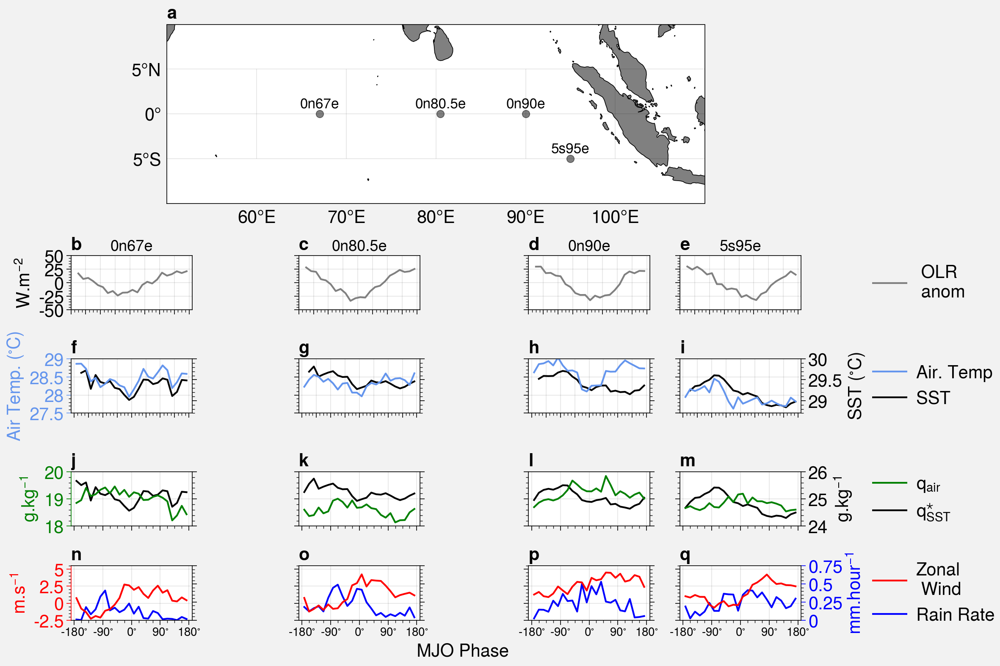

In [28]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 1,1],
    [1, 1, 1,1],
    [2, 3, 4,5],
    [6, 7, 8,9],        
    [10,11,12,13],
    [14,15,16,17]]

proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
#moorings_to_plot = ['4s57e','4s67e','4s80.5e','5s95e']

lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='20cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])

    
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)
    
    
axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (50,110),
                labels=True,land=True,coast=True,latlines=[-5,0,5]) #lonlines=np.arange(60,110,30))



image_counter = 1
for i_mooring in moorings_to_plot:
    cline_left = axs[image_counter].plot(0.5*(OLR_binned_by_phase['phase_bin_edges'][0:-1]+OLR_binned_by_phase['phase_bin_edges'][1::])[1::],
                 OLR_binned_by_phase[i_mooring]['mean'][1::],'grey',label=' OLR\n anom')
    #axs[image_counter].plot(0.5*(OLR_binned_by_phase['phase_bin_edges'][0:-1]+OLR_binned_by_phase['phase_bin_edges'][1::])[1::],
    #             OLR_binned_by_phase[i_mooring]['90_percentile'][1::],'grey',label=' OLR\n anom',linestyle='--')
    #axs[image_counter].plot(0.5*(OLR_binned_by_phase['phase_bin_edges'][0:-1]+OLR_binned_by_phase['phase_bin_edges'][1::])[1::],
    #             OLR_binned_by_phase[i_mooring]['10_percentile'][1::],'grey',label=' OLR\n anom',linestyle='--')

    
    # 
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    axs[image_counter].set_ylim([-50,50])
    axs[image_counter].set_yticks([-50,-25,0,25,50])
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_ylabel('W.m$^{-2}$')

        axs[image_counter].set_yticklabels([-50,-25,0,25,50])
    else:
        axs[image_counter].set_yticklabels([])

    axs[image_counter].annotate(i_mooring,
            xy=(0.5, 1.03), xycoords='axes fraction',
            horizontalalignment='center',
            verticalalignment='bottom',fontsize=13,color='black')
    
    
    
    
    image_counter = image_counter+1
    

    
    
axs[image_counter-1].legend(cline_left, loc='r', ncols=1, frame=False)  # manually override labels

for i_mooring in moorings_to_plot:
    cline_left = axs[image_counter].plot(0.5*(T_air_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+T_air_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                                         T_air_RAMA_binned_by_phase[i_mooring]['mean'],'cornflowerblue',label='Air. Temp')
    
    axs[image_counter].set_yticks([27.5,28,28.5,29])
    axs[image_counter].set_ylim([27.5,29])

    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_yticklabels([27.5,28,28.5,29])
        axs[image_counter].set_ylabel('Air Temp. ($^{\circ}$C)')

        #axs[image_counter].spines['left'].set_color('blue4')
        axs[image_counter].yaxis.label.set_color('cornflowerblue')
        axs[image_counter].tick_params(axis='y', colors='cornflowerblue')
    else:
        axs[image_counter].set_yticklabels([])

    ax_right = axs[image_counter].twinx()

                                         
    cline_right = ax_right.plot(0.5*(SST_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+SST_RAMA_binned_by_phase['phase_bin_edges'][1::])[1::],
                                               SST_RAMA_binned_by_phase[i_mooring]['mean'][1::],'black',label='SST')
    ax_right.set_yticks([29,29.5,30])
    ax_right.set_ylim([28.7,30])

    if i_mooring == moorings_to_plot[-1]:
        ax_right.set_ylabel('SST ($^{\circ}$C)')

        ax_right.set_yticklabels([29,29.5,30])
    else:
        ax_right.set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
    #axs[image_counter].set_ylim([29,29.5,30])
    #ax_right.set_ylim([27.5,30])


    image_counter = image_counter+1

axs[image_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels


for i_mooring in moorings_to_plot:
    
    #cline_left = axs[image_counter].plot(0.5*(SST_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+SST_RAMA_binned_by_phase['phase_bin_edges'][1::])[1::],
    #          SST_RAMA_binned_by_phase[i_mooring]['mean'][1::],'black',label='SST')
    
    #cline_left = axs[image_counter].plot(0.5*(RH_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+RH_RAMA_binned_by_phase['phase_bin_edges'][1::]),
    #                        RH_RAMA_binned_by_phase[i_mooring]['mean'],'green',label='RH')
    
    cline_left = axs[image_counter].plot(0.5*(specific_humidity_air_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+specific_humidity_air_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                            specific_humidity_air_RAMA_binned_by_phase[i_mooring]['mean'],'green',label=r'$q_{air}$')
    
    axs[image_counter].set_ylim([18,20])
    axs[image_counter].set_yticks([18,19,20])
    
    
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_yticklabels([18,19,20])
        axs[image_counter].set_ylabel(r'g.kg$^{-1}$')

        axs[image_counter].spines['left'].set_color('green')
        axs[image_counter].yaxis.label.set_color('green')
        axs[image_counter].tick_params(axis='y', colors='green')
    else:
        axs[image_counter].set_yticklabels([])


    ax_right = axs[image_counter].twinx()

    cline_right = ax_right.plot(0.5*(specific_humidity_water_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+specific_humidity_water_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                            1000 * specific_humidity_water_RAMA_binned_by_phase[i_mooring]['mean'],'black',label=r'$q^{\star}_{SST}$')
    
    
    ax_right.set_ylim([24,26])
    ax_right.set_yticks([24,25,26])
    if i_mooring == moorings_to_plot[-1]:
        ax_right.set_yticklabels([24,25,26])
        ax_right.set_ylabel(r'g.kg$^{-1}$')

        #ax_right.spines['right'].set_color('red')
        ax_right.yaxis.label.set_color('black')
        ax_right.tick_params(axis='y', colors='black')
    else:
        ax_right.set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,90))
    axs[image_counter].set_xticklabels([])

    #phases = []
    #for i_phase in np.arange(-180,181,90):
    #    phases.append(str(i_phase) + '$^{\circ}$')
    #axs[image_counter].set_xticklabels(phases,fontsize=10)
    
    #if i_mooring == moorings_to_plot[1]:
    #    axs[image_counter].set_xlabel('                                    MJO Phase')
    
    
    image_counter = image_counter+1
    
axs[image_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels

for i_mooring in moorings_to_plot:
    
    #cline_left = axs[image_counter].plot(0.5*(SST_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+SST_RAMA_binned_by_phase['phase_bin_edges'][1::])[1::],
    #          SST_RAMA_binned_by_phase[i_mooring]['mean'][1::],'black',label='SST')
    
    #cline_left = axs[image_counter].plot(0.5*(RH_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+RH_RAMA_binned_by_phase['phase_bin_edges'][1::]),
    #                        RH_RAMA_binned_by_phase[i_mooring]['mean'],'green',label='RH')
    
    cline_left = axs[image_counter].plot(0.5*(u_wind_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+u_wind_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                            u_wind_RAMA_binned_by_phase[i_mooring]['mean'],'red',label='Zonal\n Wind')
    
    axs[image_counter].set_ylim([-2.5,5.5])
    axs[image_counter].set_yticks([-2.5,0,2.5,5])
    
    
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_yticklabels([-2.5,0,2.5,5])
        axs[image_counter].set_ylabel(r'm.s$^{-1}$')

        axs[image_counter].spines['left'].set_color('red')
        axs[image_counter].yaxis.label.set_color('red')
        axs[image_counter].tick_params(axis='y', colors='red')
    else:
        axs[image_counter].set_yticklabels([])


    ax_right = axs[image_counter].twinx()
    
    if len(Rain_RAMA_binned_by_phase[i_mooring]['mean'].shape)>1:
        Rain_to_plot = np.nanmean(Rain_RAMA_binned_by_phase[i_mooring]['mean'],axis=1)
    else:
        Rain_to_plot = Rain_RAMA_binned_by_phase[i_mooring]['mean']

    
    cline_right = ax_right.plot(0.5*(Rain_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+Rain_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                                 Rain_to_plot,'blue',label=r'Rain Rate')
    
    
    ax_right.set_ylim([0,0.75])
    ax_right.set_yticks([0,0.25,0.5,0.75])
    if i_mooring == moorings_to_plot[-1]:
        ax_right.set_yticklabels([0,0.25,0.5,0.75])
        ax_right.set_ylabel(r'mm.hour$^{-1}$')

        #ax_right.spines['right'].set_color('red')
        ax_right.yaxis.label.set_color('blue')
        ax_right.tick_params(axis='y', colors='blue')
    else:
        ax_right.set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,90))
    
    phases = []
    for i_phase in np.arange(-180,181,90):
        phases.append(str(i_phase) + '$^{\circ}$')
    axs[image_counter].set_xticklabels(phases,fontsize=10)
    
    if i_mooring == moorings_to_plot[1]:
        axs[image_counter].set_xlabel('                                          MJO Phase')
    
    
    image_counter = image_counter+1
    
axs[image_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels



figure_output_path = './Figures'
figure_file_name = 'Phase_bin_equatorial_moorings_OLR_Tair_RH_SST_u_wind'
#figure_file_name = 'Phase_bin_south_off_equatorial_moorings_OLR_Tair_RH_SST_u_wind'

fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')




In [67]:
Rain_RAMA_binned_by_phase[i_mooring]['mean'].shape

(24,)

In [29]:
SW_rad_flux_binned_by_phase           = bin_events_over_phase(SW_rad_RAMA_event_catalogue, 'RD_495')
wind_stress_RAMA_binned_by_phase      = bin_events_over_phase(wind_stress_RAMA_event_catalogue,'wind_stress')
sens_heat_flux_RAMA_binned_by_phase   = bin_events_over_phase(sens_heat_flux_RAMA_event_catalogue,'sensible_heat_flux')
latent_heat_flux_RAMA_binned_by_phase = bin_events_over_phase(latent_heat_flux_RAMA_event_catalogue,'latent_heat_flux')
net_LW_heat_flux_RAMA_binned_by_phase = bin_events_over_phase(net_LW_heat_flux_RAMA_event_catalogue,'net_LW')
net_SW_heat_flux_RAMA_binned_by_phase = bin_events_over_phase(net_SW_heat_flux_RAMA_event_catalogue,'net_SW')


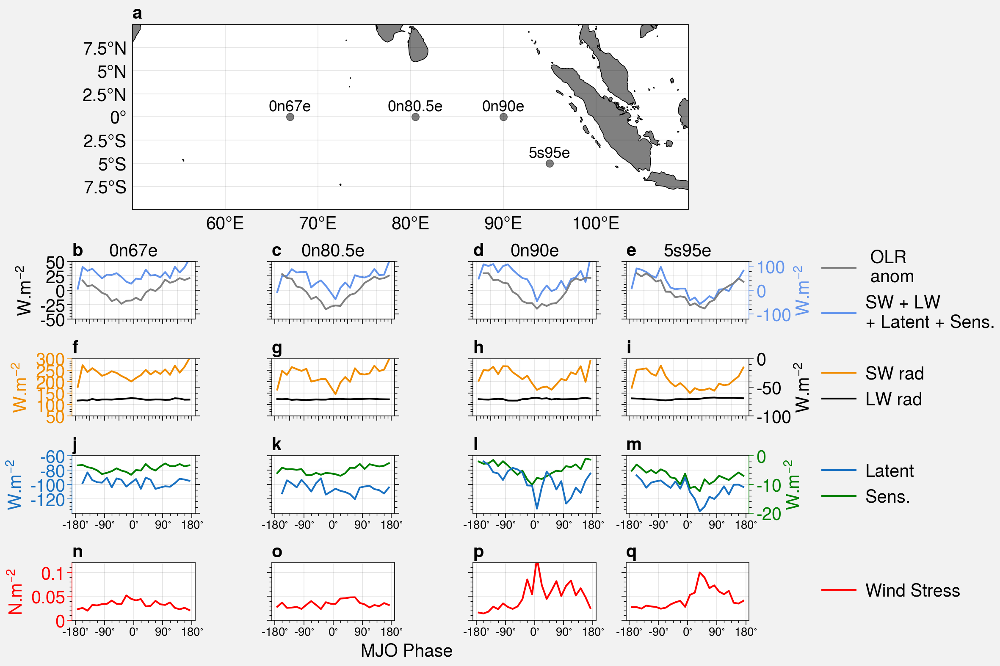

In [30]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 1,1],
    [1, 1, 1,1],
    [2, 3, 4,5],
    [6, 7, 8,9],        
    [10,11,12,13],
[14,15,16,17]]

proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
#moorings_to_plot = ['4s57e','4s67e','4s80.5e','5s95e']

lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='20cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=13)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (50,110),
                labels=True,land=True,coast=True)#,lonlines=False ) #lonlines=np.arange(60,110,30))



image_counter = 1
for i_mooring in moorings_to_plot:
    cline_left = axs[image_counter].plot(0.5*(OLR_binned_by_phase['phase_bin_edges'][0:-1]+OLR_binned_by_phase['phase_bin_edges'][1::])[1::],
                 OLR_binned_by_phase[i_mooring]['mean'][1::],'grey',label=' OLR\n anom')
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    axs[image_counter].set_ylim([-50,50])
    axs[image_counter].set_yticks([-50,-25,0,25,50])
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_ylabel('W.m$^{-2}$')

        axs[image_counter].set_yticklabels([-50,-25,0,25,50])
    else:
        axs[image_counter].set_yticklabels([])
    
    axs[image_counter].annotate(i_mooring,
            xy=(0.5, 1.03), xycoords='axes fraction',
            horizontalalignment='center',
            verticalalignment='bottom',fontsize=15,color='black')
    
    Net_flux_binned_by_phase  = (net_SW_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'] - net_LW_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'])  \
                              - (latent_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'] + sens_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'])
    ax_right = axs[image_counter].twinx()
    cline_right = ax_right.plot(0.5*(SST_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+SST_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                                               Net_flux_binned_by_phase,'cornflowerblue',label='SW + LW \n+ Latent + Sens.')
    
    ax_right.set_xticks(np.arange(-180,181,45))
    ax_right.set_xticklabels([])
    ax_right.set_ylim([-120,120])
    ax_right.set_yticks([-100,0,100])

    if i_mooring == moorings_to_plot[-1]:
        ax_right.set_ylabel('W.m$^{-2}$')
        ax_right.set_yticklabels([-100,0,100])

        ax_right.spines['right'].set_color('cornflowerblue')
        ax_right.yaxis.label.set_color('cornflowerblue')
        ax_right.tick_params(axis='y', colors='cornflowerblue')
    else:
        ax_right.set_yticklabels([])
    
    image_counter = image_counter+1

    
    
axs[image_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels

for i_mooring in moorings_to_plot:
    cline_left = axs[image_counter].plot(0.5*(net_SW_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+net_SW_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                                         net_SW_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'],'yellow8',label='SW rad')

    
    #axs[image_counter].plot(0.5*(T_air_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+T_air_RAMA_binned_by_phase['phase_bin_edges'][1::]),
    #                                     T_air_RAMA_binned_by_phase[i_mooring]['90_percentile'],'red4',label='Air Temp',linestyle='--')
    #axs[image_counter].plot(0.5*(T_air_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+T_air_RAMA_binned_by_phase['phase_bin_edges'][1::]),
    #                                     T_air_RAMA_binned_by_phase[i_mooring]['10_percentile'],'red4',label='Air Temp',linestyle='--')
    
    axs[image_counter].set_ylim([50,300])
    axs[image_counter].set_yticks([50,100,150,200,250,300])
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_yticklabels([50,100,150,200,250,300])
        axs[image_counter].set_ylabel('W.m$^{-2}$')

        axs[image_counter].spines['left'].set_color('yellow8')
        axs[image_counter].yaxis.label.set_color('yellow8')
        axs[image_counter].tick_params(axis='y', colors='yellow8')
    else:
        axs[image_counter].set_yticklabels([])

    ax_right = axs[image_counter].twinx()

    cline_right = ax_right.plot(0.5*(net_LW_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+net_LW_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                                         -net_LW_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'],'black',label='LW rad')
    
    ax_right.set_ylim([-100,0])
    ax_right.set_yticks([-100,-50,0])
    if i_mooring == moorings_to_plot[-1]:
        ax_right.set_yticklabels([-100,-50,0])
        ax_right.set_ylabel('W.m$^{-2}$')

        ax_right.spines['right'].set_color('black')
        ax_right.yaxis.label.set_color('black')
        ax_right.tick_params(axis='y', colors='black')
    else:
        ax_right.set_yticklabels([])
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])

    #cline_right = ax2.plot(0.5*(SST_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+SST_RAMA_binned_by_phase['phase_bin_edges'][1::]),
    #                        SST_RAMA_binned_by_phase[i_mooring]['mean'],'blue',label='SST')

    #cline_right = ax_right.plot(0.5*(wind_stress_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+wind_stress_RAMA_binned_by_phase['phase_bin_edges'][1::]),
    #                        wind_stress_RAMA_binned_by_phase[i_mooring]['mean'],'red',label='Wind Stress')
    
    
    image_counter = image_counter+1
axs[image_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels


for i_mooring in moorings_to_plot:
    #blue8
    cline_left = axs[image_counter].plot(0.5*(latent_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+latent_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][1::])[1::],
              -latent_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'][1::],'blue8',label='Latent')
    
    
    
    axs[image_counter].set_ylim([-140,-60])
    axs[image_counter].set_yticks([-120,-100,-80,-60])
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_ylabel('W.m$^{-2}$')
        axs[image_counter].spines['left'].set_color('blue8')
        axs[image_counter].yaxis.label.set_color('blue8')
        axs[image_counter].tick_params(axis='y', colors='blue8')
        axs[image_counter].set_yticklabels([-120,-100,-80,-60])
    else:
        axs[image_counter].set_yticklabels([])
    ax_right = axs[image_counter].twinx()

    cline_right = ax_right.plot(0.5*(sens_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+sens_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                            -sens_heat_flux_RAMA_binned_by_phase[i_mooring]['mean'],'green',label='Sens.')
    
    ax_right.set_ylim([-20,0])
    ax_right.set_yticks([-20,-10,0])
    if i_mooring == moorings_to_plot[-1]:
        ax_right.set_yticklabels([-20,-10,0])
        ax_right.set_ylabel('W.m$^{-2}$')

        ax_right.spines['right'].set_color('green')
        ax_right.yaxis.label.set_color('green')
        ax_right.tick_params(axis='y', colors='green')
    else:
        ax_right.set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,90))
    
    phases = []
    for i_phase in np.arange(-180,181,90):
        phases.append(str(i_phase) + '$^{\circ}$')
    axs[image_counter].set_xticklabels(phases,fontsize=10)
    
#    if i_mooring == moorings_to_plot[1]:
#        axs[image_counter].set_xlabel('                              MJO Phase')
    
    
    image_counter = image_counter+1
    
axs[image_counter-1].legend(cline_left+cline_right, loc='r', ncols=1, frame=False)  # manually override labels

for i_mooring in moorings_to_plot:
    #blue8
    cline_left = axs[image_counter].plot(0.5*(wind_stress_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+wind_stress_RAMA_binned_by_phase['phase_bin_edges'][1::]),
                            wind_stress_RAMA_binned_by_phase[i_mooring]['mean'],'red',label='Wind Stress')
    
    
    
    axs[image_counter].set_ylim([0,0.12])
    axs[image_counter].set_yticks([0,0.05,0.1])
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_ylabel('N.m$^{-2}$')
        axs[image_counter].spines['left'].set_color('red')
        axs[image_counter].yaxis.label.set_color('red')
        axs[image_counter].tick_params(axis='y', colors='red')
        axs[image_counter].set_yticklabels([0,0.05,0.1])
    else:
        axs[image_counter].set_yticklabels([])

    axs[image_counter].set_xticks(np.arange(-180,181,90))
    
    phases = []
    for i_phase in np.arange(-180,181,90):
        phases.append(str(i_phase) + '$^{\circ}$')
    axs[image_counter].set_xticklabels(phases,fontsize=10)
    
    if i_mooring == moorings_to_plot[1]:
        axs[image_counter].set_xlabel('                              MJO Phase')
    
    
    image_counter = image_counter+1


    #cline_right = ax_right.
axs[image_counter-1].legend(cline_left, loc='r', ncols=1, frame=False)  # manually override labels


figure_output_path = './Figures'
figure_file_name = 'Phase_bin_equatorial_moorings_OLR_SW_rad_Wind_stress_Latent_Sens'
#figure_file_name = 'Phase_bin_south_off_equatorial_moorings_OLR_SW_rad_Wind_stress_Latent_Sens'

fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')


In [31]:
data_vars_to_get = ['T_20_CT_anom']
T_profiles_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(T_profiles_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                             data_vars_to_get,days_before=days_before,days_after=days_after)
T_profiles_RAMA_binned_by_phase_difference  = bin_events_over_phase(T_profiles_RAMA_event_catalogue, data_vars_to_get[0],difference_from_start_days=True)


data_vars_to_get = ['S_41_SA_anom']
S_profiles_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(S_profiles_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                             data_vars_to_get,days_before=days_before,days_after=days_after)
S_profiles_RAMA_binned_by_phase_difference  = bin_events_over_phase(S_profiles_RAMA_event_catalogue, data_vars_to_get[0],difference_from_start_days=True)


/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anaconda_Install/miniconda/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/tube1/cha674/Anacon

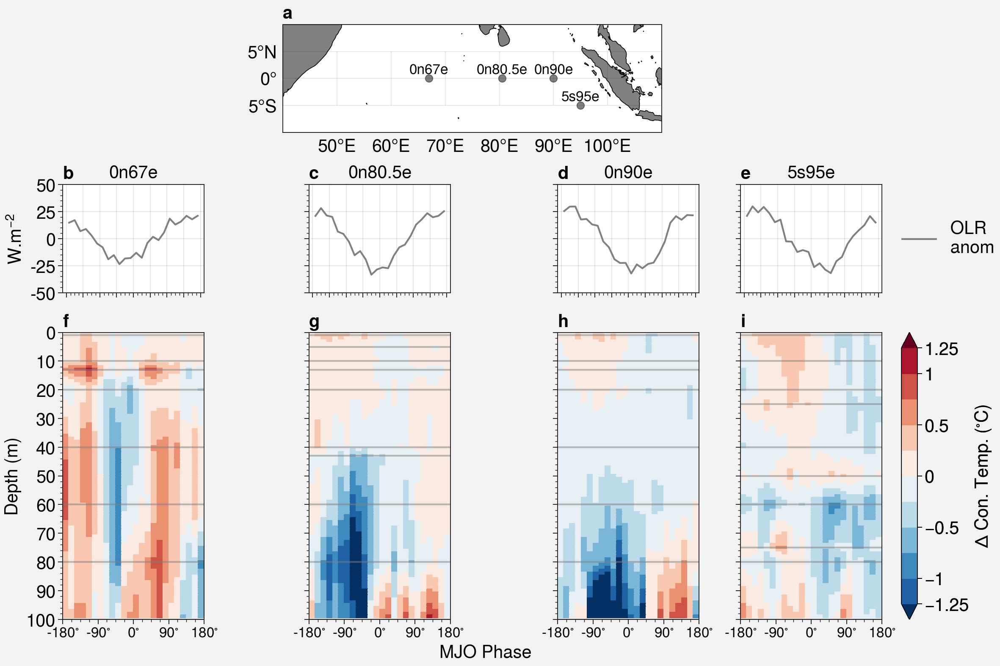

In [28]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 1,1],
    [2, 3, 4,5],
    [6, 7, 8,9],        
    [6, 7, 8,9]]

proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
#moorings_to_plot = ['4s57e','4s67e','4s80.5e','5s95e']

lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='20cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (40,110),
                labels=True,land=True,coast=True,latlines=np.arange(-5,5.1,5))#,lonlines=False ) #lonlines=np.arange(60,110,30))



image_counter = 1
for i_mooring in moorings_to_plot:
    cline_left = axs[image_counter].plot(0.5*(OLR_binned_by_phase['phase_bin_edges'][0:-1]+OLR_binned_by_phase['phase_bin_edges'][1::]),
                 OLR_binned_by_phase[i_mooring]['mean'],'grey',label=' OLR\n anom')
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    axs[image_counter].set_ylim([-50,50])
    axs[image_counter].set_yticks([-50,-25,0,25,50])
    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_ylabel('W.m$^{-2}$')

        axs[image_counter].set_yticklabels([-50,-25,0,25,50])
    else:
        axs[image_counter].set_yticklabels([])
    
    axs[image_counter].annotate(i_mooring,
            xy=(0.5, 1.03), xycoords='axes fraction',
            horizontalalignment='center',
            verticalalignment='bottom',fontsize=15,color='black')
    
    image_counter = image_counter+1
axs[image_counter-1].legend(cline_left, loc='r', ncols=1, frame=False)  # manually override labels

    
for i_mooring in moorings_to_plot:
    
    depth_levels = T_profiles_RAMA[i_mooring]['T_20']['depth'].sel(depth=slice(0,100)).values
    interpolate_function_CT = scipy_interp.interp1d(depth_levels,T_profiles_RAMA_binned_by_phase_difference[i_mooring]['mean'][:,0:depth_levels.size],
                                                    bounds_error=False,fill_value='extrapolate',axis=1)
    
    depth_levels_to_plot = np.arange(1,100,1)
    mooring_CT_interp = interpolate_function_CT(depth_levels_to_plot)
    
    
    #cs = axs[image_counter].contourf(0.5*(T_profiles_RAMA_binned_by_phase_difference['phase_bin_edges'][0:-1]+T_profiles_RAMA_binned_by_phase_difference['phase_bin_edges'][1::]),
    #                            -depth_levels_to_plot,mooring_CT_interp.T,levels=np.arange(-1.25,1.251,0.1),cmap='RdBu_r',extend='both')
    cs = axs[image_counter].pcolormesh(0.5*(T_profiles_RAMA_binned_by_phase_difference['phase_bin_edges'][0:-1]+T_profiles_RAMA_binned_by_phase_difference['phase_bin_edges'][1::]),
                                -depth_levels_to_plot,mooring_CT_interp.T,vmin=-1.25,vmax=1.25,cmap='RdBu_r',extend='both')
    
    
    for i_level in depth_levels:
        axs[image_counter].axhline(y=-i_level,color='grey',alpha=0.5)
    
#    cs = axs[image_counter].pcolormesh(0.5*(T_profiles_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+T_profiles_RAMA_binned_by_phase['phase_bin_edges'][1::]),
#                                -depth_levels,T_profiles_RAMA_binned_by_phase[i_mooring]['mean'][:,0:depth_levels.size].T,vmin=28.5,vmax=29.7,cmap='Thermal',extend='both')

    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])

    if i_mooring == moorings_to_plot[0]:
        axs[image_counter].set_yticks(np.arange(-100,1,10))
        axs[image_counter].set_yticklabels(np.arange(100,-1,-10))
        axs[image_counter].set_ylabel('Depth (m)')
    else:
        axs[image_counter].set_yticks(np.arange(-100,1,10))
        axs[image_counter].set_yticklabels([])        
    
    axs[image_counter].set_ylim([-100,0])
    axs[image_counter].set_xticks(np.arange(-180,181,90))
    phases = []
    for i_phase in np.arange(-180,181,90):
        phases.append(str(i_phase) + '$^{\circ}$')
    axs[image_counter].set_xticklabels(phases,fontsize=12)
    if i_mooring == moorings_to_plot[1]:
        axs[image_counter].set_xlabel('                                           MJO Phase')

    image_counter = image_counter+1
axs[image_counter-1].colorbar(cs,loc='r',ticks=[-1.25,-1,-0.5,0,0.5,1,1.25],label=r'$\Delta$ Con. Temp. ($^{\circ}$C)')


figure_output_path = './Figures'
figure_file_name = 'Phase_bin_equatorial_moorings_delta_temperature_with_depth'
#figure_file_name = 'Phase_bin_south_off_equatorial_moorings_delta_temperature_with_depth'

fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



In [56]:
data_vars_to_get = ['T_20_CT']
T_profiles_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(T_profiles_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                             data_vars_to_get,days_before=days_before,days_after=days_after)
T_profiles_RAMA_binned_by_phase_abs  = bin_events_over_phase(T_profiles_RAMA_event_catalogue, data_vars_to_get[0],difference_from_start_days=False)
data_vars_to_get = ['S_41_SA']
S_profiles_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(S_profiles_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                             data_vars_to_get,days_before=days_before,days_after=days_after)
S_profiles_RAMA_binned_by_phase_abs  = bin_events_over_phase(S_profiles_RAMA_event_catalogue, data_vars_to_get[0],difference_from_start_days=False)


In [57]:
def filter_by_month(RAMA_object,variable_name,months_to_get):

        
    unique_RAMA_stations = RAMA_object.keys()
    RAMA_object_filtered_variable  = {k: [] for k in unique_stations}

    
    
    for i_station in unique_RAMA_stations:
        

        month_indices     = RAMA_object[i_station][variable_name]['time.month'].isin([11,12,1,2,3])
        filtered_variable = RAMA_object[i_station][variable_name][month_indices]

        RAMA_object_filtered_variable[i_station] = {variable_name + '_month_filtered':filtered_variable}

        
        #RAMA_object_filtered_variable[i_station][variable_to_get + '_month_filtered'] = filtered_variable
        
    return RAMA_object_filtered_variable

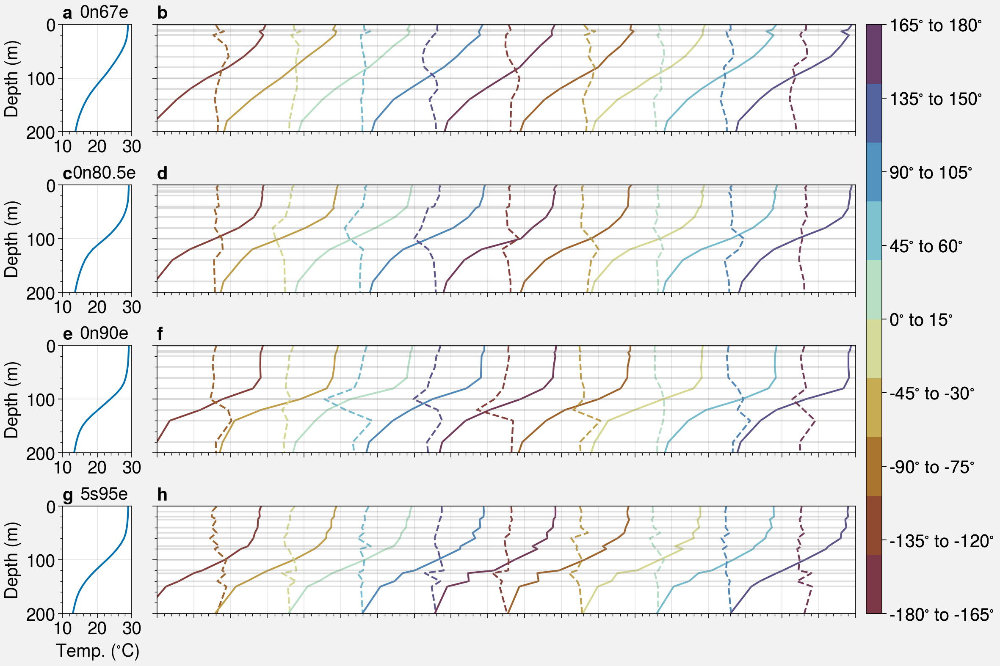

In [41]:
image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 2, 2,2,2,2],
    [3, 4, 4,4,4,4],
    [5, 6, 6,6,6,6],
    [7, 8, 8,8,8,8]]
fig, axs = proplot.subplots(image_drawing,proj=None,width='30cm',height='20cm',share=False)
cycle1 = proplot.Cycle('romaO', 9, left=0.1)
cycle2 = proplot.Cycle('romaO', 9, left=0.1)

axs.format(facecolor='white',abc=True) #, color='grey')

moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
#moorings_to_plot = ['4s57e','4s67e','4s80.5e','5s95e']
offset = 23

image_counter = 0

for i_mooring in moorings_to_plot:
    temp_shift = 20


    mooring_latitude = T_profiles_RAMA[i_mooring]['latitude']
    mooring_longitude = T_profiles_RAMA[i_mooring]['longitude']
    depth_levels         = T_profiles_RAMA[i_mooring]['T_20']['depth'].values #.sel(depth=slice(0,100)).values


    T_profiles_clim       = T_profiles_RAMA[i_mooring]['conservative_temperature_climatology']
    month_of_timestamp    = pandas.to_datetime(T_profiles_clim['dayofyear'].values, format='%j').month
    T_profiles_clim_NDJFM = T_profiles_clim[np.isin(month_of_timestamp,[11,12,1,2,3]),:].mean(dim='dayofyear').squeeze()

    climatology_pressure = T_profiles_clim_NDJFM['PRESSURE']
    climatology_depth    = TEOS_10.z_from_p(climatology_pressure,mooring_latitude)


    axs[image_counter].plot(T_profiles_clim_NDJFM.values,
                climatology_depth)
    axs[image_counter].invert_xaxis()
    axs[image_counter].set_ylim(-200,0)
    axs[image_counter].set_yticks(np.arange(-200,1,100))
    axs[image_counter].set_yticklabels([200,100,0])
    axs[image_counter].set_ylabel('Depth (m)')
    if i_mooring==moorings_to_plot[-1]:
        axs[image_counter].set_xlabel(r'Temp. ($^{\circ}$C)')

    axs[image_counter].set_xlim(10,30)

    axs[image_counter].annotate(i_mooring,
            xy=(0.60, 1.03), xycoords='axes fraction',
            horizontalalignment='center',
            verticalalignment='bottom',fontsize=15,color='black')
    
    image_counter = image_counter+1
    interpolate_function_CT = scipy_interp.interp1d(climatology_depth, T_profiles_clim_NDJFM.values,bounds_error=False,fill_value='extrapolate')
    T_profiles_clim_NDJFM_at_mooring_depths = interpolate_function_CT(-depth_levels)
    phase_counter = 0
    n_phases = len(range(0,T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'].size-1,3))
    
    for i_phase in range(0,T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'].size-1,3):
        #print(i_phase)
        current_phase = 0.5*(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][i_phase] + T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][i_phase+1])
        #print(current_phase)
        #print('====')
        line = axs[image_counter].plot((T_profiles_RAMA_binned_by_phase_abs[i_mooring]['mean'][i_phase,:])+temp_shift,
                -depth_levels,cycle=cycle1,label=current_phase)
        
    
        axs[image_counter].plot(2*T_profiles_RAMA_binned_by_phase_difference[i_mooring]['mean'][i_phase,:]+offset+temp_shift,
                -depth_levels,cycle=cycle2,linestyle='--')
            
        #axs[image_counter].annotate(str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][i_phase]) + r'$^{\circ}$ to ' + 
        #                            str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][i_phase+1])+ r'$^{\circ}$',
        #    xy=((phase_counter/n_phases)+0.1,1.03), xycoords='axes fraction',
        #    horizontalalignment='center',
        #    verticalalignment='bottom',fontsize=11,color='black')
    
        phase_counter = phase_counter+1

        axs[image_counter].invert_xaxis()

        temp_shift = temp_shift +10
    current_phase = 0.5*(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][-2] + T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][-1])
    #print(current_phase)
    #print('-----')
    line = axs[image_counter].plot((T_profiles_RAMA_binned_by_phase_abs[i_mooring]['mean'][-1,:])+temp_shift,
                -depth_levels,cycle=cycle1,label=current_phase)
        
    
    axs[image_counter].plot(2*T_profiles_RAMA_binned_by_phase_difference[i_mooring]['mean'][-1,:]+offset+temp_shift,
                -depth_levels,cycle=cycle2,linestyle='--')
            
    #axs[image_counter].annotate(str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][-2]) + r'$^{\circ}$' + 
    #                            str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][-1])+ r'$^{\circ}$',
    #        xy=((phase_counter/n_phases)+0.1,1.03), xycoords='axes fraction',
    #        horizontalalignment='center',
    #        verticalalignment='bottom',fontsize=11,color='black')
    axs[image_counter].set_ylim(-200,0)
    axs[image_counter].set_yticks(np.arange(-200,1,100))
    axs[image_counter].set_yticklabels([])

    #axs[image_counter].invert_xaxis()

    axs[image_counter].set_xlim(35,130)
    axs[image_counter].set_xticks(np.arange(35,131,5) ) 
    axs[image_counter].set_xticklabels([]) 



    temp_shift = temp_shift +10
    
    for i_level in depth_levels:
        axs[image_counter].axhline(y=-i_level,color='grey',alpha=0.25)
    image_counter = image_counter+1
c = np.arange(0, n_phases+1 )
dummie_cax = axs[image_counter-1].scatter(c, c, c=c, cmap='romaO')


cbar=fig.colorbar(dummie_cax, ticks=c)
cbar_tick_labels = []
for i_phase in range(0,T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'].size-1,3):
    #print(i_phase)
    current_label = str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][i_phase]) + r'$^{\circ}$ to ' + \
                    str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][i_phase+1])+ r'$^{\circ}$'
    cbar_tick_labels.append(current_label)
cbar_tick_labels.append(str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][-2]) + r'$^{\circ}$ to ' + 
                                str(T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'][-1])+ r'$^{\circ}$')


cbar.ax.set_yticklabels(cbar_tick_labels)  # horizontal colorbar

figure_output_path = './Figures'
figure_file_name = 'Phase_bin_equatorial_moorings_temperature_profiles_with_depth'
#figure_file_name = 'Phase_bin_south_off_equatorial_moorings_temperature_profiles_with_depth'

fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



In [54]:
n_phases

9

In [185]:
len(range(0,T_profiles_RAMA_binned_by_phase_abs['phase_bin_edges'].size-1,3))

8

In [187]:
phase_counter

8

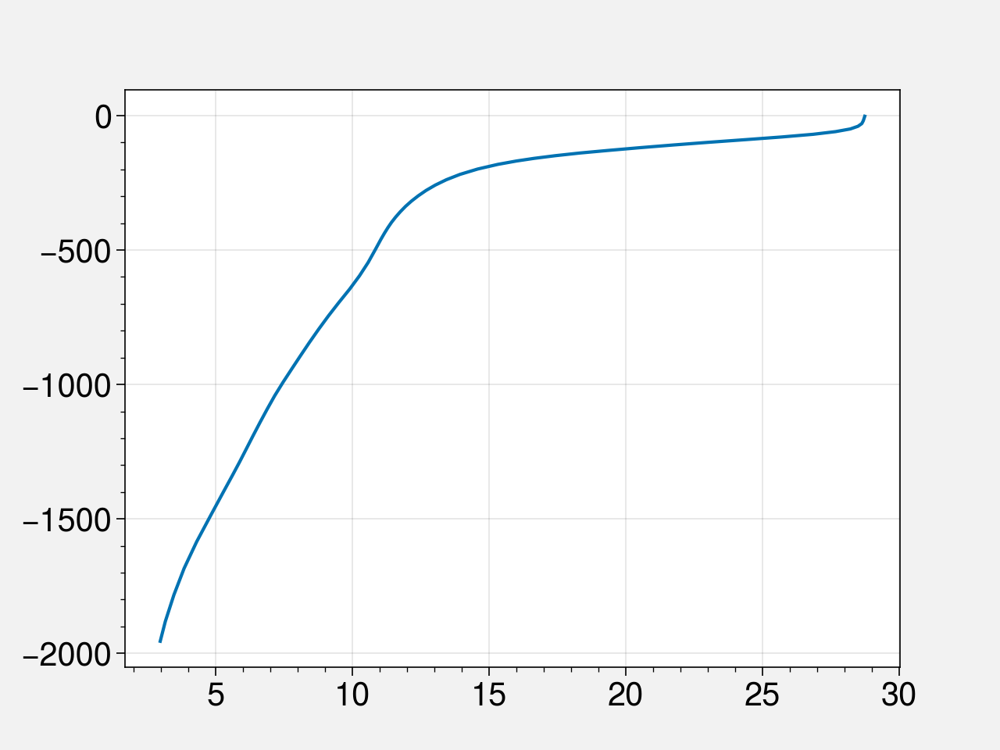

In [108]:
plt.plot(T_profiles_clim_NDJFM,climatology_depth)

In [32]:
SST_RAMA_binned_by_phase_and_hour   = bin_events_over_phase_and_hour(SST_RAMA_event_catalogue,  'T_25')
T_air_RAMA_binned_by_phase_and_hour = bin_events_over_phase_and_hour(T_air_RAMA_event_catalogue, 'AT_21')
Rain_RAMA_binned_by_phase_and_hour  = bin_events_over_phase_and_hour(Rain_RAMA_event_catalogue,  'RN_485')

In [35]:
def filter_by_month(RAMA_object,variable_name,months_to_get):

        
    unique_RAMA_stations = RAMA_object.keys()
    RAMA_object_filtered_variable  = {k: [] for k in unique_stations}

    
    
    for i_station in unique_RAMA_stations:
        

        month_indices     = RAMA_object[i_station][variable_name]['time.month'].isin([11,12,1,2,3])
        filtered_variable = RAMA_object[i_station][variable_name][month_indices]

        RAMA_object_filtered_variable[i_station] = {variable_name + '_month_filtered':filtered_variable}

        
        #RAMA_object_filtered_variable[i_station][variable_to_get + '_month_filtered'] = filtered_variable
        
    return RAMA_object_filtered_variable

In [36]:
def filter_MJO(RAMA_object,RAMA_event_catalogue,variable_name):
    
    unique_RAMA_stations = RAMA_object.keys()
    RAMA_object_filtered_variable  = {k: [] for k in unique_stations}

    
    for i_station in unique_RAMA_stations:
        #print(i_station)
        current_RAMA_variable = RAMA_object[i_station][variable_name]

        #print(i_station)
        index_no_MJO = np.in1d(current_RAMA_variable['time'],np.concatenate(RAMA_event_catalogue[i_mooring]['time']),invert=True)
        
        RAMA_object_filtered_variable[i_station] = {variable_name + '_MJO_filtered':current_RAMA_variable[index_no_MJO]}
        #print(RAMA_object_filtered_variable[i_station][variable_name + '_MJO_filtered'].size)
        #print(current_RAMA_variable.size)
        
        #print(RAMA_object)
    return RAMA_object_filtered_variable

In [37]:
SST_RAMA_NDJFM[i_mooring]

NameError: name 'SST_RAMA_NDJFM' is not defined

In [38]:
MDJFM_months =[11,12,1,2,3]

SST_RAMA_NDJFM = filter_by_month(SST_RAMA,'T_25',MDJFM_months)
SST_RAMA_NDJFM_no_MJO = filter_MJO(SST_RAMA_NDJFM,SST_RAMA_event_catalogue,'T_25_month_filtered')

T_air_RAMA_NDJFM = filter_by_month(T_air_RAMA, 'AT_21',MDJFM_months)
T_air_RAMA_NDJFM_no_MJO = filter_MJO(T_air_RAMA_NDJFM,T_air_RAMA_event_catalogue,'AT_21_month_filtered')

Rain_RAMA_NDJFM  = filter_by_month(Rain_RAMA, 'RN_485',MDJFM_months)
Rain_RAMA_NDJFM_no_MJO = filter_MJO(Rain_RAMA_NDJFM,Rain_RAMA_event_catalogue,'RN_485_month_filtered')


In [37]:
Rain_RAMA_NDJFM_no_MJO[i_mooring]

{'RN_485_month_filtered_MJO_filtered': <xarray.DataArray 'RN_485' (time: 6882)>
 array([-0.04    , -0.031667, -0.016667, ..., -0.023333, -0.013333,  0.026667],
       dtype=float32)
 Coordinates:
   * time     (time) datetime64[ns] 2014-11-01 ... 2019-03-31T23:00:00
     depth    float32 -3.5
     lat      float32 0.0
     lon      float32 67.0}

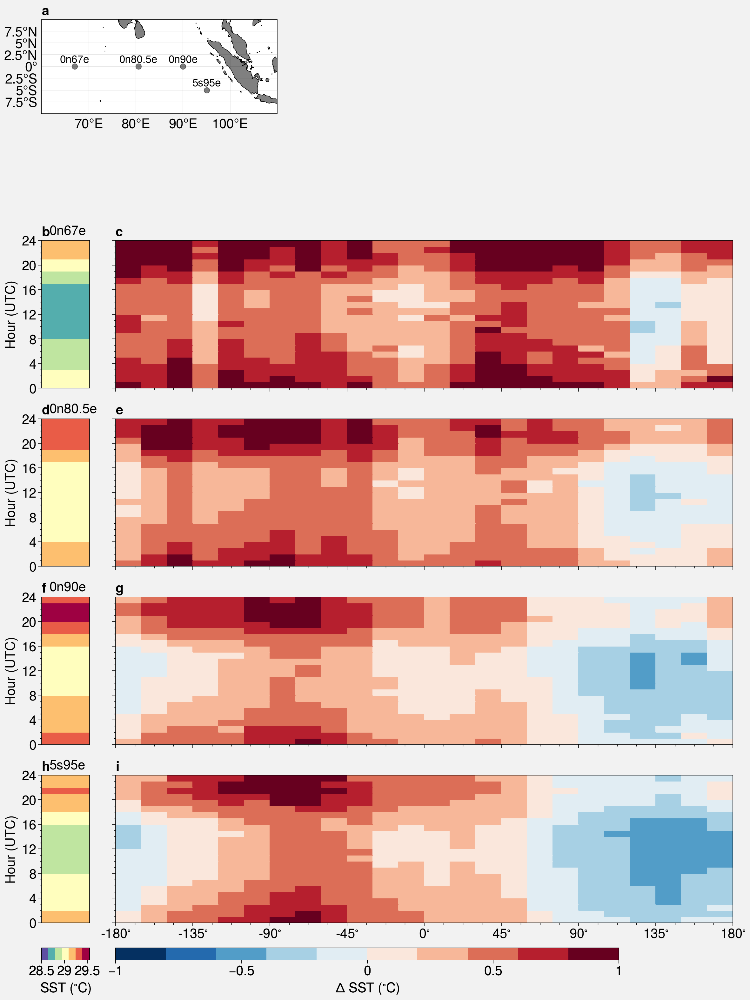

In [39]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 1,0,0,0,0],
    [1, 1, 1,0,0,0,0],
    [2, 3,3, 3,3,3,3],
    [4, 5,5, 5,5,5,5],
    [6, 7,7, 7,7,7,7],
    [8, 9,9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True)#,lonlines=False ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    SST_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(SST_RAMA_NDJFM_no_MJO[i_mooring]['T_25_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           SST_RAMA_NDJFM_no_MJO[i_mooring]['T_25_month_filtered_MJO_filtered'].values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))

    SST_binned_hour_to_plot = np.concatenate([np.expand_dims(SST_binned_hour_no_MJO,axis=0),np.expand_dims(SST_binned_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),0.5*(SST_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+SST_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               SST_binned_hour_to_plot.T,cmap='Spectral_r',vmin=28.5,vmax=29.6)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    axs[image_counter].annotate(i_mooring, xy=(0.16,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    
    image_counter = image_counter+1
    
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(SST_RAMA_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+SST_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(SST_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+SST_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               SST_RAMA_binned_by_phase_and_hour[i_mooring]['mean'].T - SST_binned_hour_no_MJO,cmap='RdBu_r',vmin=-1.0,vmax=1.)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
    
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='SST ($^{\circ}C$)',col=1,ticks=[28.5,29.0,29.5])
fig.colorbar(cs_temp_anom,loc='b',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)',cols=[2,6])


figure_output_path = './Figures'
figure_file_name = 'Diurnal_Cycle_SST_Equatorial_Moorings_with_phase'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



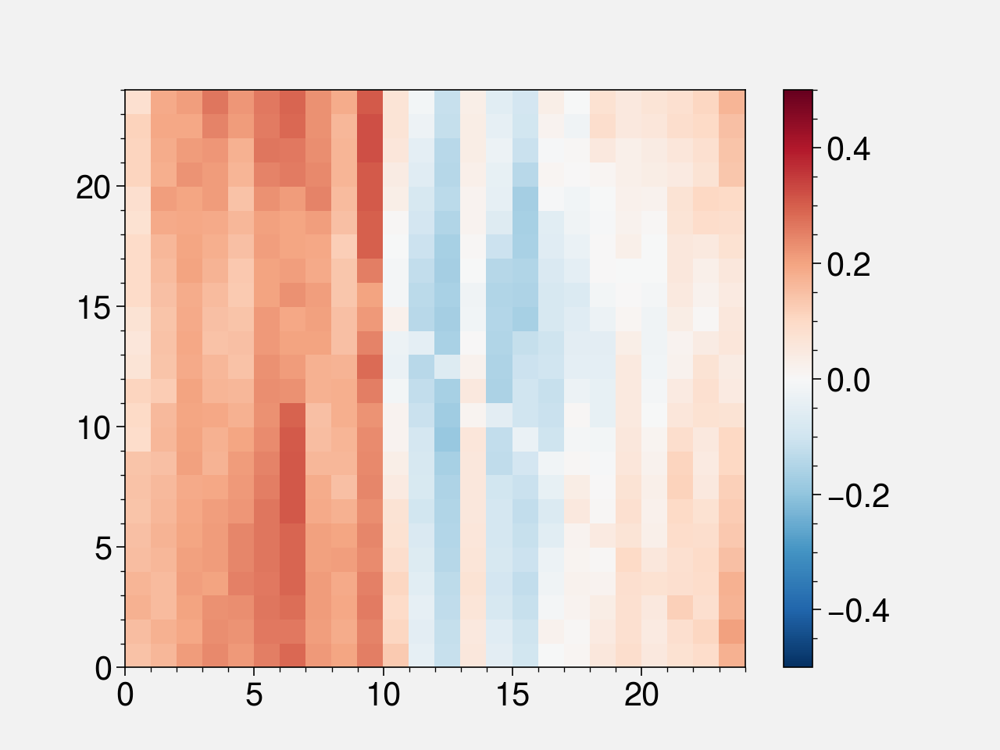

In [105]:
plt.pcolormesh(T_profiles_RAMA_binned_by_phase_and_hour['0n80.5e']['mean'][:,:,2].T,vmin=-0.5,vmax=0.5,cmap='RdBu_r')
plt.colorbar()

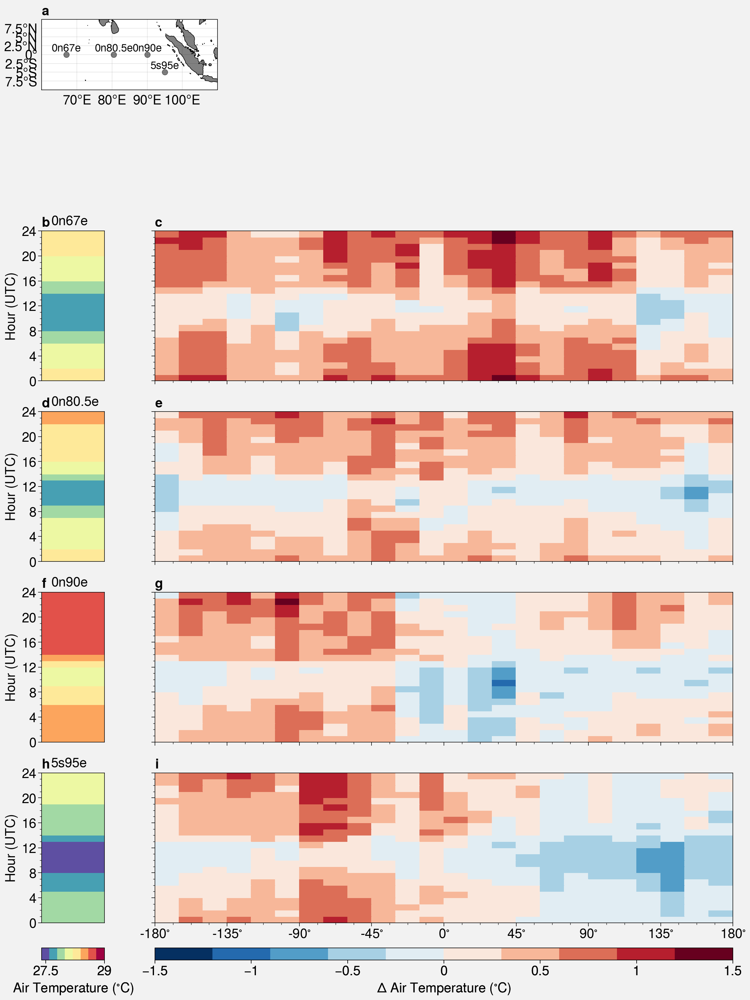

In [34]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 0,0,0,0],
    [1, 1, 0,0,0,0],
    [2, 3, 3,3,3,3],
    [4, 5, 5,5,5,5],
    [6, 7, 7,7,7,7],
    [8, 9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True)#,lonlines=False ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    Air_T_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(T_air_RAMA_NDJFM_no_MJO[i_mooring]['AT_21_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           T_air_RAMA_NDJFM_no_MJO[i_mooring]['AT_21_month_filtered_MJO_filtered'].values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))

    Air_T_binned_hour_to_plot = np.concatenate([np.expand_dims(Air_T_binned_hour_no_MJO,axis=0),np.expand_dims(Air_T_binned_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),0.5*(T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               Air_T_binned_hour_to_plot.T,cmap='Spectral_r',vmin=27.4,vmax=29.1)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    axs[image_counter].annotate(i_mooring, xy=(0.15,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    
    image_counter = image_counter+1
    
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(T_air_RAMA_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+T_air_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               T_air_RAMA_binned_by_phase_and_hour[i_mooring]['mean'].T - Air_T_binned_hour_no_MJO,cmap='RdBu_r',vmin=-1.51,vmax=1.51)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
    
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='Air Temperature ($^{\circ}C$)',col=1,ticks=[27.5,29])
fig.colorbar(cs_temp_anom,loc='b',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ Air Temperature ($^{\circ}$C)',cols=[2,6])


figure_output_path = './Figures'
figure_file_name = 'Diurnal_Cycle_Air_Temperature_Equatorial_Moorings_with_phase'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



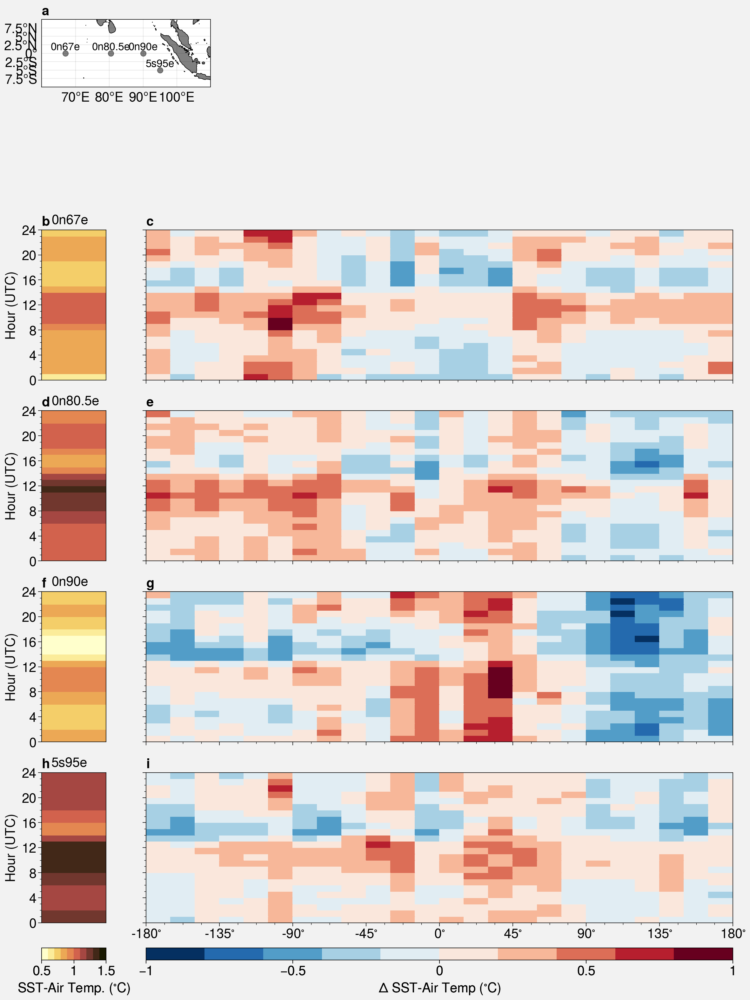

In [49]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 0,0,0,0],
    [1, 1, 0,0,0,0],
    [2, 3, 3,3,3,3],
    [4, 5, 5,5,5,5],
    [6, 7, 7,7,7,7],
    [8, 9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True)#,lonlines=False ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    Air_T_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(T_air_RAMA_NDJFM_no_MJO[i_mooring]['AT_21_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           T_air_RAMA_NDJFM_no_MJO[i_mooring]['AT_21_month_filtered_MJO_filtered'].values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))
    SST_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(SST_RAMA_NDJFM_no_MJO[i_mooring]['T_25_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           SST_RAMA_NDJFM_no_MJO[i_mooring]['T_25_month_filtered_MJO_filtered'].values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))

    delta_Air_T_SST_binned_by_hour_no_MJO =  SST_binned_hour_no_MJO - Air_T_binned_hour_no_MJO
    delta_Air_T_SST_binned_hour_to_plot = np.concatenate([np.expand_dims(delta_Air_T_SST_binned_by_hour_no_MJO,axis=0),np.expand_dims(delta_Air_T_SST_binned_by_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),0.5*(T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               delta_Air_T_SST_binned_hour_to_plot.T,cmap='lajolla',vmin=0.5,vmax=1.5)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    axs[image_counter].annotate(i_mooring, xy=(0.15,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    
    image_counter = image_counter+1
    delta_Air_T_SST_binned_by_phase_and_hour = SST_RAMA_binned_by_phase_and_hour[i_mooring]['mean'] - T_air_RAMA_binned_by_phase_and_hour[i_mooring]['mean']
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(T_air_RAMA_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+T_air_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               delta_Air_T_SST_binned_by_phase_and_hour.T - delta_Air_T_SST_binned_by_hour_no_MJO,cmap='RdBu_r',vmin=-1,vmax=1)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
    
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='SST-Air Temp. ($^{\circ}C$)',col=1,ticks=[0.5,1,1.5])
fig.colorbar(cs_temp_anom,loc='b',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST-Air Temp ($^{\circ}$C)',cols=[2,6])


figure_output_path = './Figures'
figure_file_name = 'Diurnal_Cycle_Difference_SST_Air_Temperature_Equatorial_Moorings_with_phase'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



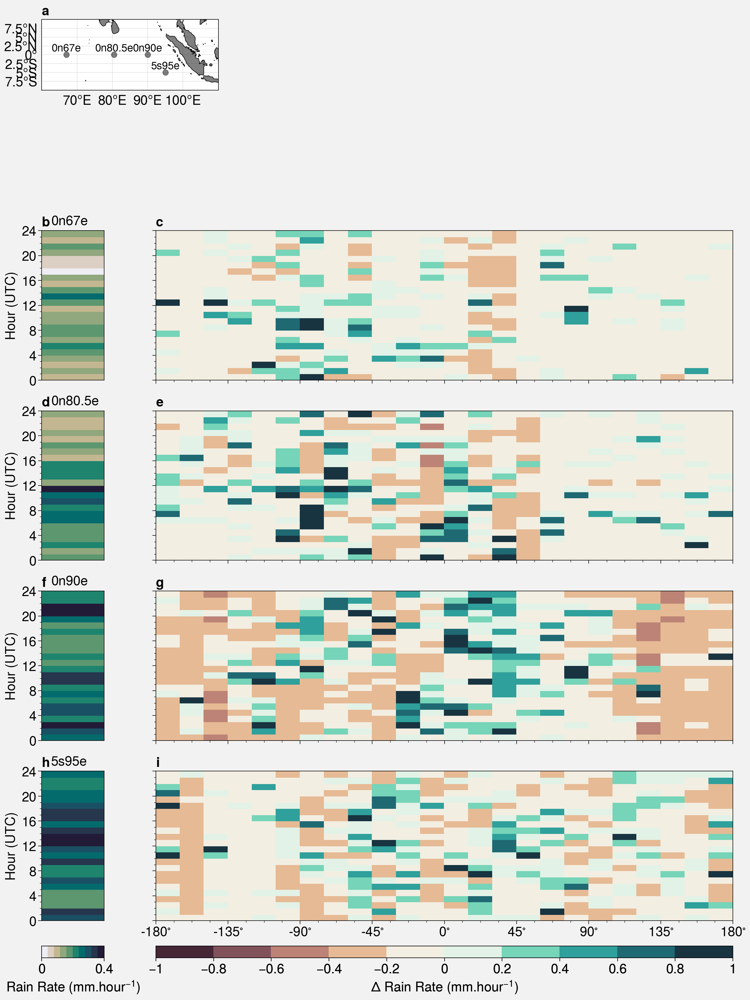

In [41]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 0,0,0,0],
    [1, 1, 0,0,0,0],
    [2, 3, 3,3,3,3],
    [4, 5, 5,5,5,5],
    [6, 7, 7,7,7,7],
    [8, 9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True)#,lonlines=False ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    Rain_RAMA_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(Rain_RAMA_NDJFM_no_MJO[i_mooring]['RN_485_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           Rain_RAMA_NDJFM_no_MJO[i_mooring]['RN_485_month_filtered_MJO_filtered'].values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))

    Rain_binned_hour_to_plot = np.concatenate([np.expand_dims(Rain_RAMA_binned_hour_no_MJO,axis=0),np.expand_dims(Rain_RAMA_binned_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),0.5*(Rain_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+
                                               Rain_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               Rain_binned_hour_to_plot.T,cmap=cmocean.cm.rain,vmin=0,vmax=0.4)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    
    axs[image_counter].annotate(i_mooring, xy=(0.15,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    image_counter = image_counter+1
    
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(Rain_RAMA_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+Rain_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(Rain_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+Rain_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               Rain_RAMA_binned_by_phase_and_hour[i_mooring]['mean'].T - Rain_RAMA_binned_hour_no_MJO,cmap='DryWet',vmin=-1.01,vmax=1.01)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='Rain Rate (mm.hour$^{-1}$)',col=1,ticks=[0,0.4])
fig.colorbar(cs_temp_anom,loc='b',label='$\Delta$ Rain Rate (mm.hour$^{-1}$)',cols=[2,6]) #ticks=[-1.25,-1,-0.5,0,0.5,1.0,1.25]


figure_output_path = './Figures'
figure_file_name = 'Diurnal_Cycle_Rain_Equatorial_Moorings_with_phase'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



In [42]:
unique_stations = mooring_fluxes.keys()
delta_q_RAMA  = {k: [] for k in unique_stations}
delta_SST_RAMA  = {k: [] for k in unique_stations}


for i_station in unique_stations:
    
    
    delta_q   = mooring_fluxes[i_station]['specific_humidity_air']-1000.0*mooring_fluxes[i_station]['specific_humidity_water']
    delta_SST = T_air_RAMA[i_station]['AT_21']-SST_RAMA[i_station]['T_25']

    delta_q_RAMA[i_station]   = {'delta_q':delta_q,'latitude':mooring_fluxes[i_station]['latitude'],'longitude':mooring_fluxes[i_station]['longitude']}
    delta_SST_RAMA[i_station] = {'delta_SST':delta_SST,'latitude':mooring_fluxes[i_station]['latitude'],'longitude':mooring_fluxes[i_station]['longitude']}
    
    
delta_q_RAMA_event_catalogue   = RAMA_reader.RAMA_event_catalogue(delta_q_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,['delta_q'],
                                                                  days_before=days_before,days_after=days_after)
delta_SST_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(delta_SST_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,['delta_SST'],
                                                                  days_before=days_before,days_after=days_after)

In [43]:
delta_SST_RAMA_binned_by_phase_and_hour     = bin_events_over_phase_and_hour(delta_SST_RAMA_event_catalogue, 'delta_SST')


In [44]:
u_wind_RAMA_binned_by_phase_and_hour        = bin_events_over_phase_and_hour(wind_RAMA_event_catalogue, 'WU_422')

latent_heat_flux_binned_by_phase_and_hour   = bin_events_over_phase_and_hour(latent_heat_flux_RAMA_event_catalogue,  'latent_heat_flux')
wind_stress_binned_by_phase_and_hour        = bin_events_over_phase_and_hour(wind_stress_RAMA_event_catalogue, 'wind_stress')
SW_rad_flux_RAMA_binned_by_phase_and_hour   = bin_events_over_phase_and_hour(SW_rad_RAMA_event_catalogue, 'RD_495')

delta_q_RAMA_binned_by_phase_and_hour       = bin_events_over_phase_and_hour(delta_q_RAMA_event_catalogue, 'delta_q')
delta_SST_RAMA_binned_by_phase_and_hour     = bin_events_over_phase_and_hour(delta_SST_RAMA_event_catalogue, 'delta_SST')

#SW_rad_flux_binned_by_phase           = bin_events_over_phase(SW_rad_RAMA_event_catalogue, 'RD_495')


In [45]:
mooring_fluxes['0n90e'].keys()

dict_keys(['latitude', 'longitude', 'time', 'file_path', 'data_variables', 'wind_stress', 'sensible_heat_flux', 'latent_heat_flux', 'buoyancy_flux', 'specific_humidity_air', 'specific_humidity_water', 'net_LW', 'net_SW'])

In [46]:
NDJFM_months =[11,12,1,2,3]

u_wind_RAMA_NDJFM = filter_by_month(wind_RAMA,'WU_422',NDJFM_months)
u_wind_RAMA_NDJFM_no_MJO = filter_MJO(u_wind_RAMA_NDJFM,wind_RAMA_event_catalogue,'WU_422_month_filtered')

latent_heat_flux_RAMA_NDJFM = filter_by_month(mooring_fluxes, 'latent_heat_flux',NDJFM_months)
latent_heat_flux_RAMA_NDJFM_no_MJO = filter_MJO(latent_heat_flux_RAMA_NDJFM,latent_heat_flux_RAMA_event_catalogue,'latent_heat_flux_month_filtered')

SW_rad_flux_RAMA_NDJFM        = filter_by_month(mooring_fluxes, 'net_SW',NDJFM_months)
SW_rad_flux_RAMA_NDJFM_no_MJO = filter_MJO(SW_rad_flux_RAMA_NDJFM,latent_heat_flux_RAMA_event_catalogue,'net_SW_month_filtered')


delta_q_RAMA_NDJFM        = filter_by_month(delta_q_RAMA, 'delta_q',NDJFM_months)
delta_q_RAMA_NDJFM_no_MJO = filter_MJO(delta_q_RAMA_NDJFM,delta_q_RAMA_event_catalogue,'delta_q_month_filtered')
delta_SST_RAMA_NDJFM        = filter_by_month(delta_SST_RAMA, 'delta_SST',NDJFM_months)
delta_SST_RAMA_NDJFM_no_MJO = filter_MJO(delta_SST_RAMA_NDJFM,delta_SST_RAMA_event_catalogue,'delta_SST_month_filtered')


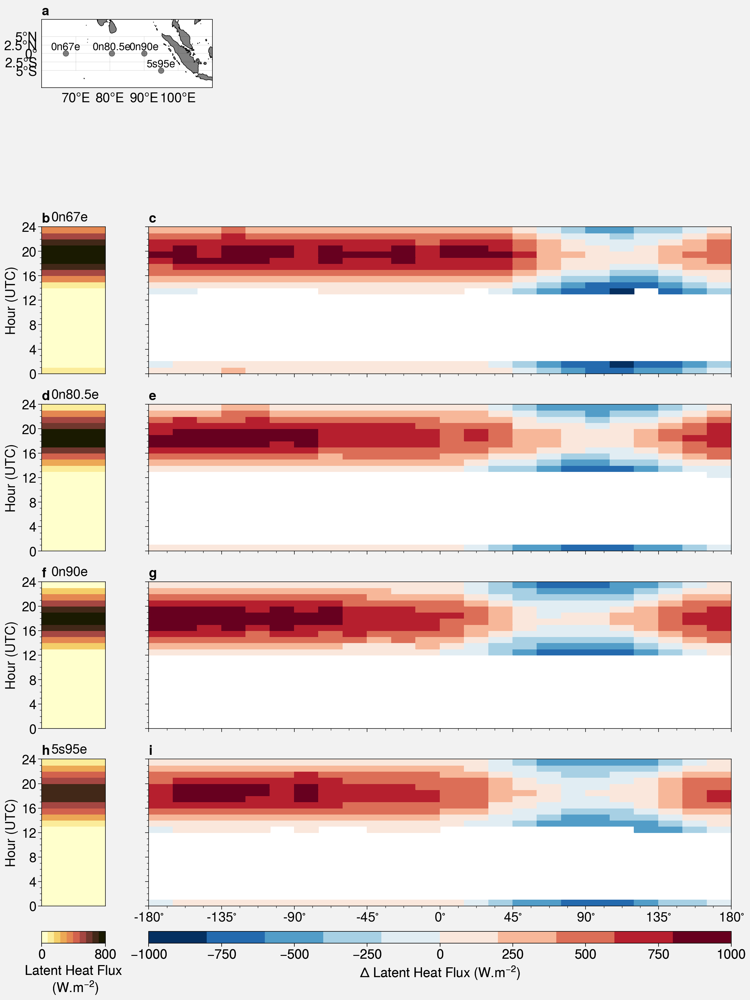

In [47]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 0,0,0,0],
    [1, 1, 0,0,0,0],
    [2, 3, 3,3,3,3],
    [4, 5, 5,5,5,5],
    [6, 7, 7,7,7,7],
    [8, 9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True,latlines=np.arange(-5,5.1,2.5) ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    net_SW_flux_RAMA_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(SW_rad_flux_RAMA_NDJFM_no_MJO[i_mooring]['net_SW_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           SW_rad_flux_RAMA_NDJFM_no_MJO[i_mooring]['net_SW_month_filtered_MJO_filtered'].squeeze().values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))
    
    zero_mask = net_SW_flux_RAMA_binned_hour_no_MJO==0
    net_SW_flux_RAMA_binned_hour_no_MJO[zero_mask] = np.nan

    net_SW_flux_binned_hour_to_plot = np.concatenate([np.expand_dims(net_SW_flux_RAMA_binned_hour_no_MJO,axis=0),np.expand_dims(net_SW_flux_RAMA_binned_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),0.5*(SW_rad_flux_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+
                                               SW_rad_flux_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    #net_SW_flux_binned_hour_to_plot[zero_mask] = np.nan
    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               net_SW_flux_binned_hour_to_plot.T,cmap='lajolla',vmin=0,vmax=800)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    
    axs[image_counter].annotate(i_mooring, xy=(0.15,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    image_counter = image_counter+1
    zero_mask = SW_rad_flux_RAMA_binned_by_phase_and_hour[i_mooring]['mean'] < 10
    SW_rad_flux_RAMA_binned_by_phase_and_hour[i_mooring]['mean'][zero_mask] = np.nan
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(SW_rad_flux_RAMA_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+SW_rad_flux_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(SW_rad_flux_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+SW_rad_flux_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               SW_rad_flux_RAMA_binned_by_phase_and_hour[i_mooring]['mean'].T - (net_SW_flux_RAMA_binned_hour_no_MJO),cmap='RdBu_r',vmin=-1000,vmax=1000)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='Latent Heat Flux\n (W.m$^{-2}$)',col=1,ticks=[0,800])
fig.colorbar(cs_temp_anom,loc='b',label='$\Delta$ Latent Heat Flux (W.m$^{-2}$)',cols=[2,6],ticks=np.arange(-1000,1001,250))


figure_output_path = './Figures'
figure_file_name = 'SW_net_flux_dirunal_cycle_modulation_equatorial_moorings'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



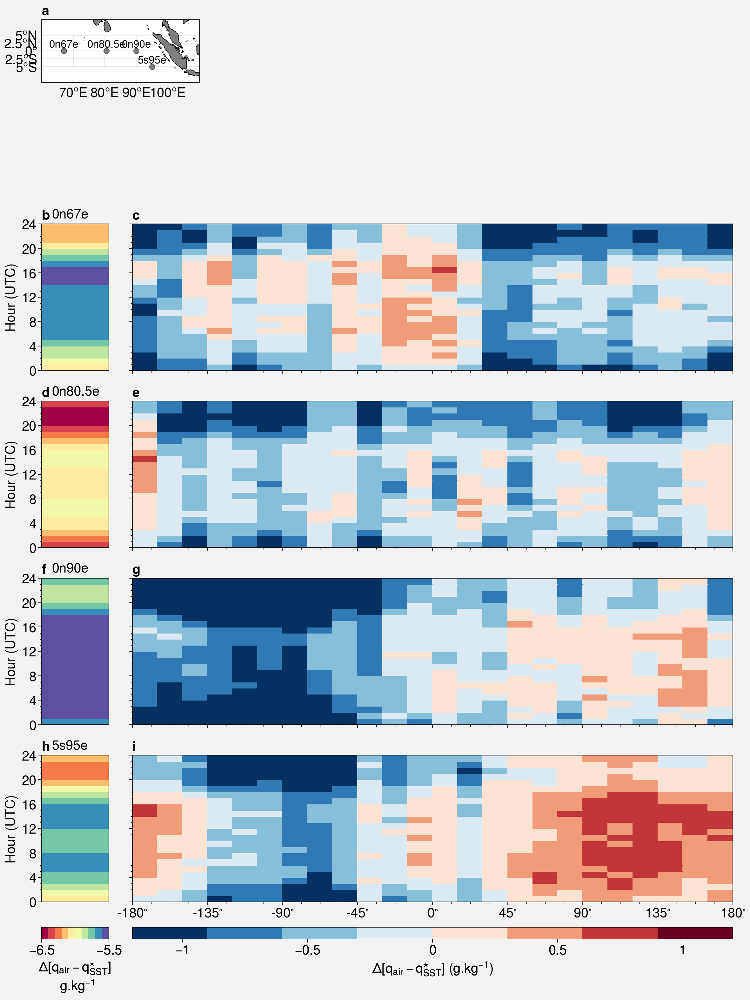

In [65]:
import cmocean
import proplot

proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 0,0,0,0],
    [1, 1, 0,0,0,0],
    [2, 3, 3,3,3,3],
    [4, 5, 5,5,5,5],
    [6, 7, 7,7,7,7],
    [8, 9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True,latlines=np.arange(-5,5.1,2.5) ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    delta_q_RAMA_binned_hour_no_MJO ,bin_edges, binnumber = scipy_stats.binned_statistic(delta_q_RAMA_NDJFM_no_MJO[i_mooring]['delta_q_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           delta_q_RAMA_NDJFM_no_MJO[i_mooring]['delta_q_month_filtered_MJO_filtered'].squeeze().values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))
    
    #zero_mask = net_SW_flux_RAMA_binned_hour_no_MJO==0
    #net_SW_flux_RAMA_binned_hour_no_MJO[zero_mask] = np.nan

    delta_q_binned_hour_to_plot = np.concatenate([np.expand_dims(delta_q_RAMA_binned_hour_no_MJO,axis=0),np.expand_dims(delta_q_RAMA_binned_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),0.5*(delta_q_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+
                                               delta_q_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    #net_SW_flux_binned_hour_to_plot[zero_mask] = np.nan
    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               delta_q_binned_hour_to_plot.T,cmap='spectral',vmin=-6.5,vmax=-5.5) #,vmin=0,vmax=800)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    
    axs[image_counter].annotate(i_mooring, xy=(0.15,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    image_counter = image_counter+1
    
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(delta_q_RAMA_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+delta_q_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(delta_q_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::]+delta_q_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               delta_q_RAMA_binned_by_phase_and_hour[i_mooring]['mean'].T - delta_q_RAMA_binned_hour_no_MJO,cmap='RdBu_r',vmin=-1.5,vmax=1.5)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='$\Delta [q_{air} - q^{\star}_{SST}]$ \n g.kg$^{-1}$',col=1,ticks=[-6.5,-5.5])
fig.colorbar(cs_temp_anom,loc='b',label=r'$\Delta [q_{air} - q^{\star}_{SST}]$ (g.kg$^{-1}$)',cols=[2,6],ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5])


figure_output_path = './Figures'
figure_file_name = 'delta_q_diurnal_cycle_modulation_equatorial_moorings'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')



In [68]:
data_vars_to_get = ['T_20_CT_anom']
T_profiles_RAMA_event_catalogue =RAMA_reader.RAMA_event_catalogue(T_profiles_RAMA,MJO_events_to_get,OLR_PC_magnitude,OLR_PC_phase,
                                                             data_vars_to_get,days_before=days_before,days_after=days_after)

T_profiles_RAMA_binned_by_phase_and_hour     = bin_events_over_phase_and_hour(T_profiles_RAMA_event_catalogue, 'T_20_CT_anom')

#T_profiles_RAMA_binned_by_phase_difference  = bin_events_over_phase(T_profiles_RAMA_event_catalogue, data_vars_to_get[0],difference_from_start_days=True)


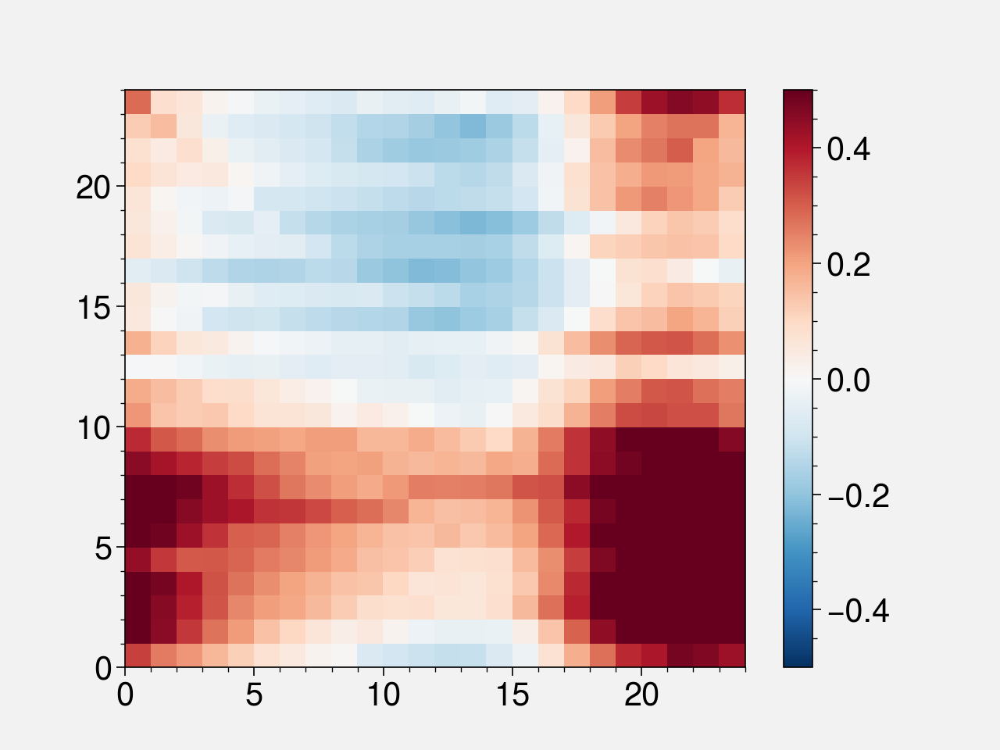

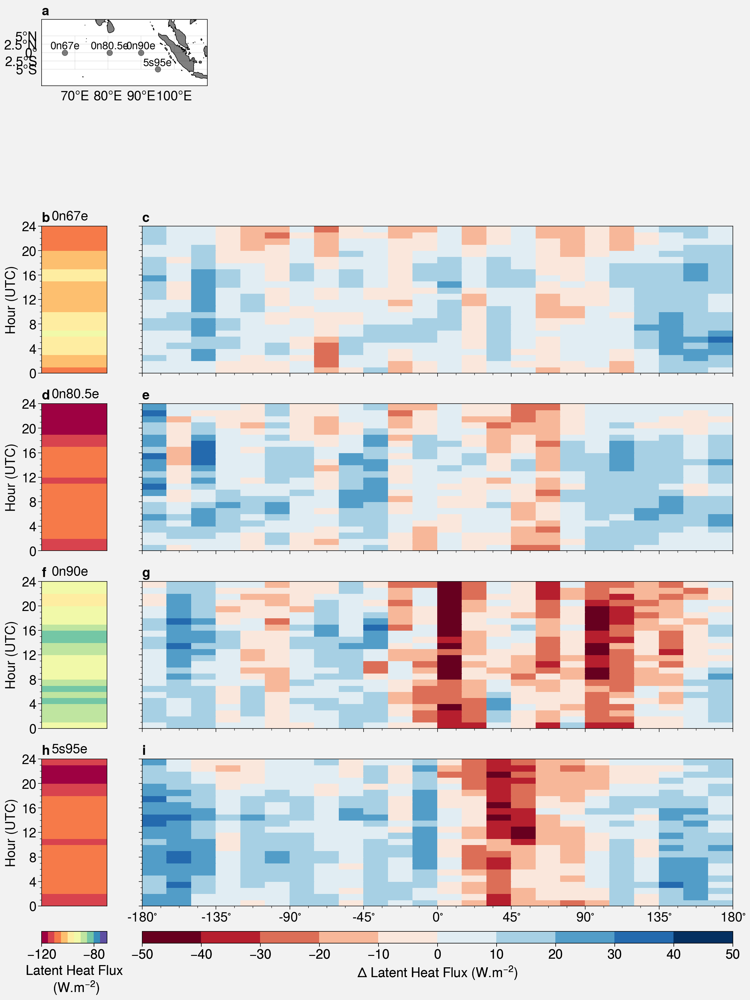

In [67]:
import cmocean
import proplot
start_date_to_plot = pandas.Timestamp('2018-11-01')
end_date_to_plot   = pandas.Timestamp('2019-01-20')

date_ticks = pandas.date_range(start=start_date_to_plot,end=end_date_to_plot,freq='10D')


proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25
proplot.rc['abc.size'] = 15
proplot.rc['abc.style'] = 'a'

image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    [1, 1, 0,0,0,0],
    [1, 1, 0,0,0,0],
    [2, 3, 3,3,3,3],
    [4, 5, 5,5,5,5],
    [6, 7, 7,7,7,7],
    [8, 9, 9,9,9,9]]
    
proplot.rc.reso = 'med'  # use higher res for zoomed in geographic features
proj = proplot.Proj('cyl', basemap=False)
moorings_to_plot = ['0n67e','0n80.5e','0n90e','5s95e']
lat_min = -10
lat_max =  10

fig, axs = proplot.subplots(image_drawing,proj={1:proj},width='30cm',height='40cm',share=False)
axs.format(facecolor='white',abc=True) #, color='grey')

for i_mooring in moorings_to_plot:
    mooring_latitude = mooring_fluxes[i_mooring]['latitude']
    mooring_longitude = mooring_fluxes[i_mooring]['longitude']


    cs_SST = axs[0].scatter(mooring_longitude,mooring_latitude,s=40,c='black',alpha=0.5)

    transform = ccrs.PlateCarree()._as_mpl_transform(axs[0])
    axs[0].annotate(i_mooring, xy=(mooring_longitude,mooring_latitude+0.3), xycoords=transform,
            ha='center', va='bottom',fontsize=12)

axs[0,0].format(latlim=(lat_min, lat_max),lonlim = (60,110),
                labels=True,land=True,coast=True,latlines=np.arange(-5,5.1,2.5) ) #lonlines=np.arange(60,110,30))

image_counter=1

for i_mooring in moorings_to_plot:
    
    
    
    latent_heat_flux_RAMA_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(latent_heat_flux_RAMA_NDJFM_no_MJO[i_mooring]['latent_heat_flux_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           latent_heat_flux_RAMA_NDJFM_no_MJO[i_mooring]['latent_heat_flux_month_filtered_MJO_filtered'].squeeze().values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))
    

    latent_heat_flux_binned_hour_to_plot = np.concatenate([np.expand_dims(latent_heat_flux_RAMA_binned_hour_no_MJO,axis=0),
                                                           np.expand_dims(latent_heat_flux_RAMA_binned_hour_no_MJO,axis=0)],axis=0)
    xx,yy = np.meshgrid(np.asarray([0,1]),   0.5*(latent_heat_flux_binned_by_phase_and_hour['hour_bin_edges'][1::]+
                                                  latent_heat_flux_binned_by_phase_and_hour['hour_bin_edges'][0:-1]))

    
    cs_temp = axs[image_counter].pcolormesh(xx,yy,
               -latent_heat_flux_binned_hour_to_plot.T,cmap='spectral',vmin=-120,vmax=-70)
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels(np.arange(0,25,4))
    axs[image_counter].set_ylabel('Hour (UTC)')
    
    axs[image_counter].set_xticks([])
    axs[image_counter].set_xticklabels([])
    
    axs[image_counter].annotate(i_mooring, xy=(0.15,1.04),
                               xycoords="axes fraction",fontsize=15,)

    
    
    image_counter = image_counter+1
    
    cs_temp_anom = axs[image_counter].pcolormesh(0.5*(latent_heat_flux_binned_by_phase_and_hour['phase_bin_edges'][0:-1]+latent_heat_flux_binned_by_phase_and_hour['phase_bin_edges'][1::]),
               0.5*(latent_heat_flux_binned_by_phase_and_hour['hour_bin_edges'][1::]+latent_heat_flux_binned_by_phase_and_hour['hour_bin_edges'][0:-1]),
               -latent_heat_flux_binned_by_phase_and_hour[i_mooring]['mean'].T - (-latent_heat_flux_RAMA_binned_hour_no_MJO),cmap='RdBu',vmin=-50,vmax=50)
    #axs[image_counter].colorbar(cs,loc='r',ticks=[-1.5,-1,-0.5,0,0.5,1.0,1.5],label='$\Delta$ SST ($^{\circ}$C)')
    axs[image_counter].set_yticks(np.arange(0,25,4))
    axs[image_counter].set_yticklabels([])
    
    axs[image_counter].set_xticks(np.arange(-180,181,45))
    axs[image_counter].set_xticklabels([])
    
                                       
                                       
    image_counter = image_counter+1
    
phases = []
for i_phase in np.arange(-180,181,45):
    phases.append(str(i_phase) + '$^{\circ}$')
axs[image_counter-1].set_xticklabels(phases,fontsize=15)
    
fig.colorbar(cs_temp,loc='b',label='Latent Heat Flux\n (W.m$^{-2}$)',col=1,ticks=[-120,-80])
fig.colorbar(cs_temp_anom,loc='b',label='$\Delta$ Latent Heat Flux (W.m$^{-2}$)',cols=[2,6]) #ticks=[-1.25,-1,-0.5,0,0.5,1.0,1.25]


figure_output_path = './Figures'
figure_file_name = 'latent_heat_flux_dirunal_cycle_modulation_equatorial_moorings'
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.png'),dpi=400,bbox='tight')
fig.savefig(os.path.join(figure_output_path,figure_file_name + '.pdf'),dpi=200,bbox='tight')

In [148]:
specific_humidity_air_RAMA_binned_by_phase_and_hour =  bin_events_over_phase_and_hour(specific_humidity_air_RAMA_event_catalogue,  'specific_humidity_air') 
specific_humidity_water_RAMA_binned_by_phase_and_hour = bin_events_over_phase_and_hour(specific_humidity_water_RAMA_event_catalogue, 'specific_humidity_water') 


In [149]:
NDJFM_months =[11,12,1,2,3]

specific_humidity_air_RAMA_NDJFM = filter_by_month(mooring_fluxes,'specific_humidity_air',NDJFM_months)
specific_humidity_air_RAMA_NDJFM_no_MJO = filter_MJO(specific_humidity_air_RAMA_NDJFM,specific_humidity_air_RAMA_event_catalogue,'specific_humidity_air_month_filtered')

specific_humidity_water_RAMA_NDJFM = filter_by_month(mooring_fluxes, 'specific_humidity_water',NDJFM_months)
specific_humidity_water_RAMA_NDJFM_no_MJO = filter_MJO(specific_humidity_water_RAMA_NDJFM,specific_humidity_water_RAMA_event_catalogue,'specific_humidity_water_month_filtered')



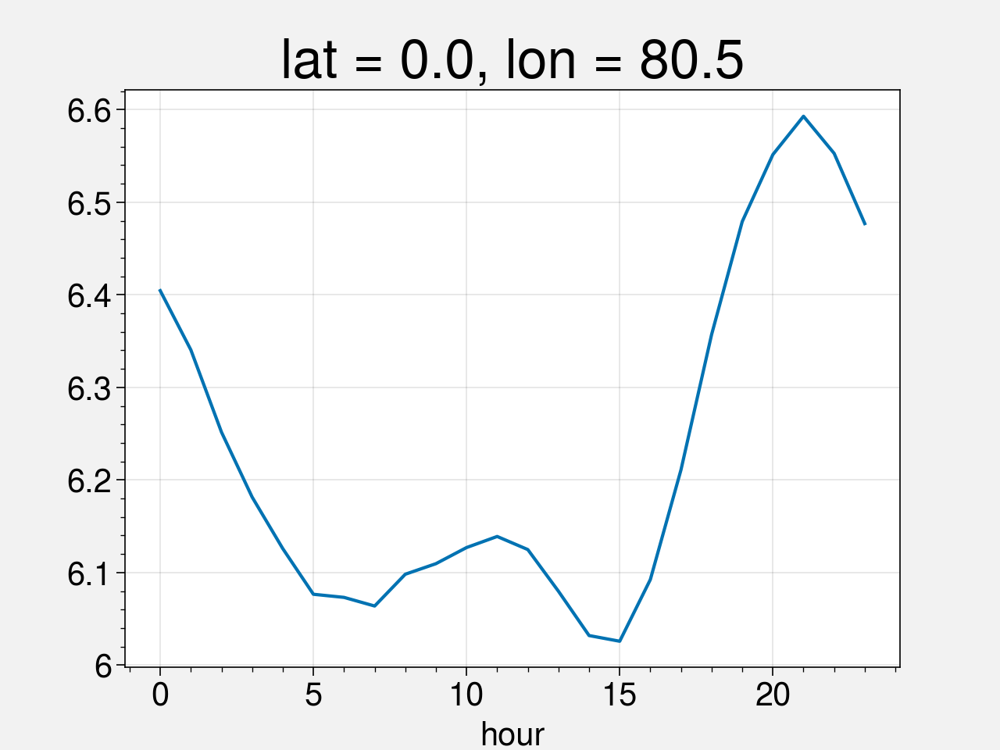

In [192]:
((1000*specific_humidity_water_RAMA_NDJFM_no_MJO['0n80.5e']['specific_humidity_water_month_filtered_MJO_filtered']).squeeze().groupby('time.hour').mean(dim='time')-
      specific_humidity_air_RAMA_NDJFM_no_MJO['0n80.5e']['specific_humidity_air_month_filtered_MJO_filtered'].squeeze().groupby('time.hour').mean(dim='time')) .plot()


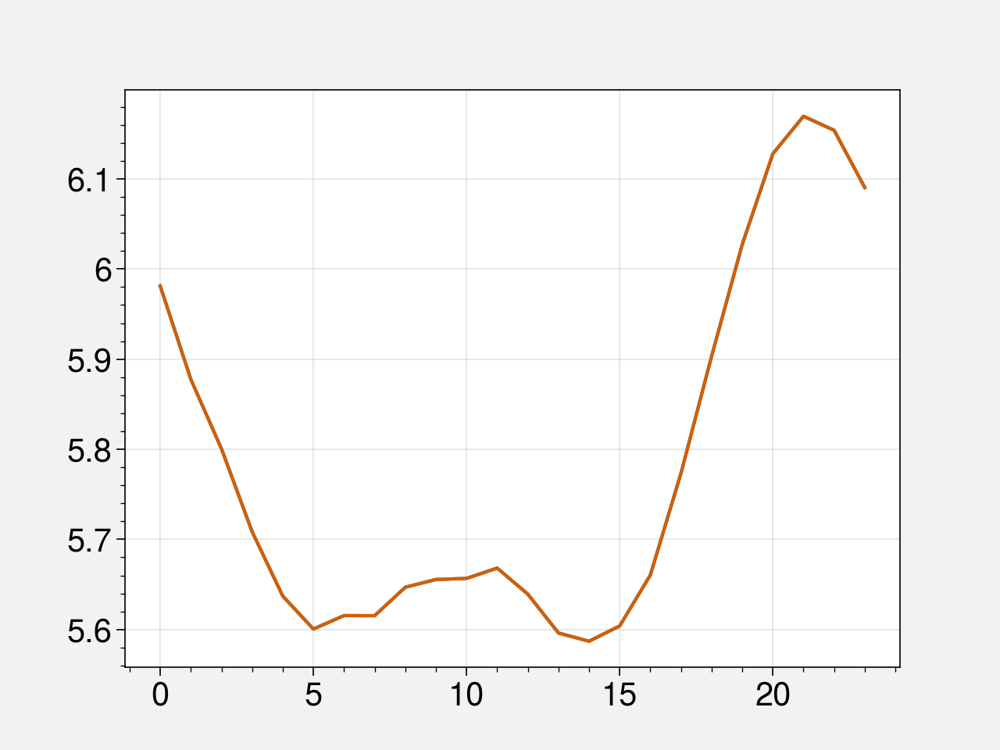

In [175]:
plt.plot(delta_q_air_q_water_binned_hour_to_plot.T)

In [66]:
magnitude_threshold = 1.0
phase_partitions = np.arange(-180,180+0.1,45)

#OLR_months = pandas.to_datetime(OLR_EOF['time'].values,utc=True).month
months_to_get = [11, 12, 1, 2, 3, 12]

OLR_PC_magnitude_filtered = OLR_PC_magnitude.sel(time=OLR_EOF['time'].dt.month.isin(months_to_get))
OLR_anom_filtered         = OLR_anom.sel(time=OLR_EOF['time'].dt.month.isin(months_to_get))
OLR_PC_phase_filtered     = OLR_PC_phase.sel(time=OLR_EOF['time'].dt.month.isin(months_to_get))  
time_filtered             = OLR_EOF['time'].sel(time=OLR_EOF['time'].dt.month.isin(months_to_get))  



OLR_phase_composite = event_analysis.phase_composite(OLR_anom_filtered,OLR_PC_magnitude_filtered.values,
                                                     OLR_PC_phase_filtered.values,phase_partitions,time_filtered.values,
                                      sensor_dims=['lat', 'lon'],sample_dim='time',magnitude_threshold=magnitude_threshold)


In [49]:
T_profiles_RAMA['0n90e'].keys()

dict_keys(['latitude', 'longitude', 'data_variables', 'time', 'time2', 'T_20', 'QT_5020', 'ST_6020', 'absolute_salinity_climatology', 'conservative_temperature_climatology', 'climatology_pressure', 'T_20_CT', 'T_20_CT_anom'])

In [59]:
NDJFM_months = [11,12,1,2,3]
T_profiles_RAMA_NDJFM = filter_by_month(T_profiles_RAMA, 'T_20_CT',NDJFM_months)
T_profiles_RAMA_NDJFM_no_MJO = filter_MJO(T_profiles_RAMA_NDJFM,T_profiles_RAMA_event_catalogue,'T_20_CT_month_filtered')


In [58]:
T_profile_RAMA_binned_by_phase_and_hour   = bin_events_over_phase_and_hour(T_profiles_RAMA_event_catalogue,  'T_20_CT',
                                                                           phase_bins=np.arange(-180,181,45))


In [67]:
blah = T_profiles_RAMA_NDJFM_no_MJO['0n90e']['T_20_CT_month_filtered_MJO_filtered'].groupby('time.hour').mean(dim='time')

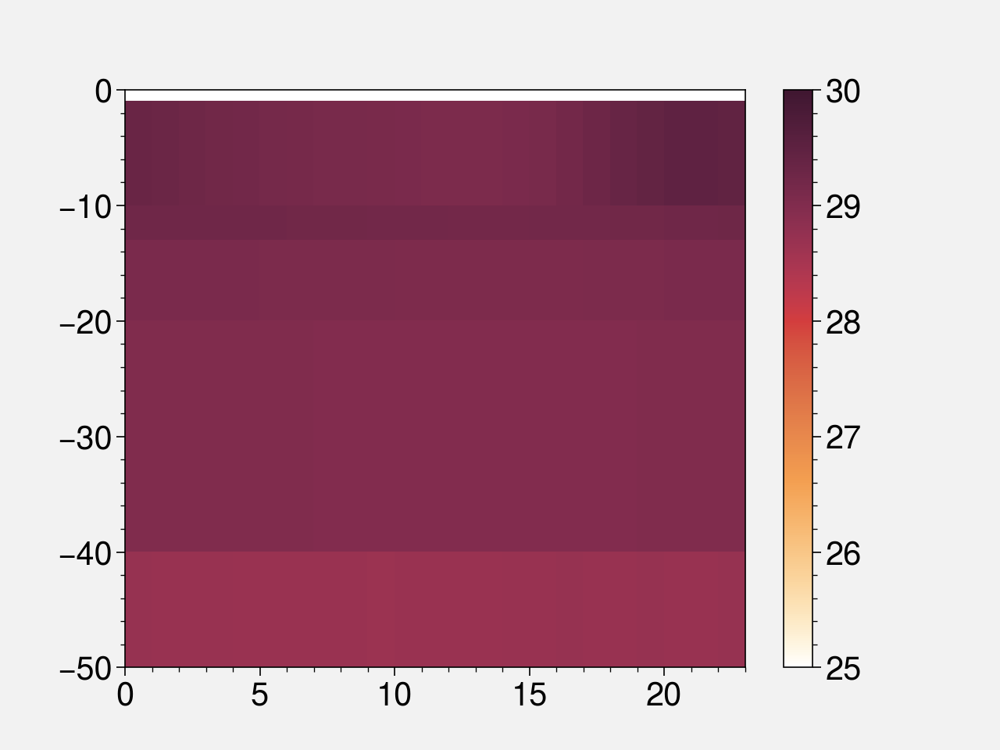

In [80]:
plt.pcolormesh(blah['hour'],-blah['depth'],blah.T,vmin=25,vmax=30)
plt.ylim(-50,0)
plt.colorbar()

In [84]:
blah['depth']

<xarray.DataArray 'depth' (depth: 13)>
array([  1.,  10.,  13.,  20.,  40.,  60.,  80., 100., 120., 140., 180., 300.,
       500.], dtype=float32)
Coordinates:
  * depth    (depth) float32 1.0 10.0 13.0 20.0 40.0 ... 140.0 180.0 300.0 500.0
Attributes:
    FORTRAN_format:  
    units:           m
    type:            UNEVEN
    epic_code:       3
    positive:        down
    standard_name:   depth

-180.0
-90.0
0.0
90.0


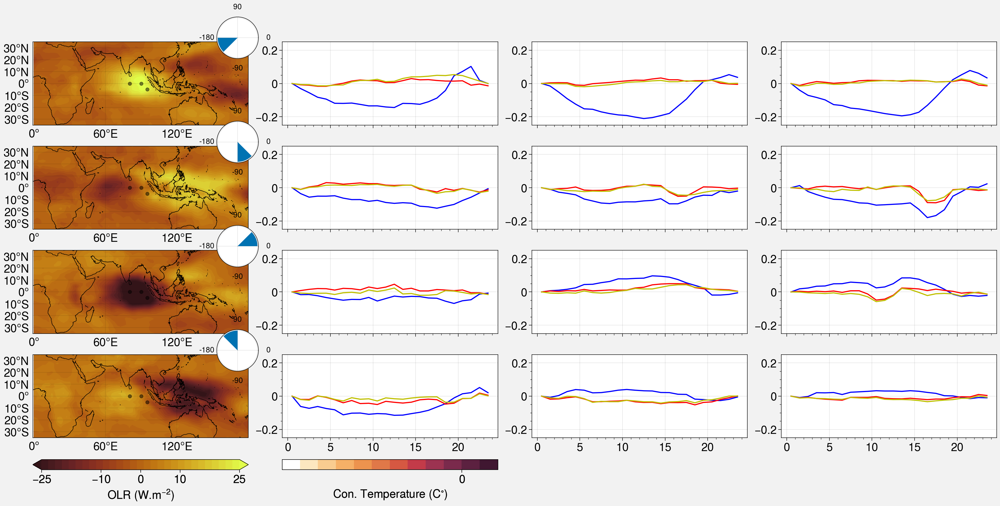

In [159]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib
import proplot
proplot.rc['land.color'] = 'grey'
proplot.rc['text.labelsize'] = 15
proplot.rc['text.titlesize'] = 25



proplot.rc.reso = 'med' # use higher res for zoomed in geographic features
#plt.figure(1,figsize=(20,10)) 
#proj = proplot.Proj('cyl', basemap=False)
#fig, axs = proplot.subplots(nrows=phase_angles.size, ncols=2,proj=proj,axwidth='10cm')

lon_min = -1
lon_max = 180
lat_min = -35
lat_max = 35
label_counter = 0

OLR_min = -25
OLR_max =  25

SST_min = -0.5
SST_max =  0.5

phase_angles  = OLR_phase_composite['phase_angle']
delta_phase = phase_partitions[1]-phase_partitions[0]
#plt.figure(i_phase,figsize=(20,10)) 


image_drawing = [  # the "picture" (1 == subplot A, 2 == subplot B, etc.)
    
    [1, 2,3,4],
    [5, 6,7,8],
    [9,10,11,12],
    [13,14,15,16]]

proj = proplot.Proj('cyl', basemap=False)

proj_mapping = {1:proj,2:None,3:None,4:None,
                5:proj,6:None,7:None,8:None,
                9:proj,10:None,11:None,12:None,
                13:proj,14:None,15:None,16:None} #,9:proj,10:None,11:proj,12:None,13:proj,14:None}

fig, axs = proplot.subplots(image_drawing,proj=proj_mapping,axwidth='10cm')

moorings_to_plot = ['0n80.5e','0n90e','5s95e']
#moorings_to_plot = ['0n90e']
image_counter = 0
row_counter = 0

phases_to_plot = OLR_phase_composite['phase_composite__olr']['phase_angle'][::2].values
for i_phase in phases_to_plot:
    #phase_to_get = phases_to_plot[i_phase] #(phase_angles.size-1) - i_phase
    #phase_to_get = i_phase
    print(i_phase)
    

    OLR_composite_for_phase     = OLR_phase_composite['phase_composite__olr'].sel(phase_angle=i_phase)
    #SST_composite_for_phase     = OISST_phase_composite['phase_composite__sst'].isel(phase_angle=phase_to_get)
#    print(OLR_composite_for_phase['phase_angle'].values)
    print('=====================')
    
    cs_OLR = axs[image_counter].contourf(OLR_composite_for_phase['lon'],OLR_composite_for_phase['lat'],OLR_composite_for_phase,
                               levels=np.linspace(OLR_min,OLR_max,30),cmap='Solar',extend='both')
    
    
    mooring_longitude = []
    mooring_latitude  = []
    for i_mooring in moorings_to_plot:

        mooring_longitude.append(T_profiles_RAMA[i_mooring]['longitude'])
        mooring_latitude.append(T_profiles_RAMA[i_mooring]['latitude'])
    
    axs[image_counter].scatter(mooring_longitude,mooring_latitude,s=20,c='black',alpha=0.5)
    
    axs[image_counter].format(land=False,coast=True,facecolor='white',lonlines=np.arange(-180,181,60)) #, color='grey')
    axs[image_counter].format(lonlim=(lon_min, lon_max), latlim=(lat_min, lat_max), labels=True)


   
    axins = inset_axes(axs[image_counter], width="100%", height="100%",
                   bbox_to_anchor=(0.7, .8, .5, .5),
                   bbox_transform=axs[row_counter,0].transAxes, loc=2, borderpad=0, 
                    axes_class = matplotlib.projections.get_projection_class('polar'))
    axins.fill_between(np.linspace(np.deg2rad(i_phase+(delta_phase)), 
                                   np.deg2rad(i_phase), 100),  0, 1)
    axins.set_xticks(np.pi/180. * np.linspace(0,  360, 4, endpoint=False))
    axins.set_xticklabels(np.concatenate([np.arange(0,180,90),np.arange(-180,0,90)],axis=0),fontsize=10)
    axins.set_yticklabels([])
    image_counter = image_counter+1

    #T_profiles_clim_by_hour  = blah = T_profiles_RAMA_NDJFM_no_MJO[i_mooring]['T_20_CT_month_filtered_MJO_filtered'].groupby('time.hour').mean(dim='time')
    
    
    for i_mooring in moorings_to_plot:
        depth_levels = T_profiles_RAMA[i_mooring]['T_20']['depth'].sel(depth=slice(0,51)).values

        
        for i_depth in range(0,depth_levels.size):
        
            T_depth_slice_binned_hour_no_MJO ,bin_edges, binnumber         = scipy_stats.binned_statistic(T_profiles_RAMA_NDJFM_no_MJO[i_mooring]['T_20_CT_month_filtered_MJO_filtered']['time.hour'].values, 
                                                                                           T_profiles_RAMA_NDJFM_no_MJO[i_mooring]['T_20_CT_month_filtered_MJO_filtered'][:,i_depth].values, 
                                                                                           np.nanmean, bins=np.arange(0,24.1,1))
            
            if i_depth ==0:
                
                T_profile_binned_hour_no_MJO = np.zeros([T_depth_slice_binned_hour_no_MJO.shape[0],depth_levels.size])
                
            T_profile_binned_hour_no_MJO[:,i_depth] = T_depth_slice_binned_hour_no_MJO
                
        i_phase_mooring = np.nonzero(i_phase==T_profile_RAMA_binned_by_phase_and_hour['phase_bin_edges'])[0]
        T_profile_hour_bin_by_phase = T_profile_RAMA_binned_by_phase_and_hour[i_mooring]['mean'][i_phase_mooring,:,0:depth_levels.size].squeeze()
        delta_T_profile_by_hour = T_profile_hour_bin_by_phase - T_profile_binned_hour_no_MJO
        
        
        hour_bins = 0.5*(T_profile_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::] +
                    T_profile_RAMA_binned_by_phase_and_hour['hour_bin_edges'][0:-1] ) 
        
        #cs = axs[image_counter].pcolormesh(hour_bins,-depth_levels[1::],delta_T_profile_by_hour[:,1::].T)#levels=np.arange(-0.75,0.75,0.1),cmap='balance')
#       #                        levels=np.linspace(SST_min,SST_max,30),cmap='balance',extend='both')
        
        color_list = ['b','r','y','m','g','k']
        for i_depth in range(0,3): #5): #depth_levels.size):

             axs[image_counter].plot(hour_bins,delta_T_profile_by_hour[:,i_depth]-delta_T_profile_by_hour[0,i_depth],color=color_list[i_depth])
        #axs[image_counter].invert_yaxis()
        axs[image_counter].set_ylim([-0.25,0.25])
        image_counter = image_counter+1
    row_counter =row_counter+1
#axs[-1].colorbar(cs,loc='bottom')
cbar = fig.colorbar(cs_OLR, label='OLR (W.m$^{-2}$)', ticks=[-25,-10,0,10,25], loc='b', col=1)
cbar = fig.colorbar(cs,  label=r'Con. Temperature (C$^{\circ}$)', ticks=np.arange(-1,1.1,0.5), loc='b', col=2)



In [137]:
T_profiles_RAMA[i_mooring].keys()

dict_keys(['latitude', 'longitude', 'data_variables', 'time', 'time2', 'T_20', 'QT_5020', 'ST_6020', 'TIC_7020', 'ZSST_2003', 'absolute_salinity_climatology', 'conservative_temperature_climatology', 'climatology_pressure', 'T_20_CT', 'T_20_CT_anom'])

In [134]:
len(image_drawing[1])

5

In [131]:
T_profile_hour_bin_by_phase.shape

(24, 5)

In [107]:
i_phase_to_get

array([0])

In [106]:
T_profile_hour_bin_by_phase.squeeze()

array([[29.762918, 29.343428, 29.253036, 29.141317, 29.09594 ],
       [29.70123 , 29.347702, 29.25207 , 29.140522, 29.093493],
       [29.626734, 29.34603 , 29.250814, 29.1415  , 29.08367 ],
       [29.554943, 29.341246, 29.248558, 29.137608, 29.07388 ],
       [29.495827, 29.32395 , 29.230553, 29.126347, 29.064857],
       [29.442713, 29.317125, 29.223724, 29.116116, 29.063635],
       [29.418858, 29.322495, 29.224808, 29.12378 , 29.060751],
       [29.385534, 29.321218, 29.227772, 29.121645, 29.064865],
       [29.35867 , 29.318531, 29.226858, 29.12252 , 29.062593],
       [29.33379 , 29.316092, 29.22663 , 29.121271, 29.062866],
       [29.316399, 29.313847, 29.228777, 29.118282, 29.063282],
       [29.296257, 29.312197, 29.227146, 29.12403 , 29.069077],
       [29.279692, 29.305508, 29.224491, 29.125757, 29.070436],
       [29.283375, 29.308754, 29.226545, 29.126236, 29.074038],
       [29.31064 , 29.316982, 29.22975 , 29.128675, 29.07796 ],
       [29.36652 , 29.311972, 29.226185,

In [97]:
T_profile_RAMA_binned_by_phase_and_hour['phase_bin_edges']

array([-180, -135,  -90,  -45,    0,   45,   90,  135,  180])

In [94]:
OLR_phase_composite['phase_composite__olr']['phase_angle']

<xarray.DataArray 'phase_angle' (phase_angle: 8)>
array([-180., -135.,  -90.,  -45.,    0.,   45.,   90.,  135.])
Coordinates:
  * phase_angle  (phase_angle) float64 -180.0 -135.0 -90.0 ... 45.0 90.0 135.0

In [58]:
T_profiles_RAMA_NDJFM_no_MJO[i_mooring]['T_20_CT_month_filtered_MJO_filtered']['time.hour']

<xarray.DataArray 'hour' (time: 28722)>
array([18, 19, 20, ..., 21, 22, 23])
Coordinates:
  * time     (time) datetime64[ns] 2004-11-09T18:00:00 ... 2018-03-17T23:00:00

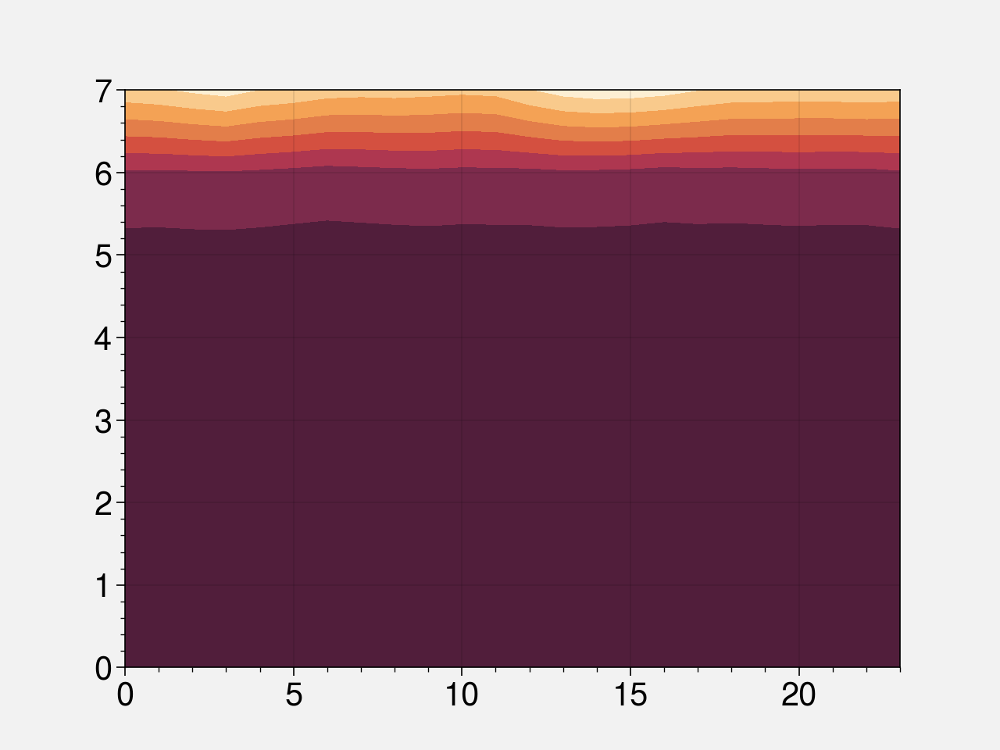

In [105]:
plt.contourf(T_profile_hour_bin_by_phase.T)

In [99]:
T_profiles_RAMA_no_MJO[i_mooring].shape

(28722, 13)

In [96]:
T_profile_hour_bin_by_phase

array([[29.402359, 29.182384, 29.074833, 29.042618, 29.006138, 29.137201,
        28.088001, 24.203571],
       [29.344923, 29.18788 , 29.082088, 29.043758, 29.013031, 29.142033,
        28.106218, 24.062387],
       [29.30601 , 29.180502, 29.082762, 29.045588, 29.006922, 29.126192,
        28.0651  , 23.820023],
       [29.230303, 29.175709, 29.055758, 29.03414 , 28.985224, 29.124588,
        28.035143, 23.626652],
       [29.18532 , 29.160303, 29.057863, 29.02701 , 28.990995, 29.138222,
        28.109825, 23.980906],
       [29.172941, 29.168455, 29.078114, 29.043922, 29.007965, 29.154345,
        28.199036, 24.139584],
       [29.15901 , 29.164043, 29.080309, 29.041563, 29.009407, 29.152693,
        28.297596, 24.38223 ],
       [29.14117 , 29.153973, 29.071371, 29.034426, 29.008604, 29.154036,
        28.239098, 24.45449 ],
       [29.116892, 29.138985, 29.064245, 29.0215  , 29.009584, 29.14953 ,
        28.182379, 24.410736],
       [29.099815, 29.13007 , 29.052341, 29.015152, 29.

In [76]:
    T_profile_hour_bin_by_phase = T_profile_RAMA_binned_by_phase_and_hour[i_mooring]['mean']


In [82]:
T_profile_RAMA_binned_by_phase_and_hour['hour_bin_edges']

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24.])

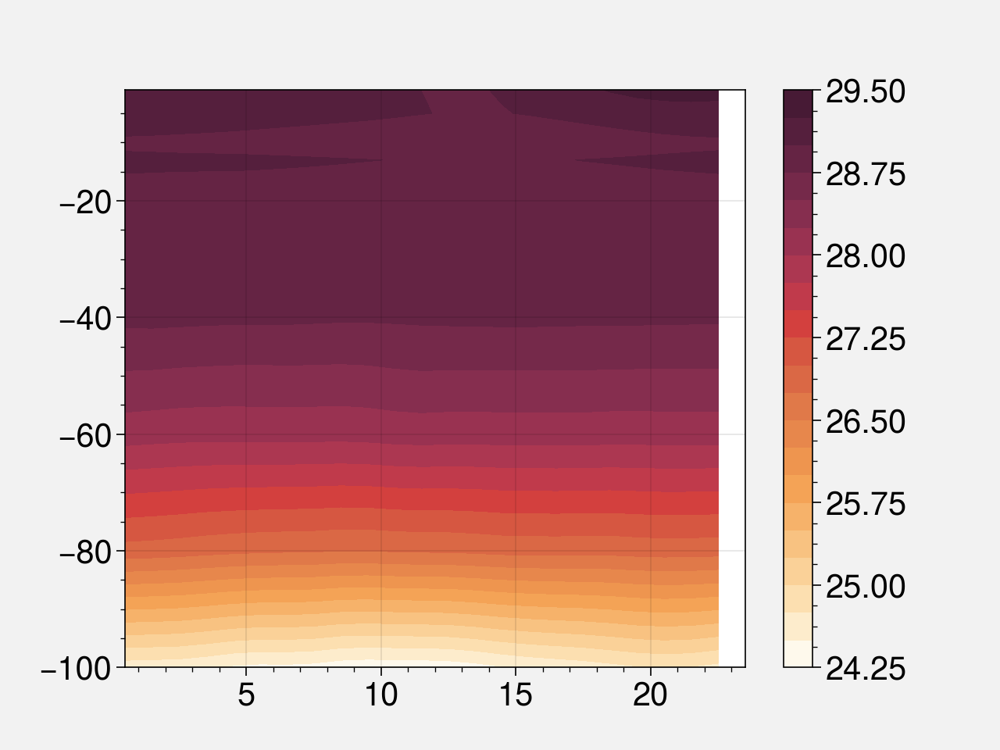

In [64]:


plt.contourf(T_profile_diurnal_cycle['0n80.5e']['hour'].values,-T_profile_diurnal_cycle['0n80.5e']['depth'][0:10],
             T_profile_diurnal_cycle['0n80.5e'][:,0:10].T,levels=20)
plt.colorbar()

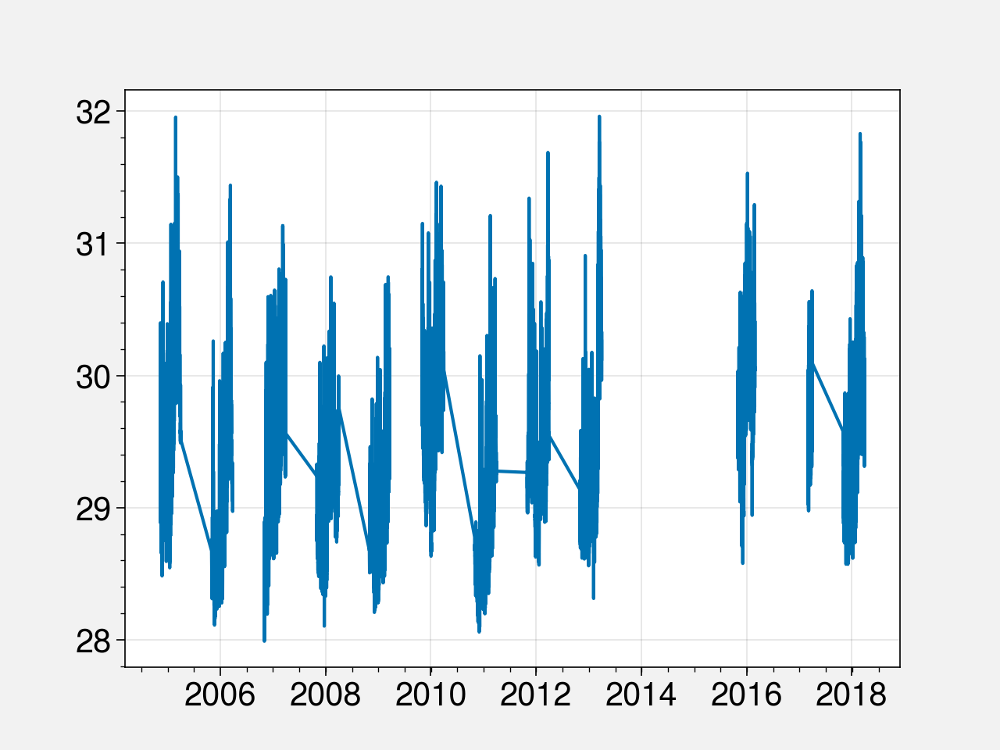

In [221]:
plt.plot(T_profiles_RAMA_NDJF['time'],T_profiles_RAMA_NDJF[:,0])

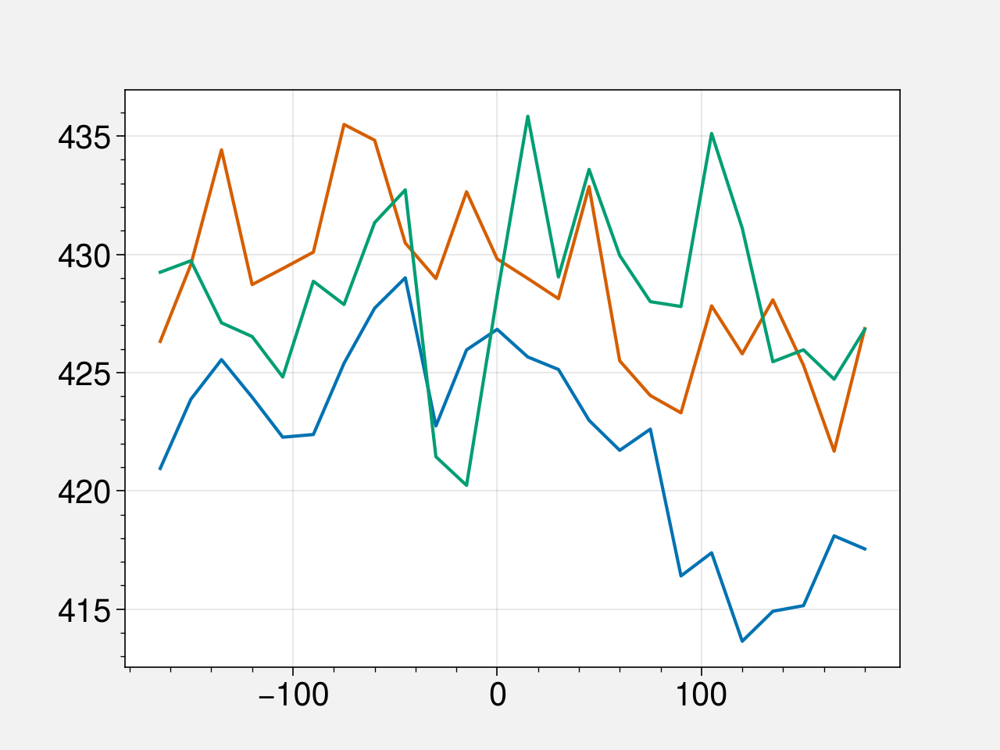

In [159]:

plt.plot(LW_rad_flux_binned_by_phase['phase_bin_edges'][1::],LW_rad_flux_binned_by_phase['0n80.5e']['mean'])
plt.plot(LW_rad_flux_binned_by_phase['phase_bin_edges'][1::],LW_rad_flux_binned_by_phase['8s67e']['mean'])

In [203]:
SST_RAMA_binned_by_phase_and_hour.keys()

dict_keys(['4s67e', '5s95e', '4n90e', '4s80.5e', '1.5s67e', '12n90e', '4s57e', '8n67e', '4n67e', '8s55e', '0n80.5e', '8s95e', '8n90e', '12s67e', '12s93e', '15n65e', '1.5s80.5e', '8s67e', '0n90e', '15n90e', '12s80.5e', '0n67e', '12s55e', '1.5n67e', '8s80.5e', 'phase_bin_edges', 'hour_bin_edges'])

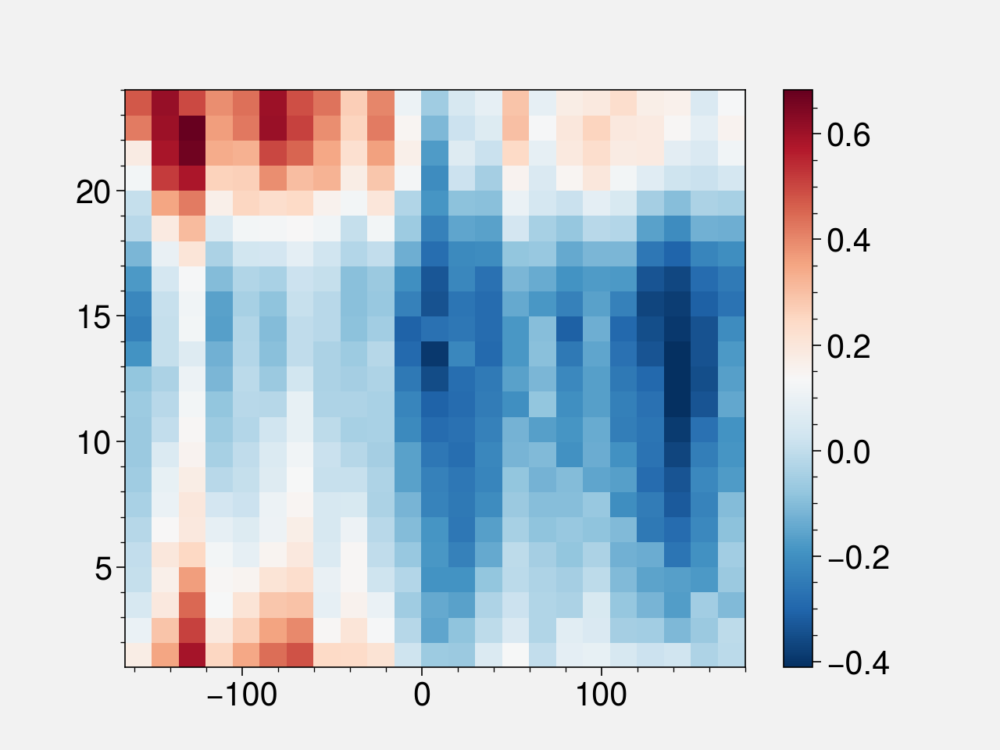

In [314]:
plt.pcolormesh(SST_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::],SST_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::],SST_RAMA_binned_by_phase_and_hour['0n80.5e']['mean'].T-SST_RAMA_binned_by_phase_and_hour['0n80.5e']['mean'].mean(),cmap='RdBu_r')
plt.colorbar()

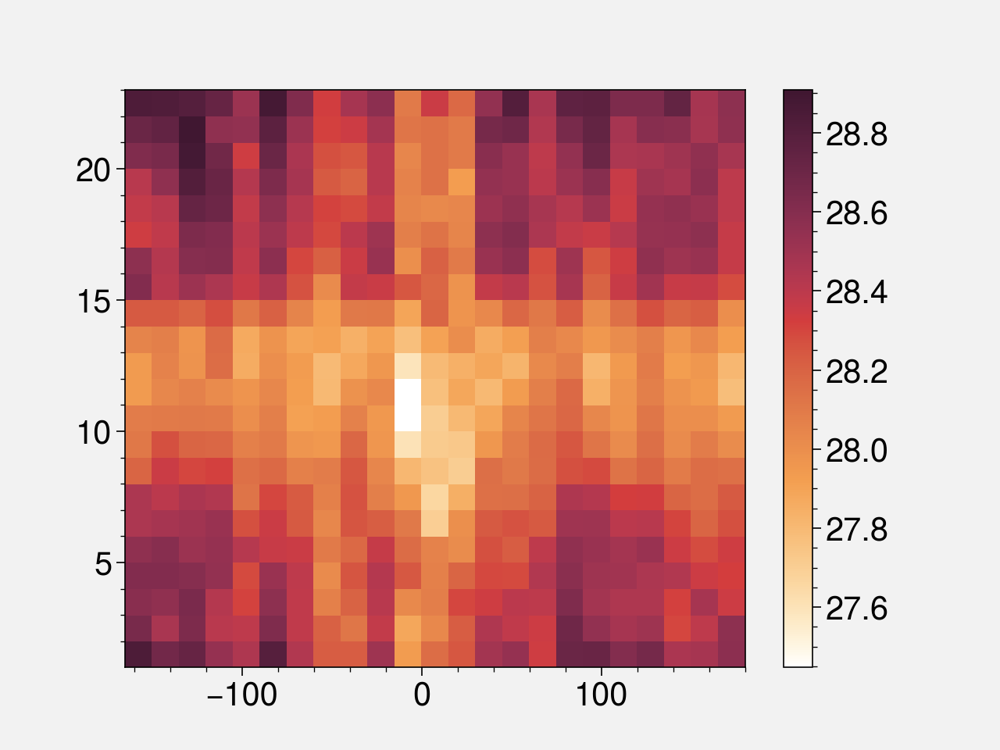

In [209]:
plt.pcolormesh(T_air_RAMA_binned_by_phase_and_hour['phase_bin_edges'][1::],T_air_RAMA_binned_by_phase_and_hour['hour_bin_edges'][1::],T_air_RAMA_binned_by_phase_and_hour['0n80.5e']['mean'].T)
plt.colorbar()

In [60]:
magnitude_threshold = 1.0
phase_partitions = np.arange(-180,180+0.1,45)


OLR_phase_composite = event_analysis.phase_composite(OLR_anom,OLR_PC_magnitude.values,OLR_PC_phase.values,phase_partitions,OLR_EOF['time'].values,
                                      sensor_dims=['lat', 'lon'],sample_dim='time',magnitude_threshold=magnitude_threshold)
#OISST_phase_composite = event_analysis.phase_composite(OISST_anom,OLR_PC_magnitude.values,OLR_PC_phase.values,phase_partitions,OLR_EOF['time'].values,
#                                      sensor_dims=['lat', 'lon'],sample_dim='time',magnitude_threshold=magnitude_threshold)

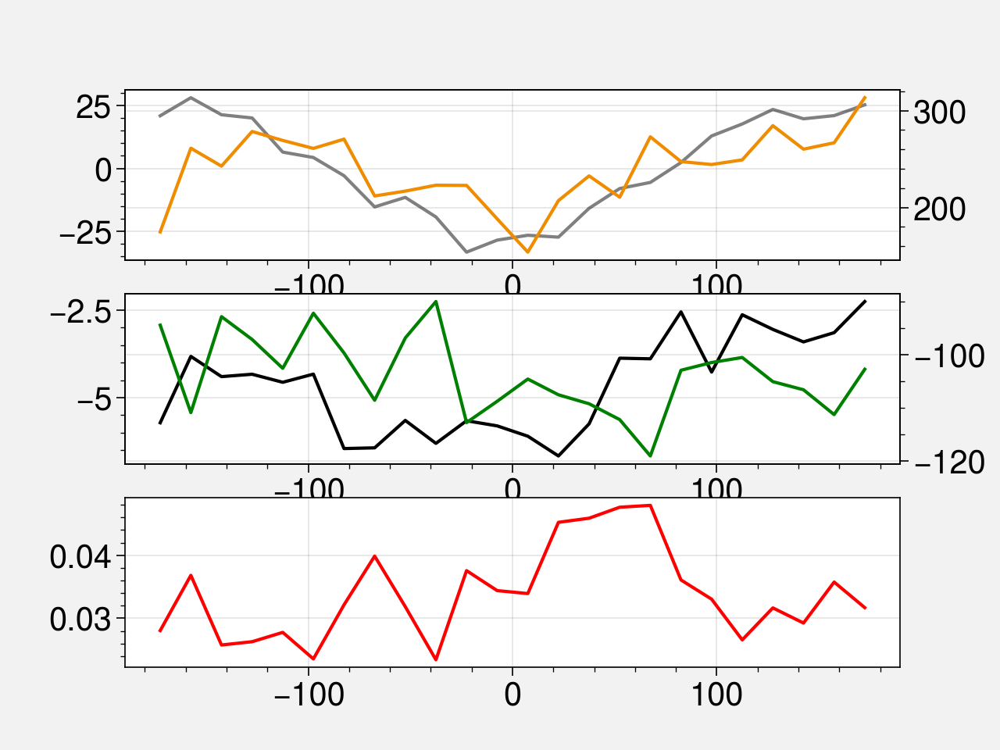

In [61]:
fig = plt.figure(1)
ax  = fig.add_subplot(3,1,1)
ax.plot(0.5*(OLR_binned_by_phase['phase_bin_edges'][0:-1]+OLR_binned_by_phase['phase_bin_edges'][1::]),
        OLR_binned_by_phase['0n80.5e']['mean'],'grey',label='OLR')
ax2 = ax.twinx()
ax2.plot(0.5*(SW_rad_flux_binned_by_phase['phase_bin_edges'][0:-1]+SW_rad_flux_binned_by_phase['phase_bin_edges'][1::]),
              SW_rad_flux_binned_by_phase['0n80.5e']['mean'],'yellow8',label='SW rad')
ax  = fig.add_subplot(3,1,2)
ax.plot(0.5*(sens_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+sens_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][1::]),
        -sens_heat_flux_RAMA_binned_by_phase['0n80.5e']['mean'],'black',label='sens. heat flux')
ax2 = ax.twinx()
ax2.plot(0.5*(latent_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+latent_heat_flux_RAMA_binned_by_phase['phase_bin_edges'][1::]),
              -latent_heat_flux_RAMA_binned_by_phase['0n80.5e']['mean'],'green',label='latent. heat flux')
ax  = fig.add_subplot(3,1,3)
ax.plot(0.5*(wind_stress_RAMA_binned_by_phase['phase_bin_edges'][0:-1]+wind_stress_RAMA_binned_by_phase['phase_bin_edges'][1::]),
        wind_stress_RAMA_binned_by_phase['0n80.5e']['mean'],'red',label='wind stress')



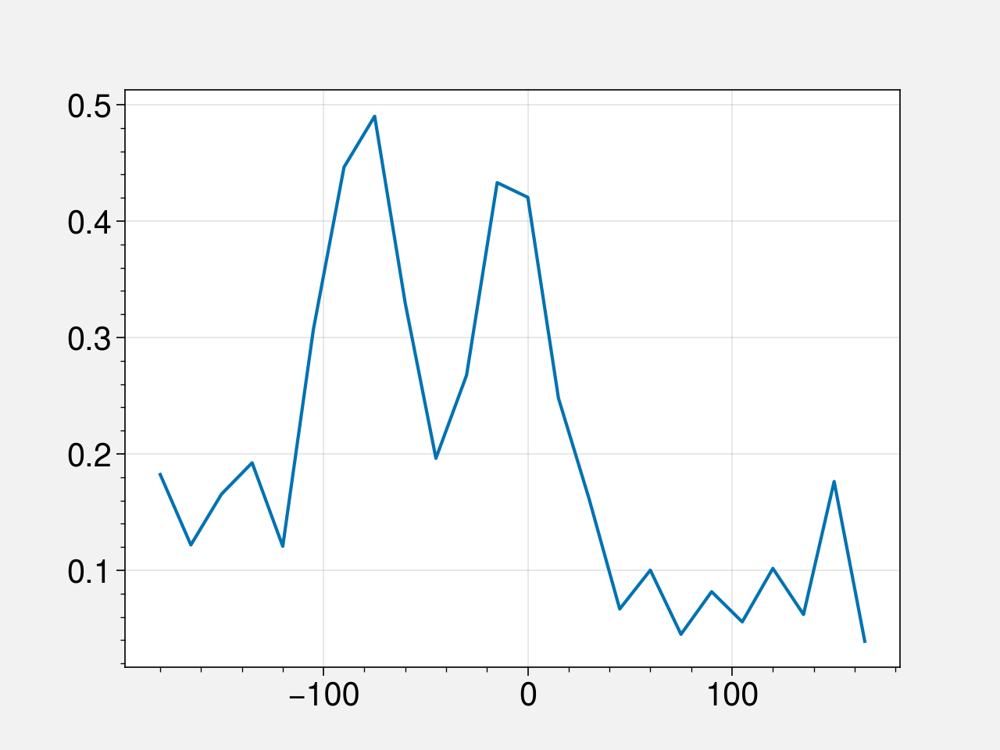

In [103]:
plt.plot(Rain_RAMA_binned_by_phase['phase_bin_edges'][0:-1],Rain_RAMA_binned_by_phase['0n80.5e']['mean'])

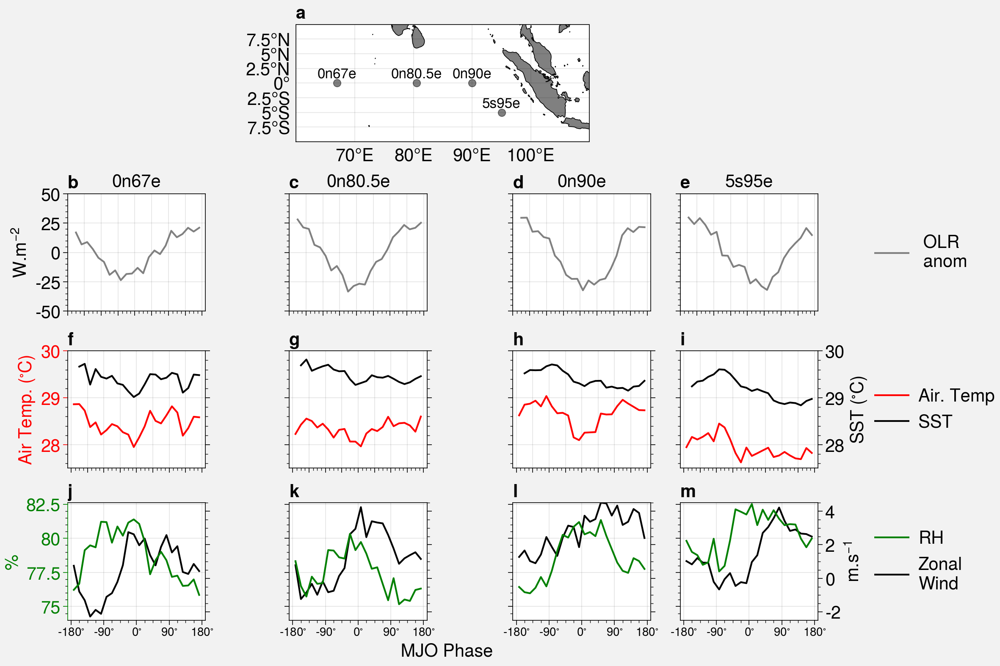

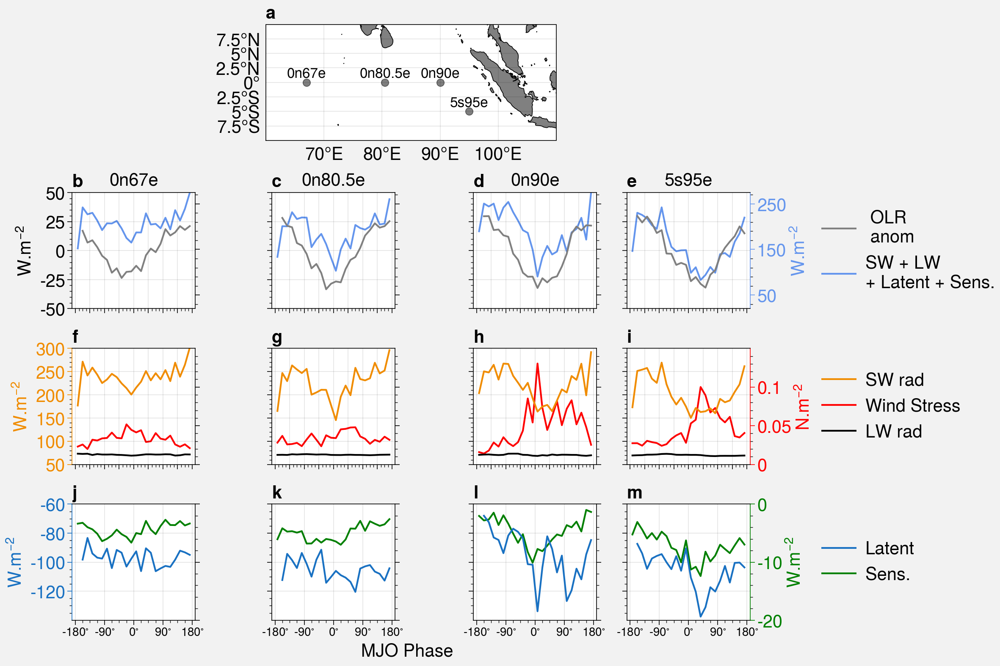

In [75]:

#ADCP_RAMA_binned_by_phase        = bin_events_over_phase(SST_RAMA_event_catalogue, 'T_25')
#S_profiles_RAMA_binned_by_phase  = bin_events_over_phase(rain_RAMA_event_catalogue, 'RN_485')


In [132]:
MJO_events_to_get

'T_20'

In [71]:
T_profiles_RAMA_binned_by_phase.keys()

dict_keys(['4n67e', '1.5n67e', '12s80.5e', '12s93e', '8s55e', '12s55e', '4n90e', '8n90e', '4s80.5e', '8s80.5e', '5s95e', '8n67e', '15n90e', '0n80.5e', '1.5s67e', '4s67e', '8s67e', '0n67e', '4s57e', '0n90e', '8s95e', '12n90e', '15n65e', '1.5s80.5e', '12s67e', 'phase_bin_edges'])

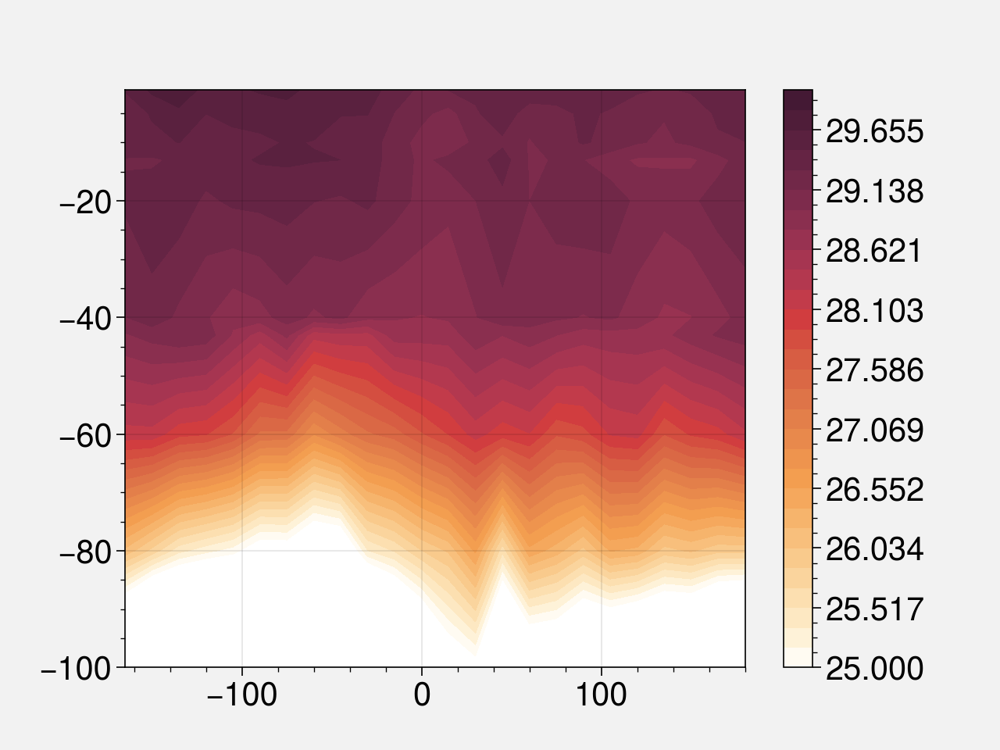

In [141]:
plt.contourf(T_profiles_RAMA_binned_by_phase['phase_bin_edges'][1::],-T_profiles_RAMA['0n80.5e']['T_20']['depth'][0:10],T_profiles_RAMA_binned_by_phase['0n80.5e']['mean'][:,0:10].T,levels=np.linspace(25,30,30))

plt.colorbar()

<xarray.DataArray 'T_20' (time: 168163, depth: 19)>
[3195097 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2001-10-26T17:00:00 ... 2021-01-01T11:00:00
  * depth    (depth) float32 1.0 10.0 20.0 25.0 40.0 ... 250.0 300.0 500.0 750.0
    lat      float32 -5.0
    lon      float32 95.0
Attributes:
    name:            T
    long_name:       TEMPERATURE (C)
    generic_name:    temp
    FORTRAN_format:  f10.2
    units:           C
    epic_code:       20

In [21]:
T_profiles_RAMA     = RAMA_reader.read_data_for_variable(ocean_mooring_object,'T_profiles')
SST_RAMA            = RAMA_reader.read_data_for_variable(ocean_mooring_object,'SST')
ADCP_RAMA           = RAMA_reader.read_data_for_variable(ocean_mooring_object,'ADCP')
current_vel_RAMA    = RAMA_reader.read_data_for_variable(ocean_mooring_object,'current_vel')
S_profiles_RAMA     = RAMA_reader.read_data_for_variable(ocean_mooring_object,'S_profiles')


dict_keys(['8s55e', '8s95e', '1.5s80.5e', '1.5s67e', '0n90e', '12s93e', '15n90e', '12s55e', '4n90e', '15n65e', '4s57e', '0n80.5e', '4n67e', '1.5n67e', '0n67e', '12s80.5e', '8n90e', '4s67e', '12n90e', '8n67e', '5s95e', '8s67e', '8s80.5e', '4s80.5e', '12s67e'])


NameError: name 'dsa' is not defined

In [112]:
OLR_binned_by_lag = bin_events_over_timelag(OLR_event_catalogue_at_station, 'olr',n_days=60,days_before=10,days_after=10,time_interval='day')

dict_keys(['15n90e', '1.5n67e', '8s95e', '1.5s67e', '15n65e', '4s67e', '4s80.5e', '8n67e', '8s67e', '0n67e', '8n90e', '12n90e', '12s67e', '8s80.5e', '8s55e', '1.5s80.5e', '0n90e', '12s55e', '12s93e', '4n90e', '4s57e', '5s95e', '12s80.5e', '0n80.5e'])
15n90e


NameError: name 'scipy_stats' is not defined

In [37]:
OLR_binned_by_lag.keys()

dict_keys(['1.5n67e', '12s80.5e', '12s93e', '8s55e', '12s55e', '4n90e', '8n90e', '4s80.5e', '8s80.5e', '5s95e', '8n67e', '15n90e', '0n80.5e', '1.5s67e', '4s67e', '8s67e', '0n67e', '4s57e', '0n90e', '8s95e', '12n90e', '15n65e', '1.5s80.5e', '12s67e', 'lag'])

In [31]:
np.asarray(OLR_event_catalogue_at_station['0n90e']['initiation_time']).min()

numpy.datetime64('2007-10-29T00:00:00.000000000')

NameError: name 'T_air_RAMA_binned_by_lag' is not defined

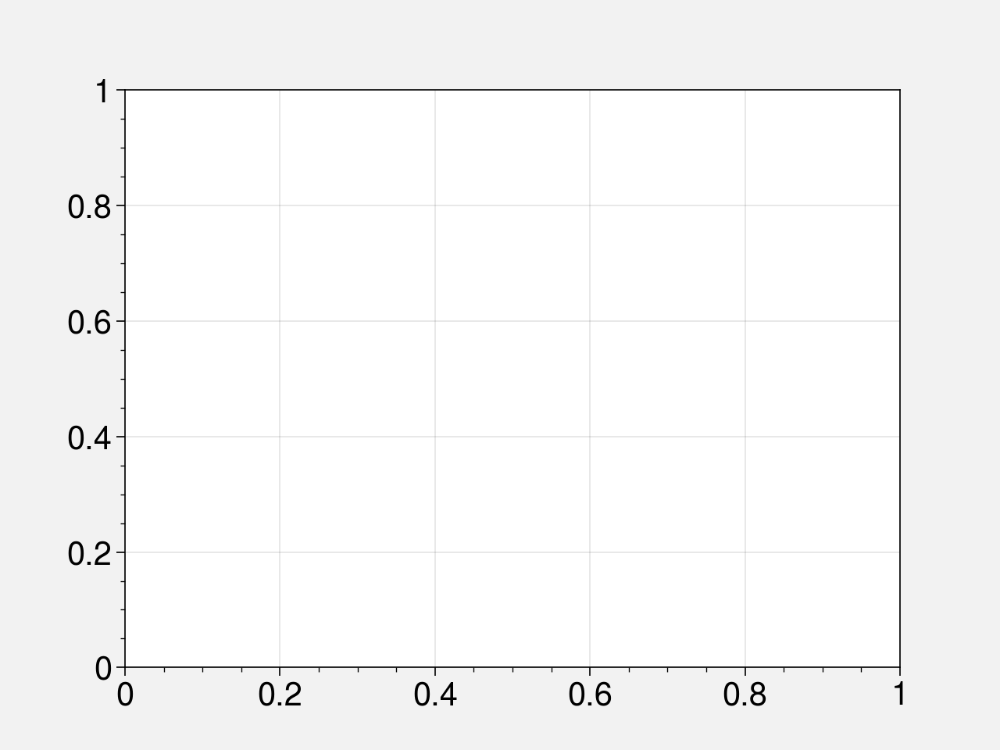

In [35]:
fig = plt.figure(1)
ax  = fig.add_subplot(1,1,1)

ax.plot(T_air_RAMA_binned_by_lag['lag_hours'][1::]/24,T_air_RAMA_binned_by_lag['0n67e']['mean'],'r')
ax2 = ax.twinx()
#ax2.plot(SST_binned_events_by_lag['lag_hours'][1::]/24,SST_binned_events_by_lag['0n67e']['mean'],'b')
ax2.plot(RH_RAMA_binned_by_lag['lag_hours'][1::]/24,RH_RAMA_binned_by_lag['0n67e']['mean'],'g')

fig = plt.figure(2)
ax  = fig.add_subplot(1,1,1)
ax.plot(T_air_RAMA_binned_by_lag['lag_hours'][1::]/24,T_air_RAMA_binned_by_lag['0n90e']['mean'],'r')
ax2 = ax.twinx()

#ax2.plot(SST_binned_events_by_lag['lag_hours'][1::]/24,SST_binned_events_by_lag['0n90e']['mean'],'b')
ax2.plot(RH_RAMA_binned_by_lag['lag_hours'][1::]/24,RH_RAMA_binned_by_lag['0n90e']['mean'],'g')


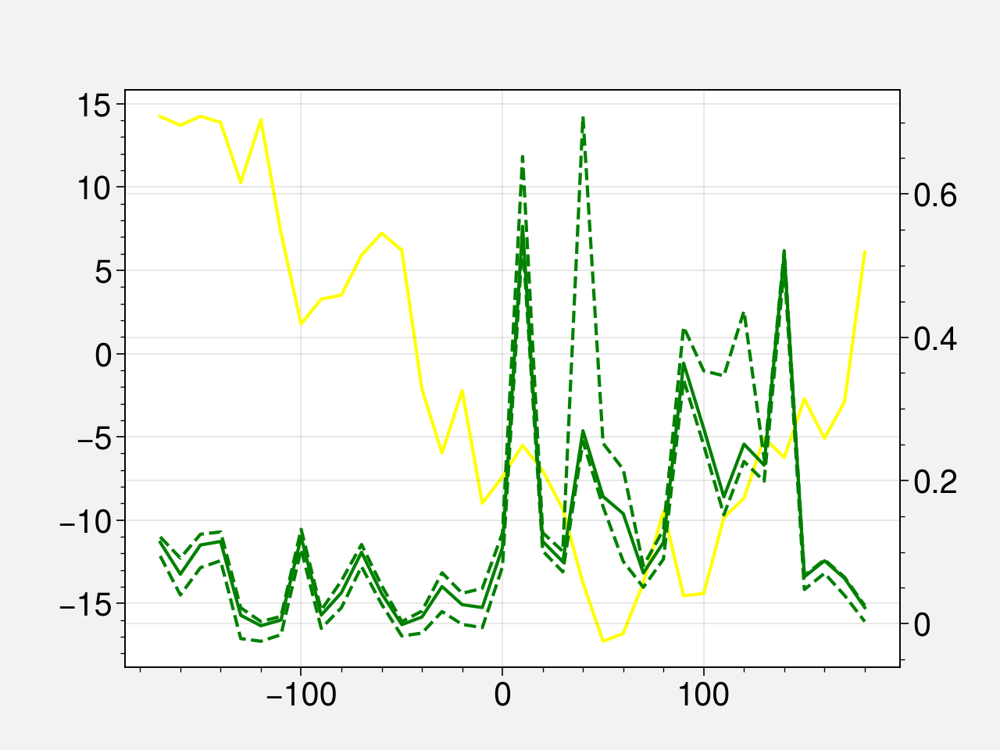

In [109]:
fig = plt.figure(1)
ax  = fig.add_subplot(1,1,1)
ax.plot(OLR_binned_by_phase['phase_bin_edges'][1::],OLR_binned_by_phase['12n90e']['mean'],'yellow')
ax_right = ax.twinx()
#ax_right.plot(SST_RAMA_binned_by_phase['phase_bin_edges'][1::],SST_RAMA_binned_by_phase['0n90e']['mean'],'b')
#ax_right.plot(T_air_RAMA_binned_by_phase['phase_bin_edges'][1::],T_air_RAMA_binned_by_phase['0n90e']['mean'],'r')
ax_right.plot(Rain_RAMA_binned_by_phase['phase_bin_edges'][1::],np.nanmean(Rain_RAMA_binned_by_phase['12n90e']['mean'],axis=1),'g')
ax_right.plot(Rain_RAMA_binned_by_phase['phase_bin_edges'][1::],np.nanmean(Rain_RAMA_binned_by_phase['12n90e']['mean'],axis=1)+
                                                                 np.nanmean(Rain_RAMA_binned_by_phase['12n90e']['90_percentile'],axis=1),'g--')
ax_right.plot(Rain_RAMA_binned_by_phase['phase_bin_edges'][1::],np.nanmean(Rain_RAMA_binned_by_phase['12n90e']['mean'],axis=1)+
                                                                np.nanmean(Rain_RAMA_binned_by_phase['12n90e']['10_percentile'],axis=1),'g--')


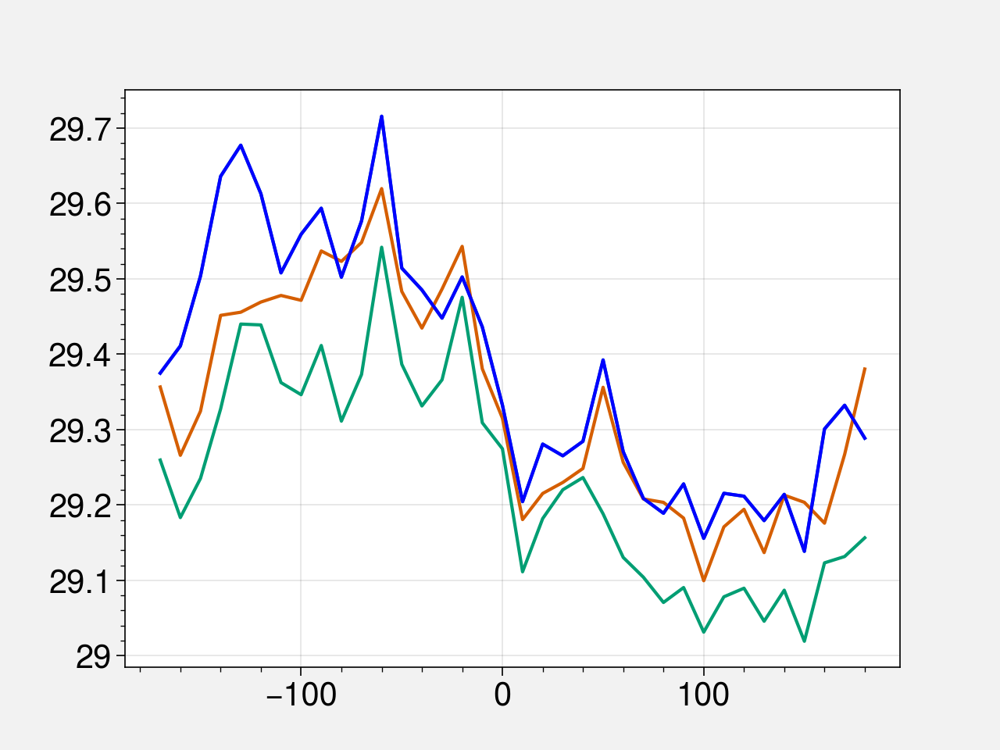

In [113]:
plt.figure(1)
plt.plot(binned_T_profile_RAMA_by_phase['phase_bin_edges'][1::],binned_T_profile_RAMA_by_phase['0n90e']['mean'][:,0:3])
plt.plot(SST_RAMA_binned_by_phase['phase_bin_edges'][1::],SST_RAMA_binned_by_phase['0n90e']['mean'],'b')


#plt.figure(2)
#plt.pcolormesh(binned_T_profile_RAMA_by_phase['phase_bin_edges'][1::],-T_profiles_RAMA['0n67e']['T_20']['depth'][0:10],binned_T_profile_RAMA_by_phase['0n67e']['mean'][:,0:10].T,cmap=plt.cm.jet)
#plt.contourf(binned_T_profile_RAMA_by_phase['phase_bin_edges'][1::],-T_profiles_RAMA['0n67e']['T_20']['depth'][0:10],binned_T_profile_RAMA_by_phase['0n67e']['mean'][:,0:10].T,25,cmap=plt.cm.jet)
#plt.colorbar()

#plt.figure(3)
#plt.pcolormesh(binned_T_profile_RAMA_by_phase['phase_bin_edges'][1::],-T_profiles_RAMA['0n67e']['T_20']['depth'][0:10],binned_T_profile_RAMA_by_phase['0n67e']['N_points'][:,0:10].T,cmap=plt.cm.jet)
#plt.contourf(binned_T_profile_RAMA_by_phase['phase_bin_edges'][1::],-T_profiles_RAMA['0n67e']['T_20']['depth'][0:10],binned_T_profile_RAMA_by_phase['0n80.5e']['mean'][:,0:10].T,25,cmap=plt.cm.jet)
#plt.colorbar()



In [90]:
binned_T_profile_RAMA_by_phase['phase_bin_edges'].shape

plt.figure(1)
plt.contourf(T_profiles_RAMA_event_catalogue['0n90e']['time'][10],-T_profiles_RAMA['0n90e']['T_20']['depth'][0:5],T_profiles_RAMA_event_catalogue['0n90e']['T_20'][10][:,0:5].T,levels=25,cmap=plt.cm.jet)
#plt.colorbar()


NameError: name 'binned_T_profile_RAMA_by_phase' is not defined

In [ ]:
binned_T_profile_RAMA_by_phase

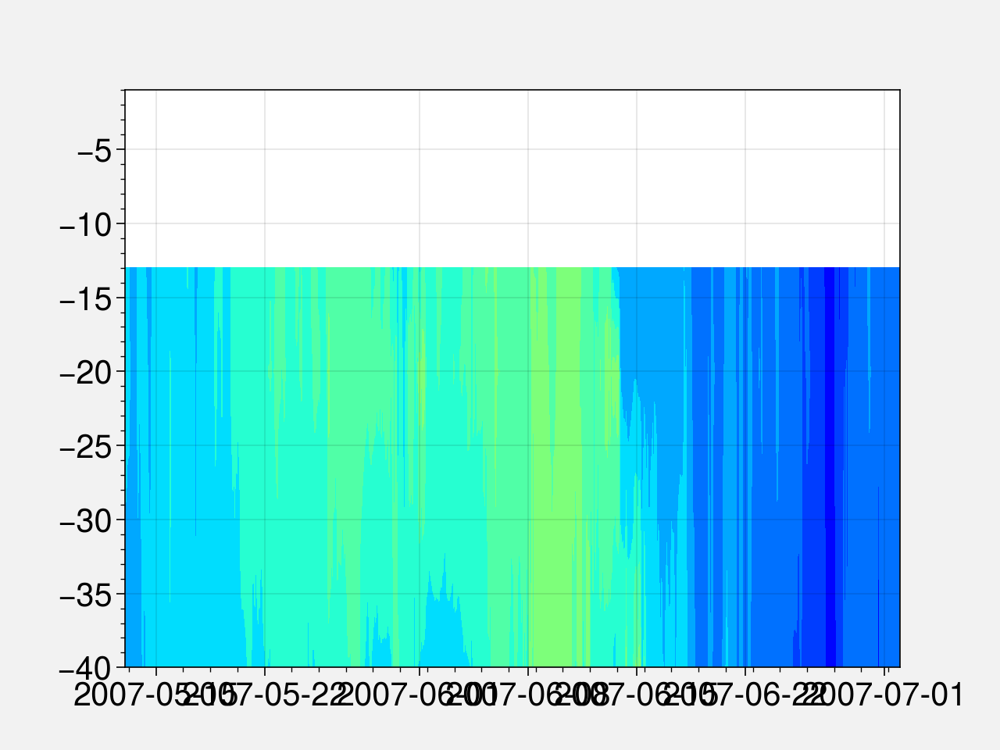

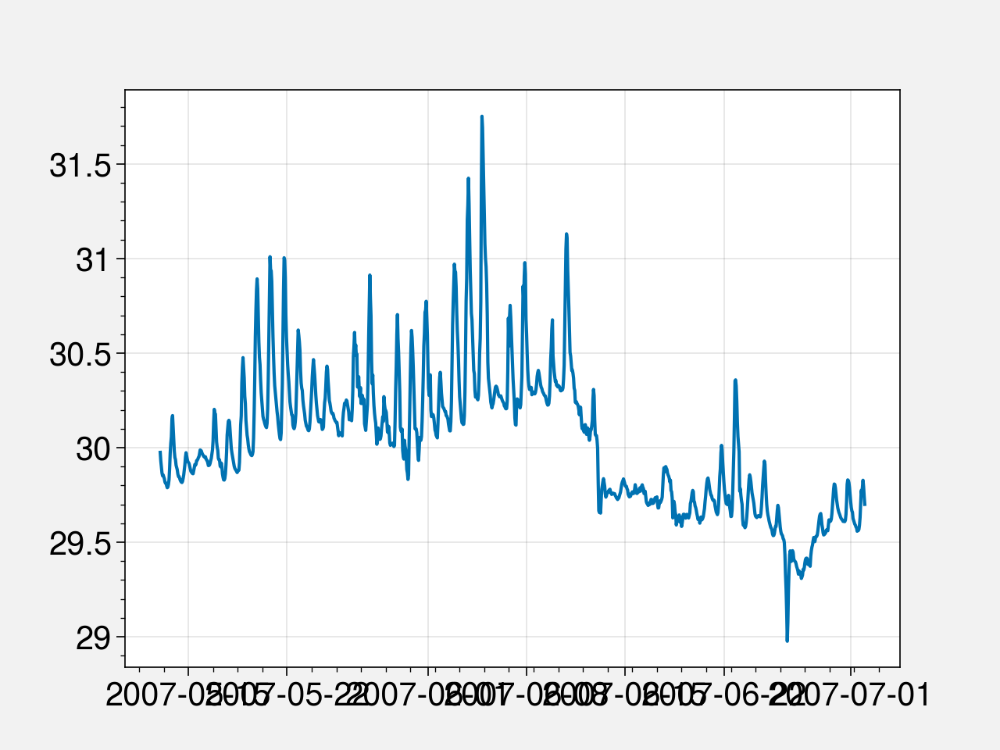

In [89]:
plt.figure(1)
plt.contourf(T_profiles_RAMA_event_catalogue['0n90e']['time'][10],-T_profiles_RAMA['0n90e']['T_20']['depth'][0:5],T_profiles_RAMA_event_catalogue['0n90e']['T_20'][10][:,0:5].T,levels=25,cmap=plt.cm.jet)
#plt.colorbar()

plt.figure(2)
plt.plot(SST_RAMA_event_catalogue['0n90e']['time'][8],SST_RAMA_event_catalogue['0n90e']['T_25'][8])
#plt.colorbar()



In [51]:
binned_LW_rad_RAMA_by_phase['0n80.5e'].keys()

dict_keys(['mean', '90_percentile', '10_percentile'])

Text(0, 0.5, 'Temperature ($^{\\circ}$C)')

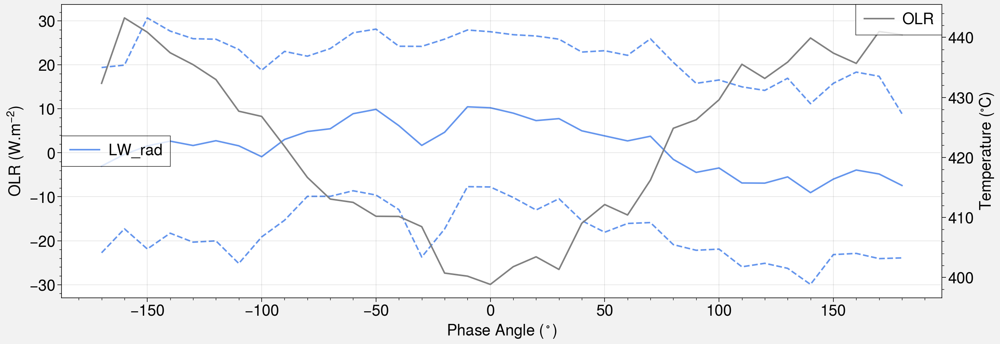

In [55]:
import proplot
fig, axs = proplot.subplots(nrows=1, ncols=1,proj=None,axwidth='30cm',axheight='10cm')
axs.plot(OLR_binned_RAMA_by_phase['phase_bin_edges'][1::],OLR_binned_RAMA_by_phase['0n80.5e']['mean'],color='grey',label='OLR')
axs.legend(loc='upper right')
ax_right  =axs.twinx()
#ax_right.plot(binned_SST_RAMA_by_phase['phase_bin_edges'][1::],binned_T_air_RAMA_by_phase['0n90e']['mean'],label='Air temperature')
#ax_right.plot(binned_SW_rad_RAMA_by_phase['phase_bin_edges'][1::],binned_SW_rad_RAMA_by_phase['0n80.5e']['mean'],label='SW_rad')
ax_right.plot(binned_LW_rad_RAMA_by_phase['phase_bin_edges'][1::],binned_LW_rad_RAMA_by_phase['0n80.5e']['mean'],label='LW_rad',color='cornflowerblue')
ax_right.plot(binned_LW_rad_RAMA_by_phase['phase_bin_edges'][1::],binned_LW_rad_RAMA_by_phase['0n80.5e']['90_percentile'],linestyle='dashed',color='cornflowerblue')
ax_right.plot(binned_LW_rad_RAMA_by_phase['phase_bin_edges'][1::],binned_LW_rad_RAMA_by_phase['0n80.5e']['10_percentile'],linestyle='dashed',color='cornflowerblue')

ax_right.legend(loc='center left',ncol=1)
axs.set_xlabel('Phase Angle ($^\circ$)')
axs.set_ylabel('OLR (W.m$^{-2}$)')
ax_right.set_ylabel('Temperature ($^{\circ}$C)')

In [ ]:
OLR_for_all_events   = []
phase_for_all_events = []
olr_for_all_events = []
for i_event in range(OLR_event_catalogue['n_events']):
    
    #OLR_for_all_events.append(event_catalogue_for_station['Sat_OLR'][i_event])
    phase_for_all_events.append(OLR_event_catalogue['PC_phase'][i_event])
    OLR_for_all_events.append(OLR_event_catalogue['olr'][i_event])
    
OLR_for_all_events = np.concatenate( OLR_for_all_events, axis=0 )
phase_for_all_events=np.concatenate( phase_for_all_events, axis=0 )
#air_temp_for_all_events = np.concatenate(air_temp_for_all_events,axis=0)
nan_mask = np.isnan(OLR_for_all_events)



#bin_means, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, np.nanmean, bins=np.arange(-180,180,5))
#bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, percentile10, bins=np.arange(-180,180,5))
#bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, percentile90, bins=np.arange(-180,180,5))
#air_temp_for_all_events
OLR_bin_means, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], OLR_for_all_events[np.logical_not(nan_mask)], np.nanmean, bins=np.arange(-180,180,5))
OLR_bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], OLR_for_all_events[np.logical_not(nan_mask)], percentile10, bins=np.arange(-180,180,5))
OLR_bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], OLR_for_all_events[np.logical_not(nan_mask)], percentile90, bins=np.arange(-180,180,5))





In [34]:
import scipy.stats as scipy_stats


OLR_for_all_events   = []
phase_for_all_events = []
air_temp_for_all_events = []
for i_event in range(blah['5s95e']['n_events']):
    
    #OLR_for_all_events.append(event_catalogue_for_station['Sat_OLR'][i_event])
    phase_for_all_events.append(T_air_RAMA_event_catalogue['5s95e']['PC_phase'][i_event])
    air_temp_for_all_events.append(T_air_RAMA_event_catalogue['5s95e']['AT_21'][i_event])
    
#OLR_for_all_events = np.concatenate( OLR_for_all_events, axis=0 )
phase_for_all_events=np.concatenate( phase_for_all_events, axis=0 )
air_temp_for_all_events = np.concatenate(air_temp_for_all_events,axis=0)
nan_mask = np.isnan(air_temp_for_all_events)



#bin_means, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, np.nanmean, bins=np.arange(-180,180,5))
#bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, percentile10, bins=np.arange(-180,180,5))
#bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, percentile90, bins=np.arange(-180,180,5))
#air_temp_for_all_events
bin_means, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], air_temp_for_all_events[np.logical_not(nan_mask)], np.nanmean, bins=np.arange(-180,180,5))
bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], air_temp_for_all_events[np.logical_not(nan_mask)], percentile10, bins=np.arange(-180,180,5))
bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], air_temp_for_all_events[np.logical_not(nan_mask)], percentile90, bins=np.arange(-180,180,5))


In [39]:
import scipy.stats as scipy_stats


OLR_for_all_events   = []
phase_for_all_events = []
SST_for_all_events = []
for i_event in range(blah['5s95e']['n_events']):
    
    #OLR_for_all_events.append(event_catalogue_for_station['Sat_OLR'][i_event])
    phase_for_all_events.append(SST_RAMA_event_catalogue['5s95e']['PC_phase'][i_event])
    SST_for_all_events.append(SST_RAMA_event_catalogue['5s95e']['T_25'][i_event])
    
#OLR_for_all_events = np.concatenate( OLR_for_all_events, axis=0 )
phase_for_all_events=np.concatenate( phase_for_all_events, axis=0 )
SST_for_all_events = np.concatenate(SST_for_all_events,axis=0)
nan_mask = np.isnan(SST_for_all_events)



#bin_means, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, np.nanmean, bins=np.arange(-180,180,5))
#bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, percentile10, bins=np.arange(-180,180,5))
#bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events, OLR_for_all_events, percentile90, bins=np.arange(-180,180,5))
#air_temp_for_all_events
SST_bin_means, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], SST_for_all_events[np.logical_not(nan_mask)], np.nanmean, bins=np.arange(-180,180,5))
SST_bin_percentile_10, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], SST_for_all_events[np.logical_not(nan_mask)], percentile10, bins=np.arange(-180,180,5))
SST_bin_percentile_90, bin_edges, binnumber = scipy_stats.binned_statistic(phase_for_all_events[np.logical_not(nan_mask)], SST_for_all_events[np.logical_not(nan_mask)], percentile90, bins=np.arange(-180,180,5))


In [38]:
SST_for_all_events.shape

(45707,)

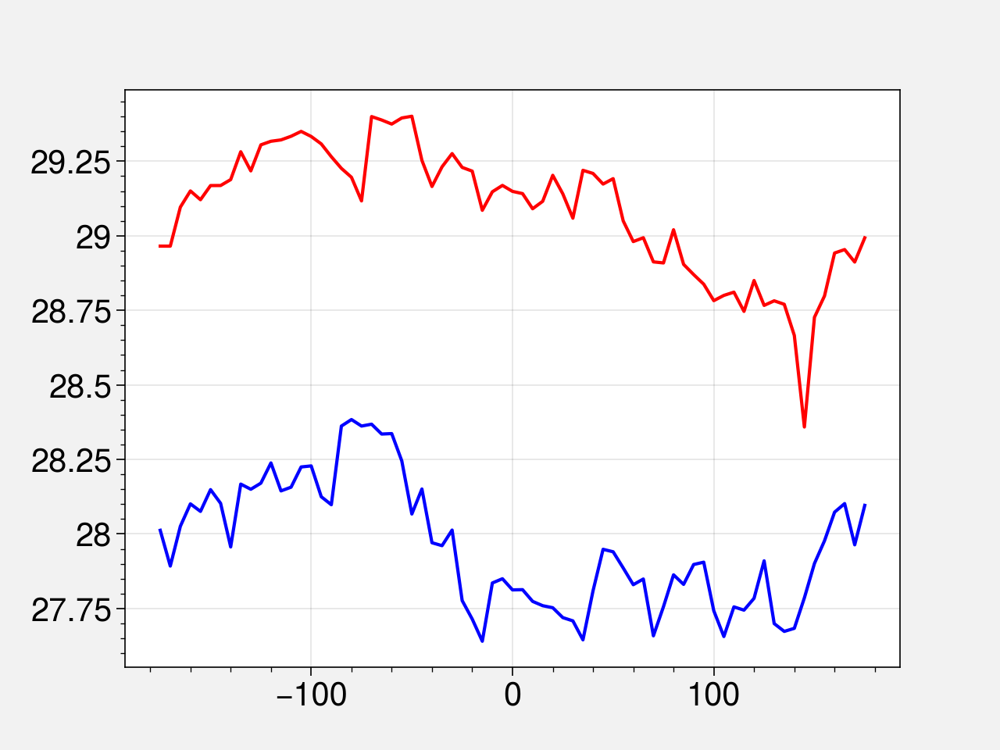

In [40]:

plt.plot(bin_edges[1::],bin_means,'b')
plt.plot(bin_edges[1::],SST_bin_means,'r')
#plt.plot(bin_edges[1::],bin_percentile_10,'r--')
#plt.plot(bin_edges[1::],bin_percentile_90,'g--')

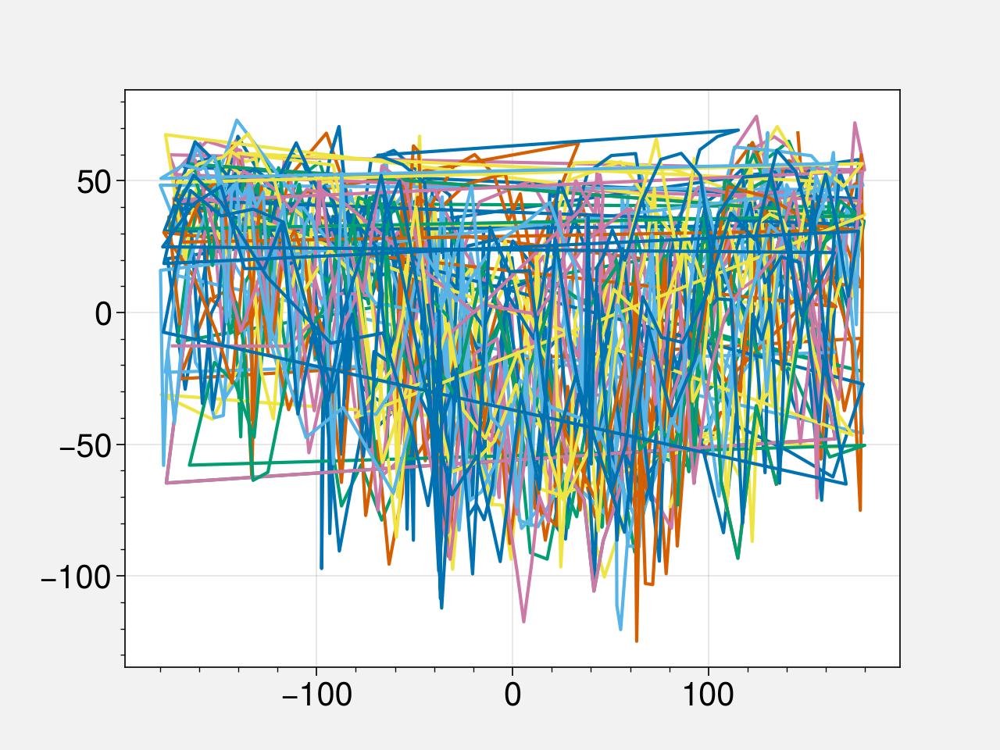

In [78]:
for i_event in range(event_catalogue_for_station['n_events']):
    event_catalogue_for_station['Sat_OLR'][i_event]
    plt.plot(event_catalogue_for_station['PC_phase'][i_event],event_catalogue_for_station['Sat_OLR'][i_event])
    
    

In [37]:
print(len(event_catalogue_for_station['PC_magnitude']) )
print(len(event_catalogue_for_station['Sat_OLR']))
print(len(event_catalogue_for_station['AT_21']))

25
25
25


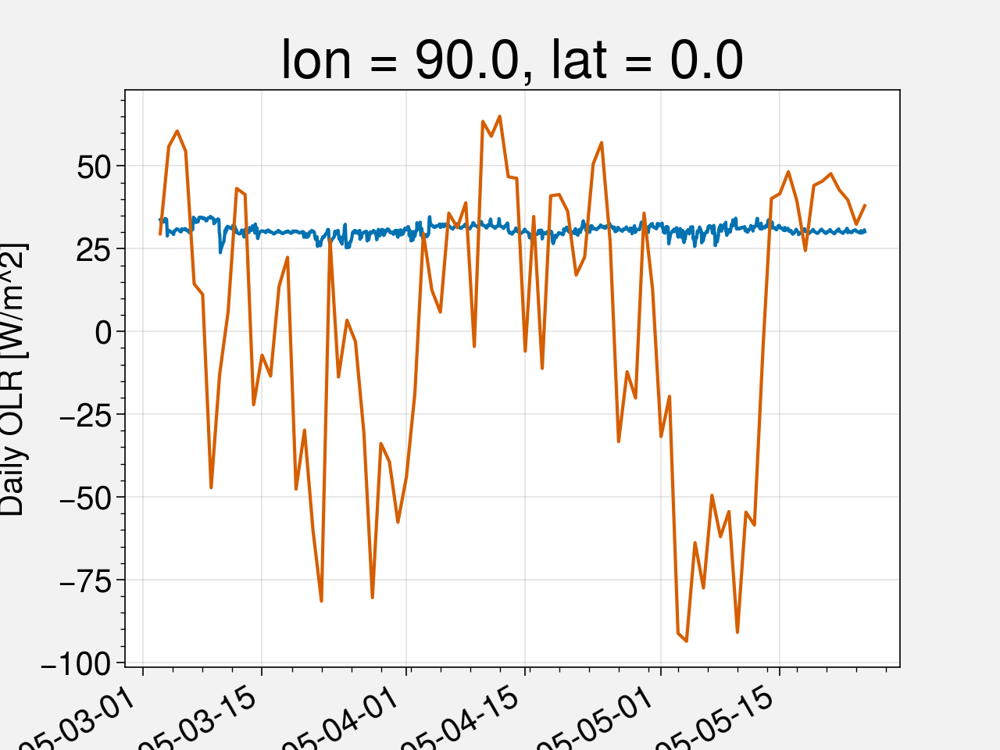

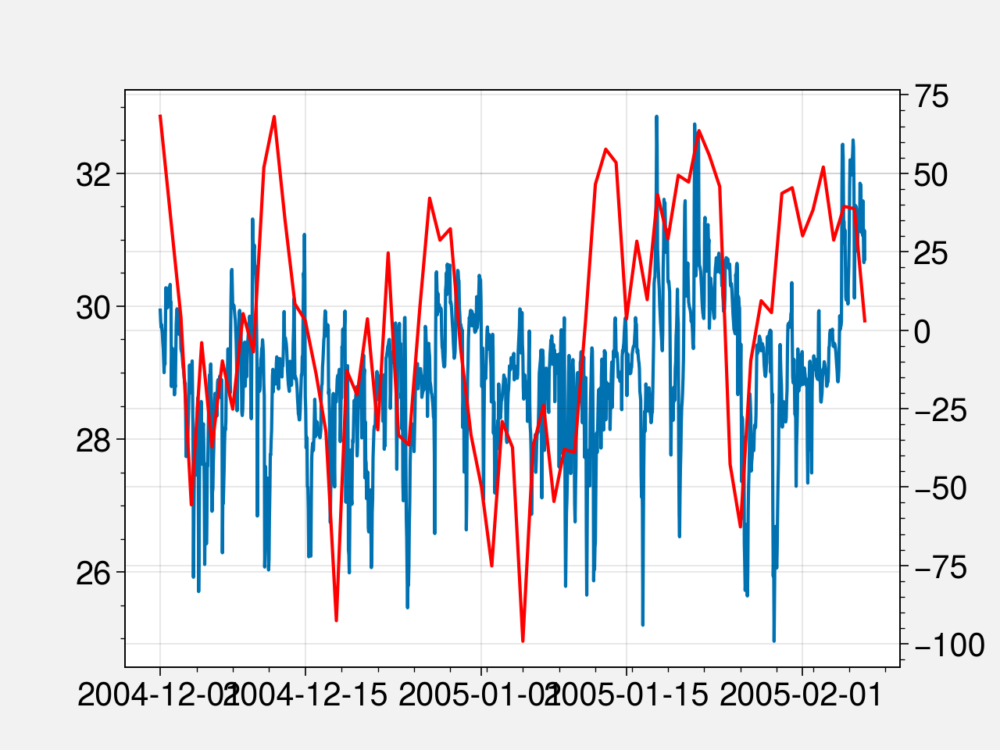

In [36]:
fig = plt.figure(1)
ax  = fig.add_subplot(1,1,1)

ax.plot(event_catalogue_for_station['time'][1],event_catalogue_for_station['AT_21'][1])
#plt.plot(air_temperature['time'],air_temperature)
#plt.figure(2)
ax2=ax.twinx()
ax2.plot(event_catalogue_for_station['Sat_OLR'][1]['time'],event_catalogue_for_station['Sat_OLR'][1],'r')

In [27]:
event_catalogue_for_station['PC_phase'][1].size/24 - 30

40.04166666666667

In [22]:
event_catalogue_for_station['initiation_time'][-1]

numpy.datetime64('2011-03-17T00:00:00.000000000')

In [24]:
mooring_variable_for_event['time'][0]

<xarray.DataArray 'time' ()>
array('2011-03-22T05:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2011-03-22T05:00:00
    depth    float32 -3.0
    lat      float32 -12.0
    lon      float32 93.0

In [133]:
mooring_variable_for_event.shape

(972,)

In [134]:
est_air_temp.size

1993

In [64]:
event_catalogue_for_station['days']

[array([-15.        , -14.95833333, -14.91666667, ...,  97.875     ,
         97.91666667,  97.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ..., 110.875     ,
        110.91666667, 110.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ...,  76.875     ,
         76.91666667,  76.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ...,  65.875     ,
         65.91666667,  65.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ...,  69.875     ,
         69.91666667,  69.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ..., 118.875     ,
        118.91666667, 118.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ...,  80.875     ,
         80.91666667,  80.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ...,  70.875     ,
         70.91666667,  70.95833333]),
 array([-15.        , -14.95833333, -14.91666667, ..., 143.875     ,
        143.91666667, 143.95833333]),
 array([-15.        , -14.95833333, -

In [25]:
np.asarray(MJO_event['initiation_time']).dtype

dtype('<M8[ns]')

In [39]:
OLR_PC_phase

<xarray.DataArray 'pc__olr' (time: 13879)>
array([-157.65286094,   82.61294293,   82.68721544, ...,  -44.6401933 ,
        -45.29582042,  -91.7888825 ])
Coordinates:
  * time     (time) datetime64[ns] 1982-01-01 1982-01-02 ... 2019-12-31

In [26]:
print(mooring_variable_for_event['time'][0].values)
print(mooring_variable_for_event['time'][-1].values)

2008-09-02T00:00:00.000000000
2008-11-04T00:00:00.000000000


In [27]:
print(sat_OLR_for_event['time'][0].values)
print(sat_OLR_for_event['time'][-1].values)

2008-09-02T00:00:00.000000000
2008-11-04T00:00:00.000000000


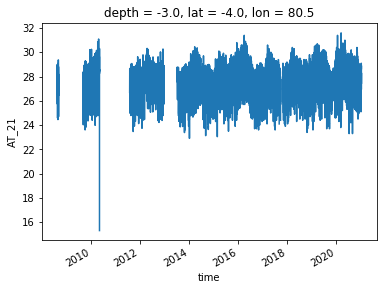

In [28]:
air_temperature.plot()

In [102]:
type(value)

list

In [99]:
idx_MJO_events

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

In [88]:
idx_MJO_events[0].size

37

In [52]:
unique_T_air_RAMA

NameError: name 'unique_T_air_RAMA' is not defined